In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sqlalchemy
import math
import datetime
from psycopg2.extras import NumericRange
import pickle
import statsmodels.api as sm
from xgboost import XGBRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.multioutput import MultiOutputRegressor
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split, cross_val_score, KFold, GridSearchCV, RandomizedSearchCV
from sklearn.tree import DecisionTreeRegressor
from scipy import interpolate, stats
import matplotlib.ticker as ticker
from matplotlib.legend_handler import HandlerBase
from matplotlib.text import Text
import dask
import dask.distributed
from dask.distributed import Client, LocalCluster
import joblib
import os
import sys
import cartopy
from cartopy import crs as ccrs
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter, LatitudeLocator, LongitudeLocator

In [2]:
class TextHandler(HandlerBase):
    def create_artists(self, legend, tup, xdescent, ydescent,
                       width, height, fontsize, trans):
        tx = Text(width/2.,height/2,tup[0], fontsize=fontsize,
                  ha="center", va="center", color=tup[1], fontweight="bold")
        return [tx]

class MarkerHandler(HandlerBase):
    def create_artists(self, legend, tup, xdescent, ydescent,
                        width, height, fontsize, trans):
        return [plt.Line2D([width/2], [height/2.], ls="",
                       marker=tup[0], color=tup[1], transform=trans)]
    
labelsize_axis = 21
fontsize_legend = 18
titlesize_legend = 21

# Building predictive model

In [23]:
input_data = pd.read_csv(f'DBD-test-set.csv')

In [24]:
input_df = input_data[['CompositeDepth', 'DryBulkDensity', 'WaterContent', 'TOC_mg_g','Silt_percent','Clay_percent']]

In [25]:
y = input_df[['DryBulkDensity', 'WaterContent']]
X = input_df[['CompositeDepth','TOC_mg_g','Silt_percent','Clay_percent']]

In [35]:
y_ln_DBD = np.log(y['DryBulkDensity'])

In [36]:
y_WC_div_100 = y['WaterContent']/100*(-1)

In [39]:
y.loc[:,'DryBulkDensity'] = y_ln_DBD
y.loc[:,'WaterContent']= y_WC_div_100

script_2487454100826917915:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
script_2487454100826917915:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


### Without cross-validation

In [9]:
X_train_temp, X_test, y_train_temp, y_test = train_test_split(X, 
                                                              y, 
                                                              test_size=0.2, 
                                                              random_state=2022)

In [12]:
X_train, X_valid, y_train, y_valid = train_test_split(X_train_temp, y_train_temp, 
                                                      test_size=0.25, random_state=2022)

In [13]:
def scoring(model_dict, train_X, train_y, test_X, test_y):
    target_variables = ['DryBulkDensity', 'WaterContent']
    water_content_df = pd.DataFrame()
    dry_bulk_density_df = pd.DataFrame()
    for name, model in model_dict.items():
        modeling_output = model.fit(train_X, train_y)
        test_y = test_y.reset_index(drop = True)
        prediction_results = model.predict(test_X)
        prediction_df = pd.DataFrame(prediction_results, columns = ['DryBulkDensity', 'WaterContent'])
        for variable in target_variables:
            if variable == 'DryBulkDensity':
                pred_var = np.exp(prediction_df[variable])
                label_var = np.exp(test_y[variable])
            else:
                pred_var = prediction_df[variable]*100
                label_var = test_y[variable]*100
            mae = mean_absolute_error(label_var, pred_var)
            rae = math.sqrt(sum((pred_var - label_var)**2))/math.sqrt(sum(label_var**2))
            mse = mean_squared_error(label_var, pred_var, squared=True)
            rmse = mean_squared_error(label_var, pred_var, squared=False)
            rse = sum((pred_var - label_var)**2)/sum((label_var - label_var.mean())**2)
            rrse = math.sqrt(rse)
            r2 = r2_score(label_var, pred_var)
            result_list = [mae, rae, mse, rmse, rrse, r2]
            result_df = pd.DataFrame([np.round(i, 4) for i in result_list], columns = [name])
            if variable == 'DryBulkDensity':
                dry_bulk_density_df = pd.concat([dry_bulk_density_df, result_df], axis = 1)
            else:
                water_content_df = pd.concat([water_content_df, result_df], axis = 1)
            
    water_content_df.index = dry_bulk_density_df.index = ['Mean Absolute Error', 'Relative Absolute Error', 'Mean Squared Error', 'Root Mean Squared Error', 'Root Relative Squared Error','R² Score']
    return dry_bulk_density_df, water_content_df

In [14]:
mlr_reg = MultiOutputRegressor(LinearRegression())
rf_reg = MultiOutputRegressor(RandomForestRegressor(random_state=2022))
xgb_reg = MultiOutputRegressor(XGBRegressor(random_state=2022))
gb_reg = MultiOutputRegressor(GradientBoostingRegressor(random_state=2022))
knn_reg = MultiOutputRegressor(KNeighborsRegressor())
svr_reg = MultiOutputRegressor(SVR())
ada_reg = MultiOutputRegressor(AdaBoostRegressor(DecisionTreeRegressor(), random_state=2022))

In [15]:
model_dict = {'Linear Regression': mlr_reg, 
              'Random Forest Regression': rf_reg, 
              'Extreme Gradient Boosting': xgb_reg, 
              'Gradient Boosting': gb_reg, 
              'K-nearest Neighbor': knn_reg, 
              'Support Vector Regression': svr_reg,
             'AdaBoost Regression': ada_reg}

In [16]:
dbd_scoring, wc_scoring = scoring(model_dict, X_train, y_train, X_valid, y_valid)

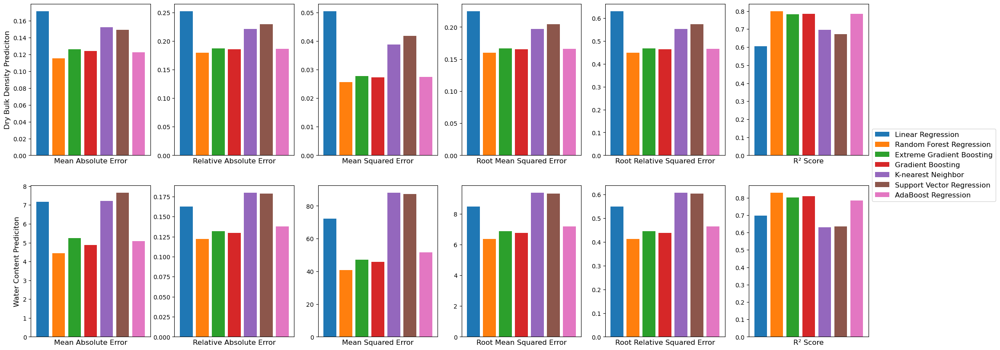

In [17]:
num_models = len(model_dict.keys())
num_metric = len(dbd_scoring.index)
num_params = 2
####
fig, axes = plt.subplots(nrows = num_params, ncols = num_metric, figsize=(25,10))
for i, ax in enumerate(axes.flatten()):
    if i < (len(axes.flatten())/2): 
        for x in np.arange(num_models):
            ax.bar(x, dbd_scoring.iloc[i,x], label = dbd_scoring.columns[x])
        ax.set_xlabel(dbd_scoring.index[i], size = 12)
        ax.set_xticks([])
        if i == 0:
            ax.set_ylabel('Dry Bulk Density Prediciton', size = 12)
    else:
        j = i-int(len(axes.flatten())/2)
        for x in np.arange(num_models):
            ax.bar(x, wc_scoring.iloc[j,x], label = wc_scoring.columns[x])
        ax.set_xlabel(wc_scoring.index[j], size = 12)
        ax.set_xticks([])
        if j == 0:
            ax.set_ylabel('Water Content Prediciton', size = 12)
plt.legend(fontsize = 12, bbox_to_anchor = (1,1.4))  
#plt.savefig(f'Model_results.jpg', dpi = 600, bbox_inches = 'tight')
plt.show()

### With cross-validation

In [18]:
def cv_scoring(model_dict, X_input, y_input, splits):
    target_variables = ['DryBulkDensity', 'WaterContent']
    water_content_df = pd.DataFrame()
    dry_bulk_density_df = pd.DataFrame()
    mae_dict = {targets: {keys: [] for keys in model_dict.keys()} for targets in target_variables}
    rae_dict = {targets: {keys: [] for keys in model_dict.keys()} for targets in target_variables}
    mse_dict = {targets: {keys: [] for keys in model_dict.keys()} for targets in target_variables}
    rmse_dict = {targets: {keys: [] for keys in model_dict.keys()} for targets in target_variables}
    rrse_dict = {targets: {keys: [] for keys in model_dict.keys()} for targets in target_variables}
    r2_dict = {targets: {keys: [] for keys in model_dict.keys()} for targets in target_variables}
    folds = KFold(n_splits = splits, shuffle = True, random_state = 2022)
    ###
    for train_index, test_index in folds.split(X):
        cv_X_train, cv_X_test = X_input.iloc[train_index,:], X_input.iloc[test_index,:]
        cv_y_train, cv_y_test = y_input.iloc[train_index,:], y_input.iloc[test_index,:]
        for name, model in model_dict.items():
            modeling_output = model.fit(cv_X_train, cv_y_train)
            cv_y_test = cv_y_test.reset_index(drop = True)
            prediction_results = model.predict(cv_X_test)
            prediction_df = pd.DataFrame(prediction_results, columns = ['DryBulkDensity', 'WaterContent'])
            for variable in target_variables:
                if variable == 'DryBulkDensity':
                    pred_var = np.exp(prediction_df[variable])
                    label_var = np.exp(cv_y_test[variable])
                else:
                    pred_var = prediction_df[variable]*100
                    label_var = cv_y_test[variable]*100
                mae = mean_absolute_error(label_var, pred_var)
                mae_dict[variable][name].append(mae)
                rae = math.sqrt(sum((pred_var - label_var)**2))/math.sqrt(sum(label_var**2))
                rae_dict[variable][name].append(rae)
                mse = mean_squared_error(label_var, pred_var, squared=True)
                mse_dict[variable][name].append(mse)
                rmse = mean_squared_error(label_var, pred_var, squared=False)
                rmse_dict[variable][name].append(rmse)
                rse = sum((pred_var - label_var)**2)/sum((label_var - label_var.mean())**2)
                rrse = math.sqrt(rse)
                rrse_dict[variable][name].append(rrse)
                r2 = r2_score(label_var, pred_var)
                r2_dict[variable][name].append(r2)
    all_dict_list = [mae_dict, rae_dict, mse_dict, rmse_dict, rrse_dict, r2_dict]
    ### 
    for target in target_variables:
        for name, model in model_dict.items():
            result_list = []
            for indi_dict in all_dict_list:
                result_list.append(sum(indi_dict[target][name]) / len(indi_dict[target][name]))
            result_df = pd.DataFrame([np.round(i, 4) for i in result_list], columns = [name])
            if target == 'DryBulkDensity':
                dry_bulk_density_df = pd.concat([dry_bulk_density_df, result_df], axis = 1)
            else:
                water_content_df = pd.concat([water_content_df, result_df], axis = 1)
    ###
    water_content_df.index = dry_bulk_density_df.index = ['Mean Absolute Error', 'Relative Absolute Error', 'Mean Squared Error', 'Root Mean Squared Error', 'Root Relative Squared Error','R² Score']
    return dry_bulk_density_df, water_content_df, result_df

In [19]:
cv_dbd_scoring, cv_wc_scoring, result_df = cv_scoring(model_dict, X, y, 5)

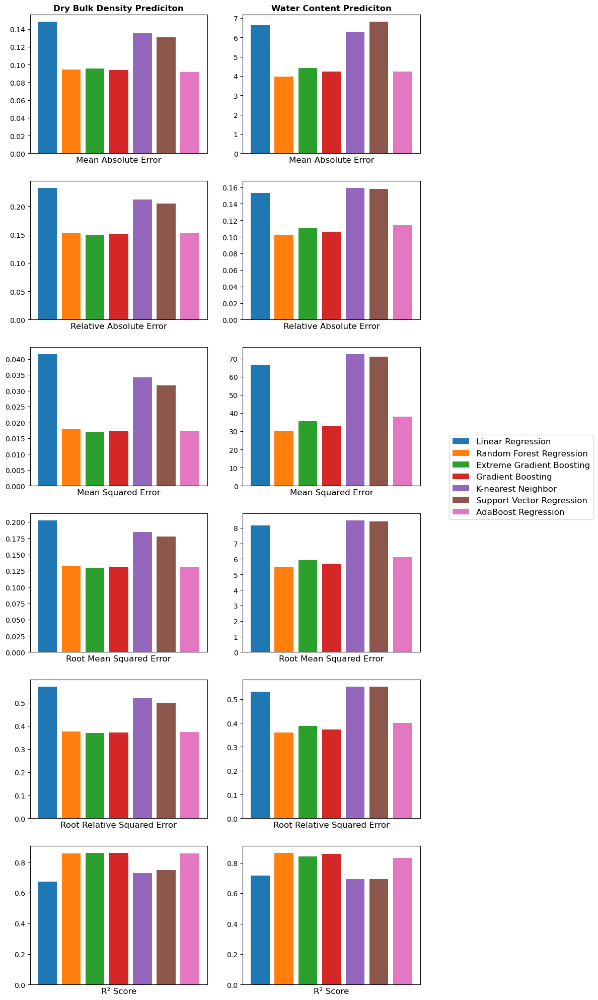

In [20]:
num_models = len(model_dict.keys())
num_metric = len(cv_dbd_scoring.index)
num_params = 2
####
#fig, axes = plt.subplots(nrows = num_params, ncols = num_metric, figsize=(25,10)) # horizontal
fig, axes = plt.subplots(nrows = num_metric, ncols = num_params, figsize=(10,25))
#for i, ax in enumerate(axes.flatten()):  # horizontal
for i, ax in enumerate(axes.T.flatten()):
    if i < (len(axes.flatten())/2): 
        for x in np.arange(num_models):
            ax.bar(x, cv_dbd_scoring.iloc[i,x], label = cv_dbd_scoring.columns[x])
        ax.set_xlabel(cv_dbd_scoring.index[i], size = 12)
        ax.set_xticks([])
        if i == 0:
            ax.set_title('Dry Bulk Density Prediciton', size = 12,fontweight='bold')
        #    ax.set_ylabel('Dry Bulk Density Prediciton', size = 12)  # horizontal
    else:
        j = i-int(len(axes.flatten())/2)
        for x in np.arange(num_models):
            ax.bar(x, cv_wc_scoring.iloc[j,x], label = cv_wc_scoring.columns[x])
        ax.set_xlabel(cv_wc_scoring.index[j], size = 12)
        ax.set_xticks([]) 
        if j == 0: 
            ax.set_title('Water Content Prediciton', size = 12,fontweight='bold')
        #    ax.set_ylabel('Water Content Prediciton', size = 12)  # horizontal
#plt.legend(fontsize = 12, bbox_to_anchor = (1,1.4))   # horizontal
plt.legend(fontsize = 12, bbox_to_anchor = (2,4))  
#plt.savefig(f'Model_results_cross_validation_vertical.pdf', dpi = 600, bbox_inches = 'tight')
plt.show()

In [21]:
cv_wc_scoring

,Linear Regression,Random Forest Regression,Extreme Gradient Boosting,Gradient Boosting,K-nearest Neighbor,Support Vector Regression,AdaBoost Regression
Mean Absolute Error,6.6296,3.9679,4.4254,4.2332,6.3042,6.8264,4.2323
Relative Absolute Error,0.1529,0.1027,0.1106,0.1062,0.1594,0.1578,0.1139
Mean Squared Error,66.7129,30.4066,35.6869,32.7086,72.5261,71.1344,38.0237
Root Mean Squared Error,8.1604,5.4897,5.9163,5.6865,8.4945,8.4283,6.1015
Root Relative Squared Error,0.5323,0.3607,0.3887,0.3725,0.5535,0.5520,0.4011
R² Score,0.7153,0.8664,0.8433,0.8579,0.6920,0.6916,0.8322


### Hyperparameter tuning

In [22]:
from skopt import BayesSearchCV

In [23]:
#### RANDOM FOREST REGRESSION
rf_n_estimators = [int(x) for x in np.linspace(100, 1000, 10)]
rf_n_estimators.append(1500)
rf_n_estimators.append(2000)

rf_max_depth = [int(x) for x in np.linspace(5, 55, 11)]
rf_max_depth.append(None)

rf_grid = {
    'estimator__n_estimators': rf_n_estimators,
    'estimator__criterion': ['mse', 'mae'],
    'estimator__max_depth': rf_max_depth,
    'estimator__min_samples_split': [int(x) for x in np.linspace(2, 10, 9)],
    'estimator__max_features': [None, 'sqrt', 'log2'],
    'estimator__min_impurity_decrease': [0.0, 0.05, 0.1],
    'estimator__bootstrap': [True, False]
}

In [24]:
### EXTREME GRADIENT BOOSTING
xgb_grid = {
    'estimator__n_estimators': [int(x) for x in np.linspace(200, 2000, 10)],
    'estimator__max_depth': [int(x) for x in np.linspace(2, 20, 10)],
    'estimator__min_child_weight': [int(x) for x in np.linspace(1, 10, 10)],
    'estimator__tree_method': ['auto', 'exact', 'approx', 'hist', 'gpu_hist'],
    #'estimator__eta': [x for x in np.linspace(0.1, 0.6, 6)],
    'estimator__gamma': [int(x) for x in np.linspace(0, 0.5, 6)],
    'estimator__objective': ['reg:squarederror', 'reg:squaredlogerror']
}

In [25]:
### GRADIENT BOOSTING
gb_grid = {
    'estimator__loss': ['ls', 'lad', 'huber', 'quantile'],
    'estimator__learning_rate': [0.001, 0.01, 0.1],
    'estimator__n_estimators': [int(x) for x in np.linspace(100, 2000, 20)],
    'estimator__subsample': [0.25, 0.5, 0.75, 1],
    'estimator__max_depth': [int(x) for x in range(1,11)],
    'estimator__random_state': [2022],
    #'estimator__max_features': ['auto', 'sqrt', 'log2', None]
}

In [26]:
### K-NEAREST NEIGHBOR
knn_grid = {
    'estimator__n_neighbors': [int(x) for x in range(3,11)],
    'estimator__weights': ['uniform', 'distance'],
    'estimator__algorithm': ['auto','ball_tree','kd_tree','brute'],
    'estimator__leaf_size': [int(x) for x in np.linspace(10,50,5)]
}

In [27]:
### SUPPORT VECTOR REGRESSION
svr_grid = {
    'estimator__kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
    'estimator__degree': [int(x) for x in range(3,8)],
    'estimator__coef0': [0.01, 0.1, 0.5, 1],
    'estimator__C': [1, 5, 10, 50, 100],
    'estimator__epsilon': [0.001, 0.01, 0.1, 1]
}

In [28]:
### ADABOOST REGRESSION
ada_grid = {
    'estimator__base_estimator': [DecisionTreeRegressor(), RandomForestRegressor()],
    'estimator__n_estimators': rf_n_estimators,
    'estimator__learning_rate': [0.001, 0.01, 0.1],
    'estimator__loss': ['linear', 'square', 'exponential'],
    'estimator__random_state': [2022]
}

In [29]:
opti_model_dict = {
    'Random Forest Regression': rf_reg, 
    #'Extreme Gradient Boosting': xgb_reg, 
    'Gradient Boosting': gb_reg, 
    'K-nearest Neighbor': knn_reg, 
    'Support Vector Regression': svr_reg,
    'AdaBoost Regression': ada_reg
}

In [30]:
opti_grid_dict = {
    'Random Forest Regression': rf_grid, 
    #'Extreme Gradient Boosting': xgb_grid, 
    'Gradient Boosting': gb_grid, 
    'K-nearest Neighbor': knn_grid, 
    'Support Vector Regression': svr_grid,
    'AdaBoost Regression': ada_grid
}

In [31]:
result_opt_params = {}

In [32]:
### Commented out for quick run through
#for name, model in opti_model_dict.items():
#    #opt = BayesSearchCV(
#        #search_spaces=opti_grid_dict[name],
#        
#    opt = RandomizedSearchCV(
#        estimator=model,
#        param_distributions=opti_grid_dict[name],
#        scoring='neg_root_mean_squared_error',
#        n_iter=50,
#        cv=KFold(n_splits = 5, shuffle = True, random_state = 2022),
#        random_state = 2022
#    )
#    indi_fit = opt.fit(X_train_temp, y_train_temp)
#    result_opt_params[name] = indi_fit.best_params_

In [33]:
result_opt_params

{}

In [34]:
optimized_model_dict = {
    'Linear Regression': MultiOutputRegressor(LinearRegression()), 
    'Random Forest Regression': MultiOutputRegressor(RandomForestRegressor(n_estimators=1000, min_samples_split=4, min_impurity_decrease=0.0, max_features=None, max_depth=30, 
                                                                           criterion='mae', bootstrap=True, random_state=2022)), 
    'Extreme Gradient Boosting': MultiOutputRegressor(XGBRegressor(random_state=2022)), 
    'Gradient Boosting': MultiOutputRegressor(GradientBoostingRegressor(subsample=0.25, random_state=2022, n_estimators=1400, max_depth=5, loss='ls', learning_rate=0.01)), 
    'K-nearest Neighbor': MultiOutputRegressor(KNeighborsRegressor(weights='uniform', n_neighbors=5, leaf_size=50, algorithm='auto')), 
    'Support Vector Regression': MultiOutputRegressor(SVR(kernel='poly', epsilon=0.01, degree=3, coef0=0.01, C=50)),
    'AdaBoost Regression': MultiOutputRegressor(AdaBoostRegressor(RandomForestRegressor(), random_state=2022, n_estimators=300, loss='exponential', learning_rate=0.001))
}

In [35]:
rf_base = RandomForestRegressor()

In [36]:
### Commented out for quick run through
#rf_opt = BayesSearchCV(
#    estimator=rf_reg,
#    search_spaces=rf_grid,
#    n_iter=1,
#    cv=KFold(n_splits = 5, shuffle = True, random_state = 2022),
#    random_state = 2022
#)

In [37]:
### Commented out for quick run through
#rf_opt.fit(X_train_temp, y_train_temp)

In [38]:
### Commented out for quick run through
#rf_opt.best_params_

In [39]:
### Commented out for quick run through
#rf_random = RandomizedSearchCV(estimator = MultiOutputRegressor(rf_base), param_distributions = rf_grid, scoring = 'neg_root_mean_squared_error',
#                               n_iter = 100, cv = KFold(n_splits = 5, shuffle = True, random_state = 2022), 
#                               verbose = 0, random_state = 2022, n_jobs = -1)

In [40]:
### Commented out for quick run through
#rf_random.fit(X_train_temp, y_train_temp)

In [41]:
### Commented out for quick run through
#rf_random.best_params_

In [46]:
rf_best_reg = MultiOutputRegressor(RandomForestRegressor(n_estimators = 1500,min_samples_split = 2, min_impurity_decrease = 0.0, max_features = None, 
                                                         max_depth = 40, criterion = 'absolute_error', bootstrap = True, random_state=2022))

In [47]:
rf_dict = {
    'Best Random Forest Regression': rf_best_reg,
    'Vanilla Random Forest Regression': rf_reg
}

In [48]:
rf_dbd_scoring, rf_wc_scoring = scoring(rf_dict, X_train, y_train, X_valid, y_valid)

In [49]:
rf_dbd_scoring

,Best Random Forest Regression,Vanilla Random Forest Regression
Mean Absolute Error,0.1091,0.1155
Relative Absolute Error,0.1642,0.1797
Mean Squared Error,0.0214,0.0256
Root Mean Squared Error,0.1462,0.1600
Root Relative Squared Error,0.4098,0.4485
R² Score,0.8320,0.7988


In [50]:
rf_wc_scoring

,Best Random Forest Regression,Vanilla Random Forest Regression
Mean Absolute Error,4.4603,4.4300
Relative Absolute Error,0.1198,0.1223
Mean Squared Error,39.1090,40.7718
Root Mean Squared Error,6.2537,6.3853
Root Relative Squared Error,0.4049,0.4134
R² Score,0.8361,0.8291


## Predict data with models
#### SKIP IF MODELS EXIST

In [45]:
predict_data = pd.read_csv(f'DBD-predict-set.csv')
x_predict = predict_data[['CompositeDepth', 'TOC_mg_g','Silt_percent','Clay_percent']]

In [74]:
prediction_dict = {}
for name, model in optimized_model_dict.items():
    end_result = predict_data.copy()
    fit = model.fit(X_train_temp, y_train_temp)
    pred_model_results = pd.DataFrame(model.predict(x_predict), columns = ['DryBulkDensity', 'WaterContentPredicted'])
    end_result['DryBulkDensity'] = np.exp(pred_model_results['DryBulkDensity'])
    end_result['WaterContentPredicted'] = pred_model_results['WaterContentPredicted']*100*(-1)
    #end_result = pd.concat([predict_data, end_result], axis = 1)
    check_WC = end_result.iloc[end_result['WaterContent'].dropna().index, :]
    print(f"Error of {name} in prediction for water content: {np.round(abs(check_WC['WaterContent'] - check_WC['WaterContentPredicted']).mean(), 4)} %")
    prediction_dict[name] = end_result

Error of Linear Regression in prediction for water content: 9.7044 %
Error of Random Forest Regression in prediction for water content: 12.1344 %
Error of Extreme Gradient Boosting in prediction for water content: 12.0822 %
Error of Gradient Boosting in prediction for water content: 11.8999 %
Error of K-nearest Neighbor in prediction for water content: 10.3185 %
Error of Support Vector Regression in prediction for water content: 11.6738 %
Error of AdaBoost Regression in prediction for water content: 11.5439 %


In [76]:
# now you can save it to a file
#with open('prediction_dict.pkl', 'wb') as f:
#    pickle.dump(prediction_dict, f)
#
# and later you can load it
#with open('prediction_dict.pkl', 'rb') as f:
#    prediction_dict = pickle.load(f)

In [75]:
prediction_dict['Linear Regression']

,CoreID,CompositeDepth,WaterContent,TOC_percent,TOC_mg_g,Sand_percent,Silt_percent,Clay_percent,DryBulkDensity,WaterContentPredicted
0,Co1309,3.0,77.661198,3.581416,35.814162,0.045711,0.674149,0.280141,0.440616,71.546264
1,Co1309,11.0,72.021321,2.242941,22.429410,0.027040,0.674049,0.298912,0.481629,69.344453
2,Co1309,19.0,73.759246,2.027846,20.278458,0.031871,0.691871,0.276258,0.485579,68.657449
3,Co1309,27.0,73.227204,2.545641,25.456411,0.049782,0.696814,0.253404,0.468738,69.304012
4,Co1309,35.0,70.929450,2.671332,26.713317,0.055436,0.709100,0.235464,0.465997,69.062667
...,...,...,...,...,...,...,...,...,...,...
441,PG2208,246.5,41.100000,4.902201,49.022009,0.093500,0.751100,0.155900,0.515610,62.885873
442,PG2208,258.5,45.300000,5.555631,55.556307,0.154300,0.756900,0.088400,0.471711,64.869943
443,PG2208,268.5,43.600000,4.627283,46.272826,0.151000,0.736500,0.112500,0.501581,63.796024
444,PG2208,288.5,32.400000,2.050804,20.508041,0.012700,0.838400,0.149100,0.658611,54.382598


### Final comparison
#### SKIP IF MODEL EXIST

In [59]:
predict_data = pd.read_csv(f'DBD-predict-set.csv')
x_predict = predict_data[['CompositeDepth', 'TOC_mg_g','Silt_percent','Clay_percent']]

In [60]:
rf_pred_df = pd.DataFrame(rf_best_reg.predict(x_predict), columns = ['DryBulkDensity', 'WaterContentPredicted'])

In [61]:
output_frame = np.exp(rf_best_reg.predict(x_predict))

In [62]:
np.array([i[0] for i in output_frame]).mean()

0.6368850283458567

In [63]:
rf_pred_df['DryBulkDensity'] = np.exp(rf_pred_df['DryBulkDensity'])
rf_pred_df['WaterContentPredicted'] = rf_pred_df['WaterContentPredicted']*100

In [64]:
predict_data = pd.concat([predict_data, rf_pred_df], axis = 1)

In [65]:
check_WC = predict_data.iloc[predict_data['WaterContent'].dropna().index, :]

In [66]:
print(f"Error in prediction for water content: {np.round(abs(check_WC['WaterContent'] - check_WC['WaterContentPredicted']).mean(), 4)} %")

Error in prediction for water content: 11.7571 %


In [67]:
predict_data.to_csv(f'predicted_DBD_RFR.csv', index = False)

In [120]:
# now you can save it to a file
#with open('randomforestregressor.pkl', 'wb') as f:
#    pickle.dump(rf_best_reg, f)

# and later you can load it
#with open('randomforestregressor.pkl', 'rb') as f:
#    rf_final = pickle.load(f)

### Linear model for dry bulk density
#### SKIP IF MODEL EXIST

In [101]:
input_data = pd.read_csv(f'DBD-test-set.csv')

In [102]:
input_df = input_data[['CompositeDepth', 'DryBulkDensity', 'TOC_mg_g','Silt_percent','Clay_percent', 'WaterContent']]

In [141]:
y = input_df['DryBulkDensity']
x = input_df[['CompositeDepth','TOC_mg_g','Silt_percent','Clay_percent', 'WaterContent']]

In [104]:
y_ln = np.log(y)

In [105]:
results = sm.OLS(y_ln, x).fit()
print(results.summary())

                                 OLS Regression Results                                
Dep. Variable:         DryBulkDensity   R-squared (uncentered):                   0.980
Model:                            OLS   Adj. R-squared (uncentered):              0.980
Method:                 Least Squares   F-statistic:                              2555.
Date:                Thu, 05 Jan 2023   Prob (F-statistic):                   4.52e-218
Time:                        17:13:14   Log-Likelihood:                          271.77
No. Observations:                 264   AIC:                                     -533.5
Df Residuals:                     259   BIC:                                     -515.7
Df Model:                           5                                                  
Covariance Type:            nonrobust                                                  
                     coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------

In [106]:
linear_model = LinearRegression()
linear_model.fit(x, y_ln)

LinearRegression()

In [107]:
"{:.4f}".format(linear_model.intercept_)

'1.3337'

In [108]:
"{:.4f}".format(linear_model.coef_[4])

'-0.0267'

In [109]:
predict_data = pd.read_csv(f'DBD-predict-set.csv')

In [110]:
x_predict = predict_data[['CompositeDepth', 'TOC_mg_g','Silt_percent','Clay_percent', 'WaterContent']]

In [114]:
predicted_bulk_density = np.exp(linear_model.predict(x_predict))

In [91]:
predict_data['DryBulkDensity'] = predicted_bulk_density

In [92]:
date = f"{datetime.datetime.now():%Y-%m-%d}"
#predict_data.to_csv(f'predicted_DBD_linear.csv', index = False)

In [113]:
# now you can save it to a file
#with open('log-linear-model_DB.pkl', 'wb') as f:
#    pickle.dump(linear_model, f)

# and later you can load it
#with open('log-linear-model.pkl', 'rb') as f:
#    linear_model = pickle.load(f)

### Linear model for water content
#### SKIP IF MODEL EXIST

In [62]:
input_data = pd.read_csv(f'DBD-test-set.csv')

In [63]:
input_df_WC = input_data[['CompositeDepth', 'TOC_mg_g','Silt_percent','Clay_percent', 'WaterContent']]

In [64]:
y_WC = input_df_WC['WaterContent']
x_WC = input_df_WC[['CompositeDepth','TOC_mg_g','Silt_percent','Clay_percent']]

In [65]:
results = sm.OLS(y_WC, x_WC).fit()
print(results.summary())

                                 OLS Regression Results                                
Dep. Variable:           WaterContent   R-squared (uncentered):                   0.974
Model:                            OLS   Adj. R-squared (uncentered):              0.974
Method:                 Least Squares   F-statistic:                              2431.
Date:                Tue, 18 Oct 2022   Prob (F-statistic):                   1.40e-204
Time:                        16:12:47   Log-Likelihood:                         -944.01
No. Observations:                 264   AIC:                                      1896.
Df Residuals:                     260   BIC:                                      1910.
Df Model:                           4                                                  
Covariance Type:            nonrobust                                                  
                     coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------

In [66]:
linear_model_WC = LinearRegression()
linear_model_WC.fit(x_WC, y_WC)

LinearRegression()

In [68]:
"{:.4f}".format(linear_model_WC.intercept_)

'109.6445'

In [69]:
linear_model_WC.coef_

array([-4.16193848e-02,  8.77428662e-02, -4.80717588e+01, -3.21144343e+01])

In [60]:
"{:.4f}".format(linear_model.coef_[3])

'-0.0267'

In [70]:
predict_data = pd.read_csv(f'DBD-predict-set.csv')

In [80]:
predict_data_WC = predict_data[predict_data.WaterContent.isna()]

In [81]:
x_predict_WC = predict_data_WC[['CompositeDepth', 'TOC_mg_g','Silt_percent','Clay_percent']]

In [82]:
predicted_water_content = linear_model_WC.predict(x_predict_WC)

In [84]:
predict_data_WC['WaterContent'] = predicted_water_content

script_4266988764274868091:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [86]:
predict_data.update(predict_data_WC)

In [117]:
# now you can save it to a file
#with open('linear-model_WC.pkl', 'wb') as f:
#    pickle.dump(linear_model_WC, f)
#
# and later you can load it
#with open('linear-model_WC.pkl', 'rb') as f:
#    linear_model_WC = pickle.load(f)

## Plot all data

In [51]:
with open('prediction_dict.pkl', 'rb') as f:
    prediction_dict = pickle.load(f) 
    
dbd_multi = prediction_dict['Linear Regression']

In [52]:
input_data = pd.read_csv(f'DBD-test-set.csv')
prediction_result_data = pd.read_csv(f'predicted_DBD_linear.csv')
remaining_data = pd.read_csv(f'DBD-remaining-set.csv')
wbd_data = pd.read_csv(f'DBD-WBD-derived-set.csv')

In [53]:
df_DBD_minus_predict = pd.concat([
    input_data[['CoreID', 'CompositeDepth', 'TOC_mg_g', 'DryBulkDensity', 'WaterContent']],
    remaining_data[['CoreID', 'CompositeDepth', 'TOC_mg_g', 'DryBulkDensity', 'WaterContent']],
    wbd_data[['CoreID', 'CompositeDepth', 'TOC_mg_g', 'DryBulkDensity', 'WaterContent']]
])

In [54]:
df_DBD_stacked = pd.concat([
    input_data[['CoreID', 'CompositeDepth', 'TOC_mg_g', 'DryBulkDensity', 'WaterContent']],
    prediction_result_data[['CoreID', 'CompositeDepth', 'TOC_mg_g', 'DryBulkDensity', 'WaterContent']],
    remaining_data[['CoreID', 'CompositeDepth', 'TOC_mg_g', 'DryBulkDensity', 'WaterContent']],
    wbd_data[['CoreID', 'CompositeDepth', 'TOC_mg_g', 'DryBulkDensity', 'WaterContent']]
])

In [55]:
df_DBD_multi = pd.concat([
    input_data[['CoreID', 'CompositeDepth', 'TOC_mg_g', 'DryBulkDensity', 'WaterContent']],
    dbd_multi[['CoreID', 'CompositeDepth', 'TOC_mg_g', 'DryBulkDensity', 'WaterContent']],
    remaining_data[['CoreID', 'CompositeDepth', 'TOC_mg_g', 'DryBulkDensity', 'WaterContent']],
    wbd_data[['CoreID', 'CompositeDepth', 'TOC_mg_g', 'DryBulkDensity', 'WaterContent']]
])

In [56]:
df_DBD_minus_predict = df_DBD_minus_predict.sort_values(by = ['CoreID','CompositeDepth'], ignore_index = True)

In [57]:
df_DBD_stacked = df_DBD_stacked.sort_values(by = ['CoreID','CompositeDepth'], ignore_index = True)

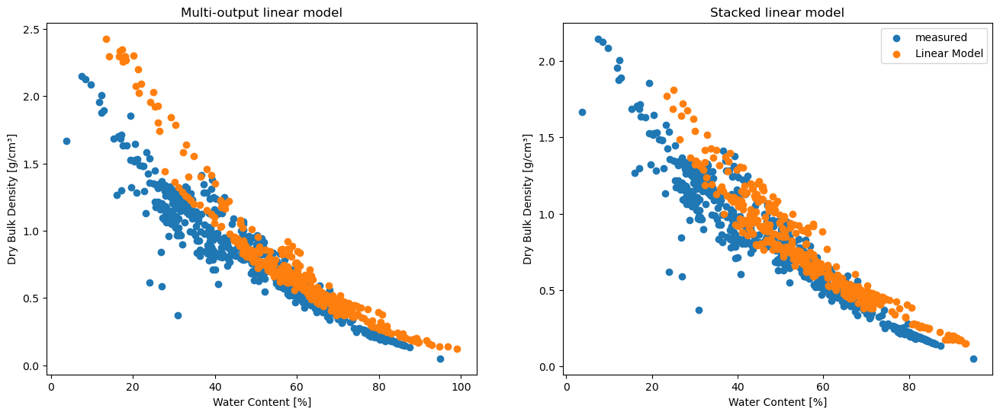

In [58]:
fig = plt.figure(figsize=(16,6))
ax1 = fig.add_subplot(121)
ax1.scatter(df_DBD_minus_predict.WaterContent, df_DBD_minus_predict.DryBulkDensity, label = 'measured')
ax1.scatter(dbd_multi.WaterContentPredicted, dbd_multi.DryBulkDensity, label = 'Linear Model')
ax1.set_ylabel('Dry Bulk Density [g/cm³]')
ax1.set_xlabel('Water Content [%]')
ax1.set_title('Multi-output linear model')
ax2 = fig.add_subplot(122)
ax2.scatter(df_DBD_minus_predict.WaterContent, df_DBD_minus_predict.DryBulkDensity, label = 'measured')
ax2.scatter(prediction_result_data.WaterContent, prediction_result_data.DryBulkDensity, label = 'Linear Model')
ax2.set_ylabel('Dry Bulk Density [g/cm³]')
ax2.set_xlabel('Water Content [%]')
ax2.set_title('Stacked linear model')
plt.legend()
#plt.savefig(f'Test_Measured_vs_Random_Forest.jpg', dpi = 600, bbox_inches = 'tight')
plt.show()

In [59]:
WBD_cores = ['PG1214', 'PG1228', 'PG1238']
DBD_cores = ['EN18208', 'EN18218', 'PG1205', 'PG2201']
predicted_cores = ['Co1309', 'Co1412', 'PG1755','PG1756','PG1984', 'PG2133', 'PG2208']

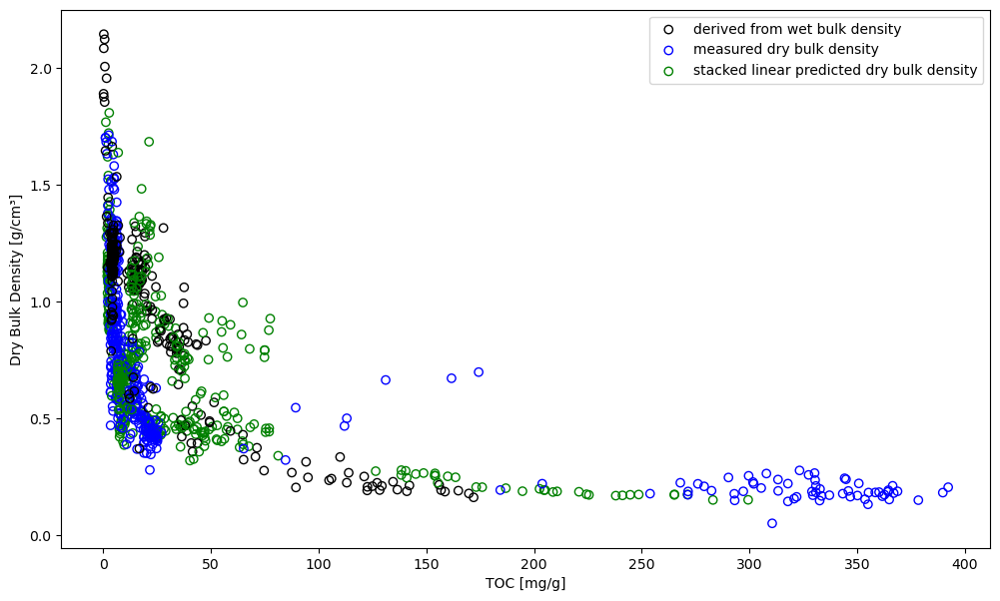

In [60]:
fig = plt.figure(figsize=(12,7))
ax1 = fig.add_subplot(111)

for coreid in df_DBD_stacked.CoreID.unique():
    if coreid in WBD_cores:
        l1 = ax1.scatter(x = 'TOC_mg_g', y = 'DryBulkDensity', data = df_DBD_stacked[df_DBD_stacked.CoreID.str.contains(coreid)], facecolor = 'none', edgecolor = 'black')
    elif coreid in DBD_cores:
        l2 = ax1.scatter(x = 'TOC_mg_g', y = 'DryBulkDensity', data = df_DBD_stacked[df_DBD_stacked.CoreID.str.contains(coreid)], facecolor = 'none', edgecolor = 'blue')
    elif coreid in predicted_cores:
        pass
        l3 = ax1.scatter(x = 'TOC_mg_g', y = 'DryBulkDensity', data = df_DBD_stacked[df_DBD_stacked.CoreID.str.contains(coreid)], facecolor = 'none', edgecolor = 'green')
    else:
        pass
    
ax1.set_ylabel('Dry Bulk Density [g/cm³]')
ax1.set_xlabel('TOC [mg/g]')
ax1.legend((l1
            ,l2
            ,l3
           ), 
           ('derived from wet bulk density'
            ,'measured dry bulk density'
            ,'stacked linear predicted dry bulk density'
           ), loc='upper right')
#ax1.set_xscale('log')
date = f"{datetime.datetime.now():%Y-%m-%d_%H-%M-%S}"
#plt.savefig(f'predicted_DBD_{date}.jpg', dpi = 600, bbox_inches = 'tight')
plt.show()

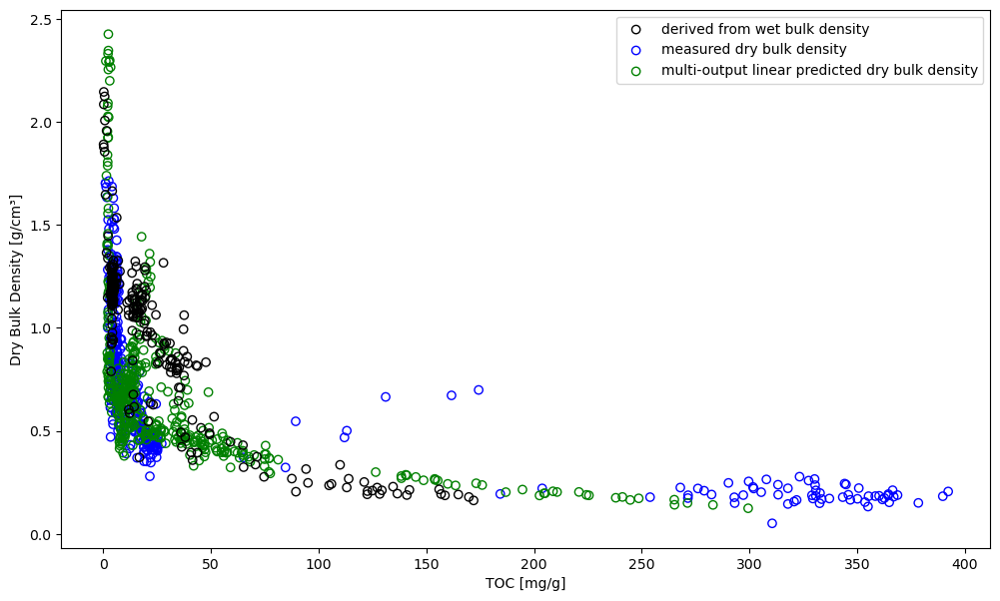

In [61]:
fig = plt.figure(figsize=(12,7))
ax1 = fig.add_subplot(111)

for coreid in df_DBD_multi.CoreID.unique():
    if coreid in WBD_cores:
        l1 = ax1.scatter(x = 'TOC_mg_g', y = 'DryBulkDensity', data = df_DBD_multi[df_DBD_multi.CoreID.str.contains(coreid)], facecolor = 'none', edgecolor = 'black')
    elif coreid in DBD_cores:
        l2 = ax1.scatter(x = 'TOC_mg_g', y = 'DryBulkDensity', data = df_DBD_multi[df_DBD_multi.CoreID.str.contains(coreid)], facecolor = 'none', edgecolor = 'blue')
    elif coreid in predicted_cores:
        pass
        l3 = ax1.scatter(x = 'TOC_mg_g', y = 'DryBulkDensity', data = df_DBD_multi[df_DBD_multi.CoreID.str.contains(coreid)], facecolor = 'none', edgecolor = 'green')
    else:
        pass
    
ax1.set_ylabel('Dry Bulk Density [g/cm³]')
ax1.set_xlabel('TOC [mg/g]')
ax1.legend((l1
            ,l2
            ,l3
           ), 
           ('derived from wet bulk density'
            ,'measured dry bulk density'
            ,'multi-output linear predicted dry bulk density'
           ), loc='upper right')
#ax1.set_xscale('log')
date = f"{datetime.datetime.now():%Y-%m-%d_%H-%M-%S}"
#plt.savefig(f'predicted_DBD_{date}.jpg', dpi = 600, bbox_inches = 'tight')
plt.show()

## Calculate OCAR for existing and predicted data

In [62]:
combine_age_df = pd.read_csv(f'combine_age_df.csv')

In [63]:
combine_SR_df = pd.read_csv(f'combine_SR_df.csv')

In [64]:
### Added two dummy OCARs, because data was below detection limit (0.1 %) and would otherwise suggest that there is in increase in OCAR, which is not true based on data
added_dummy = pd.DataFrame(np.array([['EN18208', 191.5, 0, 0.730016667, 49.8230098633338],
                                     ['EN18208', 451.5, 0, 1.047316667, 32.60293660]]),
                           columns = df_DBD_multi.columns)
df_DBD_multi = pd.concat([df_DBD_multi, added_dummy]).sort_values(by = ['CoreID', 'CompositeDepth'], ignore_index = True)
df_DBD_multi = df_DBD_multi.astype(dtype = {'CoreID' : str,
                                'CompositeDepth' : float,
                                'TOC_mg_g': float,
                                'DryBulkDensity': float,
                                'WaterContent' : float})

In [65]:
df_DBD_multi['measurementid'] = df_DBD_multi['CoreID'] + " " + df_DBD_multi['CompositeDepth'].astype(str)

In [66]:
df_DBD_multi = df_DBD_multi.rename(columns = {'CompositeDepth' : 'compositedepth',
                                'CoreID' : 'coreid'})

In [67]:
df_DBD_multi['compositedepth'] = df_DBD_multi['compositedepth'].astype(float)

In [68]:
age_model = pd.merge(combine_age_df, combine_SR_df, on = ['measurementid', 'coreid', 'compositedepth'])

In [69]:
interpol_age_model = pd.DataFrame(columns = ['coreid', 'compositedepth', 'Weighted_mean_SR', 'Min_SR', 'Max_SR', 'Weighted_mean_age'])

In [70]:
for coreid in age_model.coreid.unique():
    result_df = pd.DataFrame()
    core_df = age_model[age_model.coreid.str.contains(coreid)][['compositedepth', 'Weighted_mean_SR', 'Min_SR', 'Max_SR', 'Weighted_mean_age']].dropna()
    core_df.set_index('compositedepth', inplace = True)
    x = core_df.index.values
    x_new = np.arange(core_df.index.values.min(), core_df.index.values.max(), 0.25)
    for column in core_df.columns:
        y = np.array(core_df[column]).reshape(-1, 1)
        f = interpolate.BPoly.from_derivatives(x, y)
        result_df[column] = f(x_new)
    result_df['coreid'] = coreid
    result_df['compositedepth'] = x_new.astype(float)
    interpol_age_model = pd.concat([interpol_age_model, result_df])

In [71]:
DBD_Age_df = pd.merge(df_DBD_multi, interpol_age_model, on = ['coreid', 'compositedepth'])

In [72]:
DBD_Age_df['Mean_OCAR'] = ((DBD_Age_df['DryBulkDensity'] * (DBD_Age_df['TOC_mg_g']/1000))*DBD_Age_df['Weighted_mean_SR'])/0.0001 # g/m2/a
DBD_Age_df['Min_OCAR'] = ((DBD_Age_df['DryBulkDensity'] * (DBD_Age_df['TOC_mg_g']/1000))*DBD_Age_df['Min_SR'])/0.0001 # g/m2/a
DBD_Age_df['Max_OCAR'] = ((DBD_Age_df['DryBulkDensity'] * (DBD_Age_df['TOC_mg_g']/1000))*DBD_Age_df['Max_SR'])/0.0001 # g/m2/a

In [73]:
DBD_Age_df = DBD_Age_df.sort_values(by = ['coreid','compositedepth'])

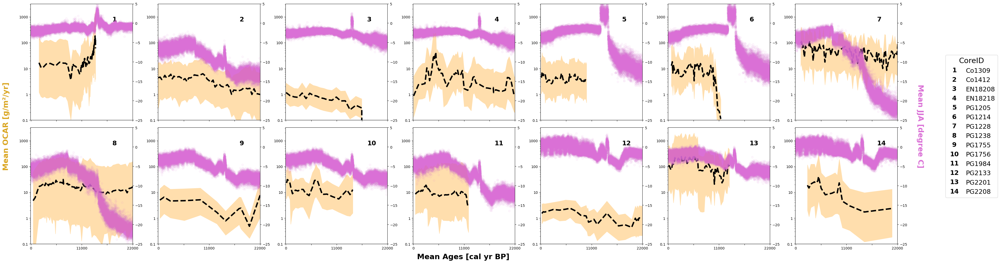

In [74]:
g = sns.relplot(data=DBD_Age_df,
                x="Weighted_mean_age", y="Mean_OCAR", 
                col="coreid", color = 'black',
                kind="line", linestyle = '--',  
                linewidth=4, zorder=3,
                col_wrap = 7
                )
                
core_legend = {}
core_counter = 1
for coreid, ax in g.axes_dict.items():
    ### Adding trace
    ax2 = ax.twinx()
    coreid_trace = pd.read_csv(f'RE3/output_data/{coreid}_JJA_temp_TraCe_data.csv')
    ax2.scatter(x = 'Summer months (Jule-July-August) of each years [yr BP]', y = 'Average summer mean temperature [degree C]', data = coreid_trace, color = 'orchid', 
                alpha = .05, 
                zorder = -1)
    ###
    ax.fill_between(x = DBD_Age_df[(DBD_Age_df.coreid.str.contains(coreid))].Weighted_mean_age, 
                    y1 = DBD_Age_df[(DBD_Age_df.coreid.str.contains(coreid))].Min_OCAR, 
                    y2 = DBD_Age_df[(DBD_Age_df.coreid.str.contains(coreid))].Max_OCAR, 
                    #alpha = .7,
                    color = 'navajowhite', label = 'Two Sigma Range', zorder = 2)
    #### Create a dictionary that holds the number and coreid, e.g., {1: 'PG1234', 2: 'EN20155'}
    core_legend[core_counter] = coreid
    #### This adds the title as an annotation within the plot
    ax.text(.8, .85, core_counter, transform=ax.transAxes, fontweight="bold", fontsize = 18)
    ax.set_yscale('log')
    ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda y, _: '{:g}'.format(y)))
    ax2.set_ylim(-25, 5)
    core_counter += 1

g.set_titles('')
g.set_axis_labels("","")
#### Set limits
xlim_min = int(1950 - datetime.datetime.now().year)
xlim_max = 22000
ylim_min = 0.1
ylim_max = None
g.set(ylim=(ylim_min, ylim_max))
g.set(xlim=(xlim_min, xlim_max))
g.tight_layout()

value_x_tick = range(0, xlim_max + int(xlim_max/4), int(xlim_max/4))
new_x_tick_labels = ['' if (value != 0) and (value != xlim_max) and (value != int(xlim_max/2)) else value for value in value_x_tick]
for ax in g.axes.flat:
    #value_y_tick = ax.get_yticks()
    #new_y_tick_labels = ['' if (value != ylim_min) and (value != (ylim_min*100)) and (value != (ylim_min*10000)) else value for value in value_y_tick]
    #ax.yaxis.set_major_locator(ticker.FixedLocator(value_y_tick))
    #ax.yaxis.set_major_formatter(ticker.FixedFormatter(new_y_tick_labels))
    ax.set_xticks(ticks=value_x_tick)
    ax.set_xticklabels(labels=new_x_tick_labels)

ids = [*core_legend]
handles_c = [(i, 'black') for i in ids]
labels_c = [core_legend[number] for number in core_legend.keys()]
g.fig.legend(handles=handles_c, labels=labels_c, handler_map={tuple : TextHandler()}, fontsize = fontsize_legend, loc = 'center right', bbox_to_anchor = (1.1, 0.5), title = 'CoreID', title_fontsize = titlesize_legend)
g.fig.text(.5, -0.02, 'Mean Ages [cal yr BP]', transform=g.fig.transFigure, horizontalalignment='center', fontsize = labelsize_axis, fontweight = 'bold')
g.fig.text(-0.01, .5, 'Mean OCAR [g/m²/yr]', transform=g.fig.transFigure, ha='center', va='center', fontsize = labelsize_axis, fontweight = 'bold', rotation = 'vertical', color = 'goldenrod')
g.fig.text(1.01, .5, 'Mean JJA [degree C]', transform=g.fig.transFigure, ha='center', va='center', fontsize = labelsize_axis, fontweight = 'bold', rotation = -90, color = 'orchid')

date = f"{datetime.datetime.now():%Y-%m-%d_%H-%M-%S}"
#plt.savefig(f'OCAR_vs_TRACE_{date}.jpg', dpi = 300, bbox_inches = 'tight')
plt.show()

## Prepare grain size data for prediction

In [75]:
GS_df = pd.concat([
    input_data[['CoreID', 'CompositeDepth', 'Silt_percent', 'Clay_percent']],
    prediction_result_data[['CoreID', 'CompositeDepth', 'Silt_percent', 'Clay_percent']]])

### CLAY

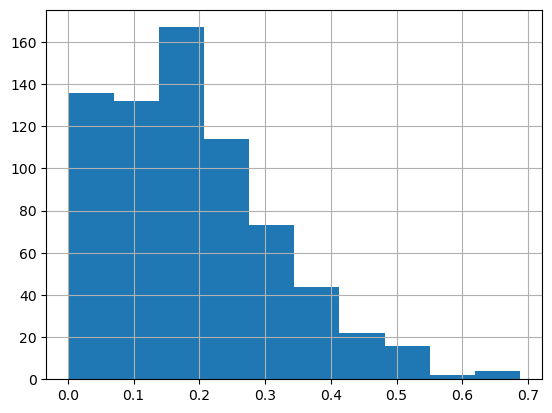

In [76]:
GS_df.Clay_percent.hist()
plt.show()

In [77]:
n, bins = np.histogram(GS_df.Clay_percent)

In [78]:
mids = 0.5*(bins[1:] + bins[:-1])

In [79]:
mean_clay = np.average(mids, weights=n)

In [80]:
var_clay = np.average((mids - mean_clay)**2, weights=n)

In [81]:
sd_clay = np.sqrt(var_clay)

In [82]:
print(mean_clay)
print(var_clay)
print(sd_clay)

0.19192975005631163
0.01619708550571453
0.12726777088373367


In [83]:
a_clay = ((1 - mean_clay) / var_clay - 1 / mean_clay) * mean_clay**2

In [84]:
b_clay = a_clay * (1 / mean_clay - 1)

In [85]:
round(b_clay,4)

6.9295

In [86]:
rand_beta_clay = np.random.beta(a_clay, b_clay, 10000)

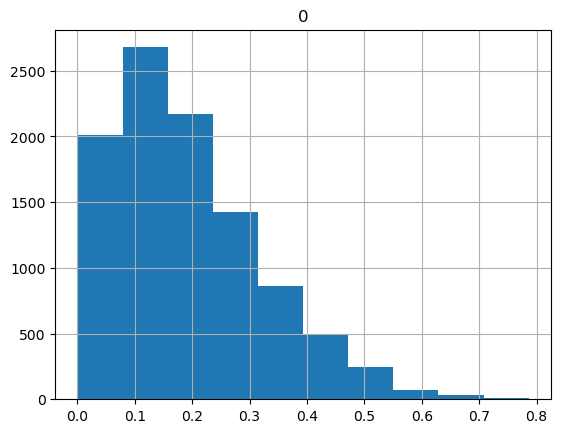

In [87]:
pd.DataFrame(rand_beta_clay).hist()
plt.show()

### SILT

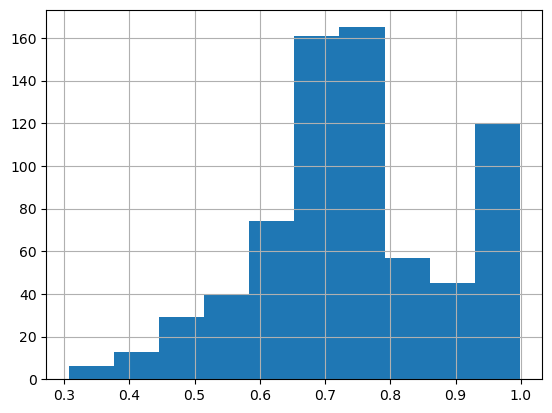

In [88]:
GS_df.Silt_percent.hist()
plt.show()

In [89]:
n, bins = np.histogram(GS_df.Silt_percent)

In [90]:
mids = 0.5*(bins[1:] + bins[:-1])

In [91]:
mean_silt = np.average(mids, weights=n)

In [92]:
var_silt = np.average((mids - mean_silt)**2, weights=n)

In [93]:
sd_silt = np.sqrt(var_silt)

In [94]:
print(mean_silt)
print(var_silt)
print(sd_silt)

0.743047493222137
0.020939240847382468
0.14470397661219428


In [95]:
a_silt = ((1 - mean_silt) / var_silt - 1 / mean_silt) * mean_silt**2

In [96]:
b_silt = a_silt * (1 / mean_silt - 1)

In [97]:
round(b_silt, 4)

2.086

In [98]:
rand_beta_silt = np.random.beta(a_silt, b_silt, 10000)

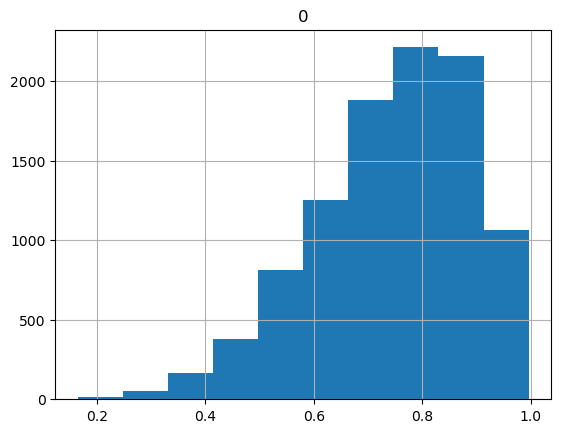

In [99]:
pd.DataFrame(rand_beta_silt).hist()
plt.show()

In [100]:
y_clay, binEdges_clay = np.histogram(rand_beta_clay, bins=10)
clay_density = y_clay / (sum(y_clay) * np.diff(binEdges_clay))
bincenters_clay = [(x/10)-0.05 for x in range(1,11,1)]
x_clay = np.linspace(0, 1, 100)
bspline = interpolate.make_interp_spline(bincenters_clay, clay_density)
y_clay = bspline(x_clay)

In [101]:
y_silt, binEdges_silt = np.histogram(rand_beta_silt, bins=10)
silt_density = y_silt / (sum(y_silt) * np.diff(binEdges_silt))
bincenters_silt = [(x/10)-0.05 for x in range(1,11,1)]
x_silt = np.linspace(0, 1, 100)
bspline = interpolate.make_interp_spline(bincenters_silt, silt_density)
y_silt = bspline(x_silt)

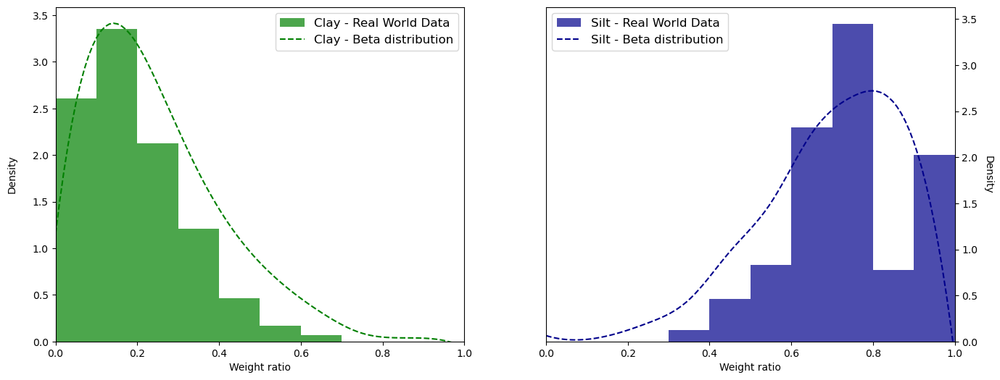

In [102]:
fig = plt.figure(figsize=(16,6))
ax1 = fig.add_subplot(121)
ax1.hist(GS_df.Clay_percent, density = True, bins = 10, color = 'green', range = (0,1), alpha = 0.7, label = 'Clay - Real World Data')
ax1.plot(x_clay, y_clay, color = 'green', linestyle='dashed', label = 'Clay - Beta distribution')
ax1.set_xlim(0,1)
ax1.set_ylim(0,)
ax1.set_xlabel('Weight ratio')
ax1.set_ylabel('Density', labelpad = 15)
ax1.legend(fontsize = 'large')
ax2 = fig.add_subplot(122)
ax2.hist(GS_df.Silt_percent, density = True, bins = 10, color = 'darkblue', range = (0,1), alpha = 0.7, label = 'Silt - Real World Data')
ax2.plot(x_silt, y_silt, color = 'darkblue', linestyle='dashed', label = 'Silt - Beta distribution')
ax2.set_xlim(0,1)
ax2.set_ylim(0,)
ax2.yaxis.set_ticks_position('right')
ax2.yaxis.set_label_position('right')
ax2.set_xlabel('Weight ratio')
ax2.set_ylabel('Density', rotation = 270, labelpad = 15)
ax2.legend(fontsize = 'large')
date = f"{datetime.datetime.now():%Y-%m-%d_%H-%M-%S}"
#plt.savefig(f'clay_silt_beta_dis_{date}.jpg', dpi = 600, bbox_inches = 'tight')
plt.show()

### Import model and prepare for parallelization

In [103]:
#with open('randomforestregressor.pkl', 'rb') as f:
#    rf_final = pickle.load(f)
#
with open('log-linear-model.pkl', 'rb') as f:
    linear_model = pickle.load(f)

with open('linear-model_WC.pkl', 'rb') as f:
    linear_model_WC = pickle.load(f)

C:\Anaconda3\envs\LANDO\lib\site-packages\sklearn\base.py:318: UserWarning: Trying to unpickle estimator LinearRegression from version 0.23.2 when using version 1.2.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


In [104]:
toc_cores = pd.read_csv(f'TOC_Cores.csv')

In [105]:
def randomize_silt_clay(alpha_silt, beta_silt, alpha_clay, beta_clay, ctrl_factor):
    rand_beta_silt = np.random.beta(alpha_silt, beta_silt, 10000)
    rand_beta_clay = np.random.beta(alpha_clay, beta_clay, 10000)
    rand_df = pd.DataFrame(np.array([rand_beta_silt, rand_beta_clay]).T, columns = ['Silt', 'Clay'])
    rand_df['Sum'] = rand_df['Silt'] + rand_df['Clay']
    rand_df[['Over', 'Under']] = False
    for i, r in rand_df.iterrows():
        if rand_df.at[i, 'Sum'] > 1:
            rand_df.at[i, 'Over'] = True
        elif rand_df.at[i, 'Sum'] <= ctrl_factor:
            rand_df.at[i, 'Under'] = True
    df_inbounds = rand_df[(rand_df.Over == False)&(rand_df.Under == False)]
    sc_rand = df_inbounds.drop(columns = ['Sum', 'Over', 'Under'])
    sc_rand.reset_index(drop = True, inplace = True)
    return sc_rand

### Multimodel
#### SKIP IF MODEL EXIST

In [101]:
def predict_depth_toc(model, sc_rand, depth, toc):
    frame = sc_rand.copy()
    frame['CompositeDepth'] = depth
    frame['TOC_mg_g'] = toc
    frame = frame[['CompositeDepth', 'TOC_mg_g','Silt','Clay']]
    prediction_full = np.exp(model.predict(frame))
    prediction_DBD = np.array([i[0] for i in prediction_full])
    min_pred = prediction_DBD.min()
    max_pred = prediction_DBD.max()
    mean_pred = prediction_DBD.mean()
    output = pd.DataFrame(np.array([[depth, toc, min_pred, max_pred, mean_pred]]), columns = ['CompositeDepth', 'TOC_mg_g', 'DBD_min', 'DBD_max', 'DBD_mean'])
    return output

In [94]:
result_dict = {}

In [97]:
for name, model in optimized_model_dict.items():
    fit = model.fit(X_train_temp, y_train_temp)
    pred_result_df = pd.DataFrame()
    with LocalCluster(scheduler_port = 0) as cluster, Client(cluster, timeout="90s") as client:
        with joblib.parallel_backend('dask'):
            pred_result = joblib.Parallel(n_jobs = -1, verbose = 100)(
            joblib.delayed(predict_depth_toc)(model,
                                              randomize_silt_clay(a_silt, b_silt, a_clay, b_clay, 0.8), 
                                              toc_cores.at[i, 'CompositeDepth'], 
                                              toc_cores.at[i, 'TOC_mg_g'])
                for i,r in toc_cores.iterrows()
            )
    for i in range(len(pred_result)):
        partial = pd.DataFrame(pred_result[i])
        pred_result_df = pd.concat([pred_result_df, partial], ignore_index = True)
    result_dict[name] = pred_result_df

[Parallel(n_jobs=-1)]: Using backend DaskDistributedBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   26.7s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   40.6s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:   40.7s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:   41.5s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:   41.5s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:   43.1s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:   43.1s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:   43.1s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   43.4s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:   43.4s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:   43.4s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:   43.4s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:   45.4s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:   53.2s
[Parallel(n_jobs=-1)]: Done  15 tasks      |

[Parallel(n_jobs=-1)]: Done 132 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 133 tasks      | elapsed:  3.3min
[Parallel(n_jobs=-1)]: Done 134 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 135 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 137 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 139 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 140 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 141 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 142 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 143 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 144 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 145 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 147 tasks      | elapsed:  3.7min
[Paralle

[Parallel(n_jobs=-1)]: Done 265 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 266 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 267 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 268 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 269 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 270 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 271 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 272 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 273 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 274 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 275 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 276 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 277 tasks      | elapsed:  6.5min
[Parallel(n_jobs=-1)]: Done 278 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 279 tasks      | elapsed:  6.7min
[Parallel(n_jobs=-1)]: Done 280 tasks      | elapsed:  6.7min
[Paralle

[Parallel(n_jobs=-1)]: Done 398 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 399 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 400 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 401 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 402 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 403 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 404 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 405 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 406 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 407 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 408 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 409 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 410 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 411 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 412 tasks      | elapsed:  9.5min
[Parallel(n_jobs=-1)]: Done 413 tasks      | elapsed:  9.5min
[Paralle

[Parallel(n_jobs=-1)]: Done 531 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 532 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 533 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 534 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 535 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 536 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 537 tasks      | elapsed: 12.4min
[Parallel(n_jobs=-1)]: Done 538 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 539 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 540 tasks      | elapsed: 12.5min
[Parallel(n_jobs=-1)]: Done 541 tasks      | elapsed: 12.6min
[Parallel(n_jobs=-1)]: Done 542 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 543 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 544 tasks      | elapsed: 12.7min
[Parallel(n_jobs=-1)]: Done 545 tasks      | elapsed: 12.8min
[Parallel(n_jobs=-1)]: Done 546 tasks      | elapsed: 12.8min
[Paralle

[Parallel(n_jobs=-1)]: Done 664 tasks      | elapsed: 19.0min
[Parallel(n_jobs=-1)]: Done 665 tasks      | elapsed: 19.0min
[Parallel(n_jobs=-1)]: Done 666 tasks      | elapsed: 19.0min
[Parallel(n_jobs=-1)]: Done 667 tasks      | elapsed: 19.1min
[Parallel(n_jobs=-1)]: Done 668 tasks      | elapsed: 19.1min
[Parallel(n_jobs=-1)]: Done 669 tasks      | elapsed: 19.1min
[Parallel(n_jobs=-1)]: Done 670 tasks      | elapsed: 19.1min
[Parallel(n_jobs=-1)]: Done 671 tasks      | elapsed: 19.1min
[Parallel(n_jobs=-1)]: Done 672 tasks      | elapsed: 19.1min
[Parallel(n_jobs=-1)]: Done 673 tasks      | elapsed: 19.1min
[Parallel(n_jobs=-1)]: Done 674 tasks      | elapsed: 19.2min
[Parallel(n_jobs=-1)]: Done 675 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 676 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 677 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 678 tasks      | elapsed: 19.3min
[Parallel(n_jobs=-1)]: Done 679 tasks      | elapsed: 19.3min
[Paralle

[Parallel(n_jobs=-1)]: Done 797 tasks      | elapsed: 22.4min
[Parallel(n_jobs=-1)]: Done 798 tasks      | elapsed: 22.5min
[Parallel(n_jobs=-1)]: Done 799 tasks      | elapsed: 22.5min
[Parallel(n_jobs=-1)]: Done 800 tasks      | elapsed: 22.5min
[Parallel(n_jobs=-1)]: Done 801 tasks      | elapsed: 22.5min
[Parallel(n_jobs=-1)]: Done 802 tasks      | elapsed: 22.5min
[Parallel(n_jobs=-1)]: Done 803 tasks      | elapsed: 22.5min
[Parallel(n_jobs=-1)]: Done 804 tasks      | elapsed: 22.6min
[Parallel(n_jobs=-1)]: Done 805 tasks      | elapsed: 22.6min
[Parallel(n_jobs=-1)]: Done 806 tasks      | elapsed: 22.7min
[Parallel(n_jobs=-1)]: Done 807 tasks      | elapsed: 22.7min
[Parallel(n_jobs=-1)]: Done 808 tasks      | elapsed: 22.7min
[Parallel(n_jobs=-1)]: Done 809 tasks      | elapsed: 22.7min
[Parallel(n_jobs=-1)]: Done 810 tasks      | elapsed: 22.8min
[Parallel(n_jobs=-1)]: Done 811 tasks      | elapsed: 22.8min
[Parallel(n_jobs=-1)]: Done 812 tasks      | elapsed: 22.8min
[Paralle

[Parallel(n_jobs=-1)]: Done 930 tasks      | elapsed: 26.5min
[Parallel(n_jobs=-1)]: Done 931 tasks      | elapsed: 26.5min
[Parallel(n_jobs=-1)]: Done 932 tasks      | elapsed: 26.5min
[Parallel(n_jobs=-1)]: Done 933 tasks      | elapsed: 26.5min
[Parallel(n_jobs=-1)]: Done 934 tasks      | elapsed: 26.5min
[Parallel(n_jobs=-1)]: Done 935 tasks      | elapsed: 31.5min
[Parallel(n_jobs=-1)]: Done 936 tasks      | elapsed: 31.5min
[Parallel(n_jobs=-1)]: Done 937 tasks      | elapsed: 31.5min
[Parallel(n_jobs=-1)]: Done 938 tasks      | elapsed: 31.7min
[Parallel(n_jobs=-1)]: Done 939 tasks      | elapsed: 31.7min
[Parallel(n_jobs=-1)]: Done 940 tasks      | elapsed: 31.7min
[Parallel(n_jobs=-1)]: Done 941 tasks      | elapsed: 31.7min
[Parallel(n_jobs=-1)]: Done 942 tasks      | elapsed: 31.7min
[Parallel(n_jobs=-1)]: Done 943 tasks      | elapsed: 31.9min
[Parallel(n_jobs=-1)]: Done 944 tasks      | elapsed: 31.9min
[Parallel(n_jobs=-1)]: Done 945 tasks      | elapsed: 31.9min
[Paralle

[Parallel(n_jobs=-1)]: Done 1062 tasks      | elapsed: 35.5min
[Parallel(n_jobs=-1)]: Done 1063 tasks      | elapsed: 35.5min
[Parallel(n_jobs=-1)]: Done 1064 tasks      | elapsed: 35.5min
[Parallel(n_jobs=-1)]: Done 1065 tasks      | elapsed: 35.5min
[Parallel(n_jobs=-1)]: Done 1066 tasks      | elapsed: 35.5min
[Parallel(n_jobs=-1)]: Done 1067 tasks      | elapsed: 35.5min
[Parallel(n_jobs=-1)]: Done 1068 tasks      | elapsed: 35.5min
[Parallel(n_jobs=-1)]: Done 1069 tasks      | elapsed: 35.5min
[Parallel(n_jobs=-1)]: Done 1070 tasks      | elapsed: 35.7min
[Parallel(n_jobs=-1)]: Done 1071 tasks      | elapsed: 35.7min
[Parallel(n_jobs=-1)]: Done 1072 tasks      | elapsed: 35.7min
[Parallel(n_jobs=-1)]: Done 1073 tasks      | elapsed: 35.7min
[Parallel(n_jobs=-1)]: Done 1074 tasks      | elapsed: 35.7min
[Parallel(n_jobs=-1)]: Done 1075 tasks      | elapsed: 35.7min
[Parallel(n_jobs=-1)]: Done 1076 tasks      | elapsed: 35.8min
[Parallel(n_jobs=-1)]: Done 1077 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1193 tasks      | elapsed: 38.6min
[Parallel(n_jobs=-1)]: Done 1194 tasks      | elapsed: 38.6min
[Parallel(n_jobs=-1)]: Done 1195 tasks      | elapsed: 38.6min
[Parallel(n_jobs=-1)]: Done 1196 tasks      | elapsed: 38.6min
[Parallel(n_jobs=-1)]: Done 1197 tasks      | elapsed: 38.7min
[Parallel(n_jobs=-1)]: Done 1198 tasks      | elapsed: 38.7min
[Parallel(n_jobs=-1)]: Done 1199 tasks      | elapsed: 38.7min
[Parallel(n_jobs=-1)]: Done 1200 tasks      | elapsed: 38.7min
[Parallel(n_jobs=-1)]: Done 1201 tasks      | elapsed: 38.7min
[Parallel(n_jobs=-1)]: Done 1202 tasks      | elapsed: 38.8min
[Parallel(n_jobs=-1)]: Done 1203 tasks      | elapsed: 38.9min
[Parallel(n_jobs=-1)]: Done 1204 tasks      | elapsed: 38.9min
[Parallel(n_jobs=-1)]: Done 1205 tasks      | elapsed: 38.9min
[Parallel(n_jobs=-1)]: Done 1206 tasks      | elapsed: 38.9min
[Parallel(n_jobs=-1)]: Done 1207 tasks      | elapsed: 38.9min
[Parallel(n_jobs=-1)]: Done 1208 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1324 tasks      | elapsed: 41.9min
[Parallel(n_jobs=-1)]: Done 1325 tasks      | elapsed: 41.9min
[Parallel(n_jobs=-1)]: Done 1326 tasks      | elapsed: 41.9min
[Parallel(n_jobs=-1)]: Done 1327 tasks      | elapsed: 41.9min
[Parallel(n_jobs=-1)]: Done 1328 tasks      | elapsed: 41.9min
[Parallel(n_jobs=-1)]: Done 1329 tasks      | elapsed: 41.9min
[Parallel(n_jobs=-1)]: Done 1330 tasks      | elapsed: 41.9min
[Parallel(n_jobs=-1)]: Done 1331 tasks      | elapsed: 42.0min
[Parallel(n_jobs=-1)]: Done 1332 tasks      | elapsed: 42.0min
[Parallel(n_jobs=-1)]: Done 1333 tasks      | elapsed: 42.0min
[Parallel(n_jobs=-1)]: Done 1334 tasks      | elapsed: 42.2min
[Parallel(n_jobs=-1)]: Done 1335 tasks      | elapsed: 42.2min
[Parallel(n_jobs=-1)]: Done 1336 tasks      | elapsed: 42.2min
[Parallel(n_jobs=-1)]: Done 1337 tasks      | elapsed: 42.2min
[Parallel(n_jobs=-1)]: Done 1338 tasks      | elapsed: 42.2min
[Parallel(n_jobs=-1)]: Done 1339 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1455 tasks      | elapsed: 52.9min
[Parallel(n_jobs=-1)]: Done 1456 tasks      | elapsed: 52.9min
[Parallel(n_jobs=-1)]: Done 1457 tasks      | elapsed: 52.9min
[Parallel(n_jobs=-1)]: Done 1458 tasks      | elapsed: 52.9min
[Parallel(n_jobs=-1)]: Done 1459 tasks      | elapsed: 52.9min
[Parallel(n_jobs=-1)]: Done 1460 tasks      | elapsed: 52.9min
[Parallel(n_jobs=-1)]: Done 1461 tasks      | elapsed: 52.9min
[Parallel(n_jobs=-1)]: Done 1462 tasks      | elapsed: 53.0min
[Parallel(n_jobs=-1)]: Done 1463 tasks      | elapsed: 53.1min
[Parallel(n_jobs=-1)]: Done 1464 tasks      | elapsed: 53.1min
[Parallel(n_jobs=-1)]: Done 1465 tasks      | elapsed: 53.1min
[Parallel(n_jobs=-1)]: Done 1466 tasks      | elapsed: 53.2min
[Parallel(n_jobs=-1)]: Done 1467 tasks      | elapsed: 53.2min
[Parallel(n_jobs=-1)]: Done 1468 tasks      | elapsed: 53.2min
[Parallel(n_jobs=-1)]: Done 1469 tasks      | elapsed: 53.2min
[Parallel(n_jobs=-1)]: Done 1470 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1586 tasks      | elapsed: 55.9min
[Parallel(n_jobs=-1)]: Done 1587 tasks      | elapsed: 55.9min
[Parallel(n_jobs=-1)]: Done 1588 tasks      | elapsed: 55.9min
[Parallel(n_jobs=-1)]: Done 1589 tasks      | elapsed: 56.0min
[Parallel(n_jobs=-1)]: Done 1590 tasks      | elapsed: 56.0min
[Parallel(n_jobs=-1)]: Done 1591 tasks      | elapsed: 56.0min
[Parallel(n_jobs=-1)]: Done 1592 tasks      | elapsed: 56.0min
[Parallel(n_jobs=-1)]: Done 1593 tasks      | elapsed: 56.0min
[Parallel(n_jobs=-1)]: Done 1594 tasks      | elapsed: 56.0min
[Parallel(n_jobs=-1)]: Done 1595 tasks      | elapsed: 56.0min
[Parallel(n_jobs=-1)]: Done 1596 tasks      | elapsed: 56.0min
[Parallel(n_jobs=-1)]: Done 1597 tasks      | elapsed: 56.1min
[Parallel(n_jobs=-1)]: Done 1598 tasks      | elapsed: 56.3min
[Parallel(n_jobs=-1)]: Done 1599 tasks      | elapsed: 56.3min
[Parallel(n_jobs=-1)]: Done 1600 tasks      | elapsed: 56.3min
[Parallel(n_jobs=-1)]: Done 1601 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1717 tasks      | elapsed: 73.6min
[Parallel(n_jobs=-1)]: Done 1718 tasks      | elapsed: 73.8min
[Parallel(n_jobs=-1)]: Done 1719 tasks      | elapsed: 73.8min
[Parallel(n_jobs=-1)]: Done 1720 tasks      | elapsed: 73.8min
[Parallel(n_jobs=-1)]: Done 1721 tasks      | elapsed: 73.8min
[Parallel(n_jobs=-1)]: Done 1722 tasks      | elapsed: 73.8min
[Parallel(n_jobs=-1)]: Done 1723 tasks      | elapsed: 73.8min
[Parallel(n_jobs=-1)]: Done 1724 tasks      | elapsed: 73.8min
[Parallel(n_jobs=-1)]: Done 1725 tasks      | elapsed: 73.8min
[Parallel(n_jobs=-1)]: Done 1726 tasks      | elapsed: 73.8min
[Parallel(n_jobs=-1)]: Done 1727 tasks      | elapsed: 73.8min
[Parallel(n_jobs=-1)]: Done 1728 tasks      | elapsed: 73.8min
[Parallel(n_jobs=-1)]: Done 1729 tasks      | elapsed: 73.9min
[Parallel(n_jobs=-1)]: Done 1730 tasks      | elapsed: 74.1min
[Parallel(n_jobs=-1)]: Done 1731 tasks      | elapsed: 74.1min
[Parallel(n_jobs=-1)]: Done 1732 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1848 tasks      | elapsed: 76.9min
[Parallel(n_jobs=-1)]: Done 1849 tasks      | elapsed: 76.9min
[Parallel(n_jobs=-1)]: Done 1850 tasks      | elapsed: 77.2min
[Parallel(n_jobs=-1)]: Done 1851 tasks      | elapsed: 77.2min
[Parallel(n_jobs=-1)]: Done 1852 tasks      | elapsed: 77.2min
[Parallel(n_jobs=-1)]: Done 1853 tasks      | elapsed: 77.3min
[Parallel(n_jobs=-1)]: Done 1854 tasks      | elapsed: 77.3min
[Parallel(n_jobs=-1)]: Done 1855 tasks      | elapsed: 77.3min
[Parallel(n_jobs=-1)]: Done 1856 tasks      | elapsed: 77.3min
[Parallel(n_jobs=-1)]: Done 1857 tasks      | elapsed: 77.3min
[Parallel(n_jobs=-1)]: Done 1858 tasks      | elapsed: 77.3min
[Parallel(n_jobs=-1)]: Done 1859 tasks      | elapsed: 77.3min
[Parallel(n_jobs=-1)]: Done 1860 tasks      | elapsed: 77.3min
[Parallel(n_jobs=-1)]: Done 1861 tasks      | elapsed: 77.3min
[Parallel(n_jobs=-1)]: Done 1862 tasks      | elapsed: 77.5min
[Parallel(n_jobs=-1)]: Done 1863 tasks      | elapsed: 

distributed.nanny - WARNING - Worker process still alive after 4 seconds, killing
distributed.nanny - WARNING - Worker process still alive after 4 seconds, killing
distributed.nanny - WARNING - Worker process still alive after 4 seconds, killing
distributed.nanny - WARNING - Worker process still alive after 4 seconds, killing


[Parallel(n_jobs=-1)]: Using backend DaskDistributedBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   20.4s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   28.3s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:   28.4s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:   28.4s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:   28.4s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:   28.4s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:   28.4s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:   28.4s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   28.5s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:   28.5s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:   28.5s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:   28.5s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:   28.5s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:   36.2s
[Parallel(n_jobs=-1)]: Done  15 tasks      |

[Parallel(n_jobs=-1)]: Done 132 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 133 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 134 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 135 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 137 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 139 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 140 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 141 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 142 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 143 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 144 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 145 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 147 tasks      | elapsed:  2.3min
[Paralle

[Parallel(n_jobs=-1)]: Done 265 tasks      | elapsed:  3.7min
[Parallel(n_jobs=-1)]: Done 266 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 267 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 268 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 269 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 270 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 271 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 272 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 273 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 274 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 275 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 276 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 277 tasks      | elapsed:  3.8min
[Parallel(n_jobs=-1)]: Done 278 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 279 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 280 tasks      | elapsed:  4.0min
[Paralle

[Parallel(n_jobs=-1)]: Done 398 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 399 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 400 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 401 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 402 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 403 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 404 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 405 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 406 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 407 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 408 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 409 tasks      | elapsed:  5.5min
[Parallel(n_jobs=-1)]: Done 410 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 411 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 412 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 413 tasks      | elapsed:  5.6min
[Paralle

[Parallel(n_jobs=-1)]: Done 531 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 532 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 533 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 534 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 535 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 536 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 537 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 538 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 539 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 540 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 541 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 542 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 543 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 544 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 545 tasks      | elapsed:  7.3min
[Parallel(n_jobs=-1)]: Done 546 tasks      | elapsed:  7.3min
[Paralle

[Parallel(n_jobs=-1)]: Done 664 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 665 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 666 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 667 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 668 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 669 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 670 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 671 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 672 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 673 tasks      | elapsed:  8.8min
[Parallel(n_jobs=-1)]: Done 674 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 675 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 676 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 677 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 678 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 679 tasks      | elapsed:  8.9min
[Paralle

[Parallel(n_jobs=-1)]: Done 797 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 798 tasks      | elapsed: 10.4min
[Parallel(n_jobs=-1)]: Done 799 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 800 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 801 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 802 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 803 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 804 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 805 tasks      | elapsed: 10.5min
[Parallel(n_jobs=-1)]: Done 806 tasks      | elapsed: 10.6min
[Parallel(n_jobs=-1)]: Done 807 tasks      | elapsed: 10.6min
[Parallel(n_jobs=-1)]: Done 808 tasks      | elapsed: 10.6min
[Parallel(n_jobs=-1)]: Done 809 tasks      | elapsed: 10.6min
[Parallel(n_jobs=-1)]: Done 810 tasks      | elapsed: 10.6min
[Parallel(n_jobs=-1)]: Done 811 tasks      | elapsed: 10.6min
[Parallel(n_jobs=-1)]: Done 812 tasks      | elapsed: 10.6min
[Paralle

[Parallel(n_jobs=-1)]: Done 930 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 931 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 932 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 933 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 934 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 935 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 936 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 937 tasks      | elapsed: 12.1min
[Parallel(n_jobs=-1)]: Done 938 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 939 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 940 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 941 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 942 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 943 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 944 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 945 tasks      | elapsed: 12.3min
[Paralle

[Parallel(n_jobs=-1)]: Done 1062 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done 1063 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done 1064 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done 1065 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done 1066 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done 1067 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done 1068 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done 1069 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done 1070 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 1071 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 1072 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 1073 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 1074 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 1075 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 1076 tasks      | elapsed: 13.9min
[Parallel(n_jobs=-1)]: Done 1077 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1193 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 1194 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 1195 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 1196 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 1197 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 1198 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 1199 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 1200 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 1201 tasks      | elapsed: 15.4min
[Parallel(n_jobs=-1)]: Done 1202 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done 1203 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done 1204 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done 1205 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done 1206 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done 1207 tasks      | elapsed: 15.6min
[Parallel(n_jobs=-1)]: Done 1208 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1324 tasks      | elapsed: 17.1min
[Parallel(n_jobs=-1)]: Done 1325 tasks      | elapsed: 17.1min
[Parallel(n_jobs=-1)]: Done 1326 tasks      | elapsed: 17.1min
[Parallel(n_jobs=-1)]: Done 1327 tasks      | elapsed: 17.1min
[Parallel(n_jobs=-1)]: Done 1328 tasks      | elapsed: 17.1min
[Parallel(n_jobs=-1)]: Done 1329 tasks      | elapsed: 17.1min
[Parallel(n_jobs=-1)]: Done 1330 tasks      | elapsed: 17.1min
[Parallel(n_jobs=-1)]: Done 1331 tasks      | elapsed: 17.1min
[Parallel(n_jobs=-1)]: Done 1332 tasks      | elapsed: 17.1min
[Parallel(n_jobs=-1)]: Done 1333 tasks      | elapsed: 17.1min
[Parallel(n_jobs=-1)]: Done 1334 tasks      | elapsed: 17.2min
[Parallel(n_jobs=-1)]: Done 1335 tasks      | elapsed: 17.2min
[Parallel(n_jobs=-1)]: Done 1336 tasks      | elapsed: 17.2min
[Parallel(n_jobs=-1)]: Done 1337 tasks      | elapsed: 17.2min
[Parallel(n_jobs=-1)]: Done 1338 tasks      | elapsed: 17.2min
[Parallel(n_jobs=-1)]: Done 1339 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1455 tasks      | elapsed: 18.7min
[Parallel(n_jobs=-1)]: Done 1456 tasks      | elapsed: 18.7min
[Parallel(n_jobs=-1)]: Done 1457 tasks      | elapsed: 18.7min
[Parallel(n_jobs=-1)]: Done 1458 tasks      | elapsed: 18.7min
[Parallel(n_jobs=-1)]: Done 1459 tasks      | elapsed: 18.7min
[Parallel(n_jobs=-1)]: Done 1460 tasks      | elapsed: 18.7min
[Parallel(n_jobs=-1)]: Done 1461 tasks      | elapsed: 18.7min
[Parallel(n_jobs=-1)]: Done 1462 tasks      | elapsed: 18.7min
[Parallel(n_jobs=-1)]: Done 1463 tasks      | elapsed: 18.7min
[Parallel(n_jobs=-1)]: Done 1464 tasks      | elapsed: 18.7min
[Parallel(n_jobs=-1)]: Done 1465 tasks      | elapsed: 18.7min
[Parallel(n_jobs=-1)]: Done 1466 tasks      | elapsed: 18.9min
[Parallel(n_jobs=-1)]: Done 1467 tasks      | elapsed: 18.9min
[Parallel(n_jobs=-1)]: Done 1468 tasks      | elapsed: 18.9min
[Parallel(n_jobs=-1)]: Done 1469 tasks      | elapsed: 18.9min
[Parallel(n_jobs=-1)]: Done 1470 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1586 tasks      | elapsed: 20.4min
[Parallel(n_jobs=-1)]: Done 1587 tasks      | elapsed: 20.4min
[Parallel(n_jobs=-1)]: Done 1588 tasks      | elapsed: 20.4min
[Parallel(n_jobs=-1)]: Done 1589 tasks      | elapsed: 20.4min
[Parallel(n_jobs=-1)]: Done 1590 tasks      | elapsed: 20.4min
[Parallel(n_jobs=-1)]: Done 1591 tasks      | elapsed: 20.4min
[Parallel(n_jobs=-1)]: Done 1592 tasks      | elapsed: 20.4min
[Parallel(n_jobs=-1)]: Done 1593 tasks      | elapsed: 20.4min
[Parallel(n_jobs=-1)]: Done 1594 tasks      | elapsed: 20.4min
[Parallel(n_jobs=-1)]: Done 1595 tasks      | elapsed: 20.4min
[Parallel(n_jobs=-1)]: Done 1596 tasks      | elapsed: 20.4min
[Parallel(n_jobs=-1)]: Done 1597 tasks      | elapsed: 20.4min
[Parallel(n_jobs=-1)]: Done 1598 tasks      | elapsed: 20.5min
[Parallel(n_jobs=-1)]: Done 1599 tasks      | elapsed: 20.5min
[Parallel(n_jobs=-1)]: Done 1600 tasks      | elapsed: 20.5min
[Parallel(n_jobs=-1)]: Done 1601 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1717 tasks      | elapsed: 21.9min
[Parallel(n_jobs=-1)]: Done 1718 tasks      | elapsed: 22.0min
[Parallel(n_jobs=-1)]: Done 1719 tasks      | elapsed: 22.0min
[Parallel(n_jobs=-1)]: Done 1720 tasks      | elapsed: 22.0min
[Parallel(n_jobs=-1)]: Done 1721 tasks      | elapsed: 22.0min
[Parallel(n_jobs=-1)]: Done 1722 tasks      | elapsed: 22.0min
[Parallel(n_jobs=-1)]: Done 1723 tasks      | elapsed: 22.0min
[Parallel(n_jobs=-1)]: Done 1724 tasks      | elapsed: 22.0min
[Parallel(n_jobs=-1)]: Done 1725 tasks      | elapsed: 22.0min
[Parallel(n_jobs=-1)]: Done 1726 tasks      | elapsed: 22.0min
[Parallel(n_jobs=-1)]: Done 1727 tasks      | elapsed: 22.0min
[Parallel(n_jobs=-1)]: Done 1728 tasks      | elapsed: 22.0min
[Parallel(n_jobs=-1)]: Done 1729 tasks      | elapsed: 22.0min
[Parallel(n_jobs=-1)]: Done 1730 tasks      | elapsed: 22.2min
[Parallel(n_jobs=-1)]: Done 1731 tasks      | elapsed: 22.2min
[Parallel(n_jobs=-1)]: Done 1732 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1848 tasks      | elapsed: 23.5min
[Parallel(n_jobs=-1)]: Done 1849 tasks      | elapsed: 23.5min
[Parallel(n_jobs=-1)]: Done 1850 tasks      | elapsed: 23.7min
[Parallel(n_jobs=-1)]: Done 1851 tasks      | elapsed: 23.7min
[Parallel(n_jobs=-1)]: Done 1852 tasks      | elapsed: 23.7min
[Parallel(n_jobs=-1)]: Done 1853 tasks      | elapsed: 23.7min
[Parallel(n_jobs=-1)]: Done 1854 tasks      | elapsed: 23.7min
[Parallel(n_jobs=-1)]: Done 1855 tasks      | elapsed: 23.7min
[Parallel(n_jobs=-1)]: Done 1856 tasks      | elapsed: 23.7min
[Parallel(n_jobs=-1)]: Done 1857 tasks      | elapsed: 23.7min
[Parallel(n_jobs=-1)]: Done 1858 tasks      | elapsed: 23.7min
[Parallel(n_jobs=-1)]: Done 1859 tasks      | elapsed: 23.7min
[Parallel(n_jobs=-1)]: Done 1860 tasks      | elapsed: 23.7min
[Parallel(n_jobs=-1)]: Done 1861 tasks      | elapsed: 23.7min
[Parallel(n_jobs=-1)]: Done 1862 tasks      | elapsed: 23.8min
[Parallel(n_jobs=-1)]: Done 1863 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done  84 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done  85 tasks      | elapsed:  2.5min
[Parallel(n_jobs=-1)]: Done  86 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done  87 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done  88 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done  89 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done  90 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done  91 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done  92 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done  93 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done  94 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done  95 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done  96 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done  97 tasks      | elapsed:  2.7min
[Parallel(n_jobs=-1)]: Done  98 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done  99 tasks      | elapsed:  2.9min
[Paralle

[Parallel(n_jobs=-1)]: Done 217 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 218 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 219 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 220 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 221 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 222 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 223 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 224 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 225 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 226 tasks      | elapsed:  5.6min
[Parallel(n_jobs=-1)]: Done 227 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 228 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 229 tasks      | elapsed:  5.7min
[Parallel(n_jobs=-1)]: Done 230 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 231 tasks      | elapsed:  5.8min
[Parallel(n_jobs=-1)]: Done 232 tasks      | elapsed:  5.8min
[Paralle

[Parallel(n_jobs=-1)]: Done 350 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 351 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 352 tasks      | elapsed:  8.6min
[Parallel(n_jobs=-1)]: Done 353 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 354 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 355 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 356 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 358 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 359 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 360 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 361 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done 362 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 363 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 364 tasks      | elapsed:  8.9min
[Parallel(n_jobs=-1)]: Done 365 tasks      | elapsed:  8.9min
[Paralle

[Parallel(n_jobs=-1)]: Done 483 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 484 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 485 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 486 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 487 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 488 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 489 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 490 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 491 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 492 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 493 tasks      | elapsed: 11.7min
[Parallel(n_jobs=-1)]: Done 494 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 495 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 496 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 497 tasks      | elapsed: 11.8min
[Parallel(n_jobs=-1)]: Done 498 tasks      | elapsed: 11.9min
[Paralle

[Parallel(n_jobs=-1)]: Done 616 tasks      | elapsed: 14.8min
[Parallel(n_jobs=-1)]: Done 617 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 618 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 619 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 620 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 621 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 622 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 623 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 624 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 625 tasks      | elapsed: 14.9min
[Parallel(n_jobs=-1)]: Done 626 tasks      | elapsed: 15.1min
[Parallel(n_jobs=-1)]: Done 627 tasks      | elapsed: 15.1min
[Parallel(n_jobs=-1)]: Done 628 tasks      | elapsed: 15.1min
[Parallel(n_jobs=-1)]: Done 629 tasks      | elapsed: 15.1min
[Parallel(n_jobs=-1)]: Done 630 tasks      | elapsed: 15.1min
[Parallel(n_jobs=-1)]: Done 631 tasks      | elapsed: 15.1min
[Paralle

[Parallel(n_jobs=-1)]: Done 749 tasks      | elapsed: 18.1min
[Parallel(n_jobs=-1)]: Done 750 tasks      | elapsed: 18.1min
[Parallel(n_jobs=-1)]: Done 751 tasks      | elapsed: 18.1min
[Parallel(n_jobs=-1)]: Done 752 tasks      | elapsed: 18.1min
[Parallel(n_jobs=-1)]: Done 753 tasks      | elapsed: 18.1min
[Parallel(n_jobs=-1)]: Done 754 tasks      | elapsed: 18.1min
[Parallel(n_jobs=-1)]: Done 755 tasks      | elapsed: 18.1min
[Parallel(n_jobs=-1)]: Done 756 tasks      | elapsed: 18.1min
[Parallel(n_jobs=-1)]: Done 757 tasks      | elapsed: 18.1min
[Parallel(n_jobs=-1)]: Done 758 tasks      | elapsed: 18.3min
[Parallel(n_jobs=-1)]: Done 759 tasks      | elapsed: 18.3min
[Parallel(n_jobs=-1)]: Done 760 tasks      | elapsed: 18.3min
[Parallel(n_jobs=-1)]: Done 761 tasks      | elapsed: 18.3min
[Parallel(n_jobs=-1)]: Done 762 tasks      | elapsed: 18.3min
[Parallel(n_jobs=-1)]: Done 763 tasks      | elapsed: 18.3min
[Parallel(n_jobs=-1)]: Done 764 tasks      | elapsed: 18.4min
[Paralle

[Parallel(n_jobs=-1)]: Done 882 tasks      | elapsed: 25.8min
[Parallel(n_jobs=-1)]: Done 883 tasks      | elapsed: 25.8min
[Parallel(n_jobs=-1)]: Done 884 tasks      | elapsed: 25.8min
[Parallel(n_jobs=-1)]: Done 885 tasks      | elapsed: 25.9min
[Parallel(n_jobs=-1)]: Done 886 tasks      | elapsed: 25.9min
[Parallel(n_jobs=-1)]: Done 887 tasks      | elapsed: 25.9min
[Parallel(n_jobs=-1)]: Done 888 tasks      | elapsed: 25.9min
[Parallel(n_jobs=-1)]: Done 889 tasks      | elapsed: 25.9min
[Parallel(n_jobs=-1)]: Done 890 tasks      | elapsed: 26.0min
[Parallel(n_jobs=-1)]: Done 891 tasks      | elapsed: 26.1min
[Parallel(n_jobs=-1)]: Done 892 tasks      | elapsed: 26.1min
[Parallel(n_jobs=-1)]: Done 893 tasks      | elapsed: 26.1min
[Parallel(n_jobs=-1)]: Done 894 tasks      | elapsed: 26.1min
[Parallel(n_jobs=-1)]: Done 895 tasks      | elapsed: 26.1min
[Parallel(n_jobs=-1)]: Done 896 tasks      | elapsed: 26.1min
[Parallel(n_jobs=-1)]: Done 897 tasks      | elapsed: 26.1min
[Paralle

[Parallel(n_jobs=-1)]: Done 1014 tasks      | elapsed: 28.9min
[Parallel(n_jobs=-1)]: Done 1015 tasks      | elapsed: 29.0min
[Parallel(n_jobs=-1)]: Done 1016 tasks      | elapsed: 29.0min
[Parallel(n_jobs=-1)]: Done 1017 tasks      | elapsed: 29.0min
[Parallel(n_jobs=-1)]: Done 1018 tasks      | elapsed: 29.1min
[Parallel(n_jobs=-1)]: Done 1019 tasks      | elapsed: 29.1min
[Parallel(n_jobs=-1)]: Done 1020 tasks      | elapsed: 29.1min
[Parallel(n_jobs=-1)]: Done 1021 tasks      | elapsed: 29.2min
[Parallel(n_jobs=-1)]: Done 1022 tasks      | elapsed: 29.3min
[Parallel(n_jobs=-1)]: Done 1023 tasks      | elapsed: 29.4min
[Parallel(n_jobs=-1)]: Done 1024 tasks      | elapsed: 29.4min
[Parallel(n_jobs=-1)]: Done 1025 tasks      | elapsed: 29.4min
[Parallel(n_jobs=-1)]: Done 1026 tasks      | elapsed: 29.4min
[Parallel(n_jobs=-1)]: Done 1027 tasks      | elapsed: 29.4min
[Parallel(n_jobs=-1)]: Done 1028 tasks      | elapsed: 29.4min
[Parallel(n_jobs=-1)]: Done 1029 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1145 tasks      | elapsed: 32.4min
[Parallel(n_jobs=-1)]: Done 1146 tasks      | elapsed: 32.4min
[Parallel(n_jobs=-1)]: Done 1147 tasks      | elapsed: 32.4min
[Parallel(n_jobs=-1)]: Done 1148 tasks      | elapsed: 32.5min
[Parallel(n_jobs=-1)]: Done 1149 tasks      | elapsed: 32.5min
[Parallel(n_jobs=-1)]: Done 1150 tasks      | elapsed: 32.5min
[Parallel(n_jobs=-1)]: Done 1151 tasks      | elapsed: 32.5min
[Parallel(n_jobs=-1)]: Done 1152 tasks      | elapsed: 32.6min
[Parallel(n_jobs=-1)]: Done 1153 tasks      | elapsed: 32.6min
[Parallel(n_jobs=-1)]: Done 1154 tasks      | elapsed: 32.7min
[Parallel(n_jobs=-1)]: Done 1155 tasks      | elapsed: 32.9min
[Parallel(n_jobs=-1)]: Done 1156 tasks      | elapsed: 33.0min
[Parallel(n_jobs=-1)]: Done 1157 tasks      | elapsed: 33.0min
[Parallel(n_jobs=-1)]: Done 1158 tasks      | elapsed: 33.0min
[Parallel(n_jobs=-1)]: Done 1159 tasks      | elapsed: 33.0min
[Parallel(n_jobs=-1)]: Done 1160 tasks      | elapsed: 

distributed.scheduler - ERROR - Couldn't gather keys {'batch_of_predict_depth_toc_1_calls-b9a994720b834e96b57878ba14b1752d': ['tcp://127.0.0.1:52321']} state: [None] workers: ['tcp://127.0.0.1:52321']
NoneType: None
distributed.protocol.core - CRITICAL - Failed to Serialize
Traceback (most recent call last):
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\distributed\protocol\core.py", line 76, in dumps
    frames[0] = msgpack.dumps(msg, default=_encode_default, use_bin_type=True)
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\msgpack\__init__.py", line 35, in packb
    return Packer(**kwargs).pack(o)
  File "msgpack/_packer.pyx", line 120, in msgpack._cmsgpack.Packer.__cinit__
MemoryError: Unable to allocate internal buffer.
distributed.comm.utils - ERROR - Unable to allocate internal buffer.
Traceback (most recent call last):
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\distributed\comm\utils.py", line 33, in _to_frames
    return list(protocol.dumps(msg, **kwargs))
  Fi

[Parallel(n_jobs=-1)]: Done 1262 tasks      | elapsed: 35.6min


distributed.batched - ERROR - Error in batched write
Traceback (most recent call last):
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\distributed\batched.py", line 93, in _background_send
    nbytes = yield self.comm.write(
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\tornado\gen.py", line 762, in run
    value = future.result()
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\distributed\comm\tcp.py", line 249, in write
    frames = await to_frames(
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\distributed\comm\utils.py", line 50, in to_frames
    return _to_frames()
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\distributed\comm\utils.py", line 33, in _to_frames
    return list(protocol.dumps(msg, **kwargs))
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\distributed\protocol\core.py", line 76, in dumps
    frames[0] = msgpack.dumps(msg, default=_encode_default, use_bin_type=True)
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\msgpack\__init__.py", line 3

distributed.comm.utils - ERROR - Unable to allocate internal buffer.
Traceback (most recent call last):
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\distributed\comm\utils.py", line 33, in _to_frames
    return list(protocol.dumps(msg, **kwargs))
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\distributed\protocol\core.py", line 76, in dumps
    frames[0] = msgpack.dumps(msg, default=_encode_default, use_bin_type=True)
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\msgpack\__init__.py", line 35, in packb
    return Packer(**kwargs).pack(o)
  File "msgpack/_packer.pyx", line 120, in msgpack._cmsgpack.Packer.__cinit__
MemoryError: Unable to allocate internal buffer.
distributed.protocol.core - CRITICAL - Failed to Serialize
Traceback (most recent call last):
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\distributed\protocol\core.py", line 76, in dumps
    frames[0] = msgpack.dumps(msg, default=_encode_default, use_bin_type=True)
  File "C:\Anaconda3\envs\MAYHEM\lib\site

distributed.batched - ERROR - Error in batched write
Traceback (most recent call last):
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\distributed\batched.py", line 93, in _background_send
    nbytes = yield self.comm.write(
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\tornado\gen.py", line 762, in run
    value = future.result()
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\distributed\comm\tcp.py", line 249, in write
    frames = await to_frames(
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\distributed\comm\utils.py", line 50, in to_frames
    return _to_frames()
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\distributed\comm\utils.py", line 33, in _to_frames
    return list(protocol.dumps(msg, **kwargs))
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\distributed\protocol\core.py", line 76, in dumps
    frames[0] = msgpack.dumps(msg, default=_encode_default, use_bin_type=True)
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\msgpack\__init__.py", line 3

distributed.scheduler - ERROR - Couldn't gather keys {'batch_of_predict_depth_toc_1_calls-408c002b32674de493837d640a2931f3': ['tcp://127.0.0.1:52317']} state: [None] workers: ['tcp://127.0.0.1:52317']
NoneType: None


[Parallel(n_jobs=-1)]: Done 1263 tasks      | elapsed: 35.6min


distributed.core - ERROR - Exception while handling op register-client
Traceback (most recent call last):
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\distributed\core.py", line 520, in handle_comm
    result = await result
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\distributed\scheduler.py", line 5389, in add_client
    await self.handle_stream(comm=comm, extra={"client": client})
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\distributed\core.py", line 568, in handle_stream
    msgs = await comm.read()
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\distributed\comm\tcp.py", line 207, in read
    frames = memoryview(bytearray(frames_nbytes))
MemoryError
tornado.application - ERROR - Exception in callback functools.partial(<function TCPServer._handle_connection.<locals>.<lambda> at 0x0000021A0BCD2F70>, <Task finished name='Task-108895' coro=<BaseTCPListener._handle_stream() done, defined at C:\Anaconda3\envs\MAYHEM\lib\site-packages\distributed\comm\tcp.py:513> ex

[Parallel(n_jobs=-1)]: Done 1264 tasks      | elapsed: 35.6min
[Parallel(n_jobs=-1)]: Done 1265 tasks      | elapsed: 35.6min
[Parallel(n_jobs=-1)]: Done 1266 tasks      | elapsed: 35.6min
[Parallel(n_jobs=-1)]: Done 1267 tasks      | elapsed: 35.6min
[Parallel(n_jobs=-1)]: Done 1268 tasks      | elapsed: 35.6min
[Parallel(n_jobs=-1)]: Done 1269 tasks      | elapsed: 35.6min
[Parallel(n_jobs=-1)]: Done 1270 tasks      | elapsed: 35.6min
[Parallel(n_jobs=-1)]: Done 1271 tasks      | elapsed: 35.6min
[Parallel(n_jobs=-1)]: Done 1272 tasks      | elapsed: 35.6min
[Parallel(n_jobs=-1)]: Done 1273 tasks      | elapsed: 35.6min
[Parallel(n_jobs=-1)]: Done 1274 tasks      | elapsed: 35.8min
[Parallel(n_jobs=-1)]: Done 1275 tasks      | elapsed: 35.8min
[Parallel(n_jobs=-1)]: Done 1276 tasks      | elapsed: 35.8min
[Parallel(n_jobs=-1)]: Done 1277 tasks      | elapsed: 35.8min
[Parallel(n_jobs=-1)]: Done 1278 tasks      | elapsed: 35.8min
[Parallel(n_jobs=-1)]: Done 1279 tasks      | elapsed: 

distributed.scheduler - ERROR - Workers don't have promised key: ['tcp://127.0.0.1:52317'], batch_of_predict_depth_toc_1_calls-408c002b32674de493837d640a2931f3
NoneType: None
distributed.utils - ERROR - 'tcp://127.0.0.1:52314'
Traceback (most recent call last):
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\distributed\utils.py", line 681, in log_errors
    yield
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\distributed\scheduler.py", line 6988, in update_data
    ws: WorkerState = parent._workers_dv[w]
KeyError: 'tcp://127.0.0.1:52314'
distributed.client - WARNING - Couldn't gather 1 keys, rescheduling {'batch_of_predict_depth_toc_1_calls-b9a994720b834e96b57878ba14b1752d': ('tcp://127.0.0.1:52321',)}
distributed.client - WARNING - Couldn't gather 1 keys, rescheduling {'batch_of_predict_depth_toc_1_calls-b9a994720b834e96b57878ba14b1752d': ('tcp://127.0.0.1:52321',)}
distributed.client - WARNING - Couldn't gather 1 keys, rescheduling {'batch_of_predict_depth_toc_1_calls-b9a9947

[Parallel(n_jobs=-1)]: Done 1280 tasks      | elapsed: 35.8min
[Parallel(n_jobs=-1)]: Done 1281 tasks      | elapsed: 35.8min
[Parallel(n_jobs=-1)]: Done 1282 tasks      | elapsed: 35.8min


tornado.application - ERROR - Exception in callback functools.partial(<bound method IOLoop._discard_future_result of <zmq.eventloop.ioloop.ZMQIOLoop object at 0x00000211F5EB09D0>>, <Task finished name='Task-132503' coro=<DaskDistributedBackend.apply_async.<locals>.f() done, defined at C:\Anaconda3\envs\MAYHEM\lib\site-packages\joblib\_dask.py:316> exception=KeyError('tcp://127.0.0.1:52314')>)
Traceback (most recent call last):
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\tornado\ioloop.py", line 741, in _run_callback
    ret = callback()
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\tornado\ioloop.py", line 765, in _discard_future_result
    future.result()
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\joblib\_dask.py", line 317, in f
    batch, tasks = await self._to_func_args(func)
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\joblib\_dask.py", line 304, in _to_func_args
    args = list(await maybe_to_futures(args))
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packa

tornado.application - ERROR - Exception in callback functools.partial(<bound method IOLoop._discard_future_result of <zmq.eventloop.ioloop.ZMQIOLoop object at 0x00000211F5EB09D0>>, <Task finished name='Task-132563' coro=<DaskDistributedBackend.apply_async.<locals>.f() done, defined at C:\Anaconda3\envs\MAYHEM\lib\site-packages\joblib\_dask.py:316> exception=CommClosedError('in <TCP (closed) ConnectionPool.scatter local=tcp://127.0.0.1:52365 remote=tcp://127.0.0.1:52287>: Stream is closed')>)
Traceback (most recent call last):
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\distributed\comm\tcp.py", line 204, in read
    frames_nbytes = await stream.read_bytes(fmt_size)
tornado.iostream.StreamClosedError: Stream is closed

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\tornado\ioloop.py", line 741, in _run_callback
    ret = callback()
  File "C:\Anaconda3\envs\MAYHEM\lib\site

tornado.application - ERROR - Exception in callback functools.partial(<bound method IOLoop._discard_future_result of <zmq.eventloop.ioloop.ZMQIOLoop object at 0x00000211F5EB09D0>>, <Task finished name='Task-132573' coro=<DaskDistributedBackend.apply_async.<locals>.f() done, defined at C:\Anaconda3\envs\MAYHEM\lib\site-packages\joblib\_dask.py:316> exception=CommClosedError('in <TCP (closed) ConnectionPool.scatter local=tcp://127.0.0.1:52345 remote=tcp://127.0.0.1:52287>: Stream is closed')>)
Traceback (most recent call last):
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\distributed\comm\tcp.py", line 204, in read
    frames_nbytes = await stream.read_bytes(fmt_size)
tornado.iostream.StreamClosedError: Stream is closed

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\tornado\ioloop.py", line 741, in _run_callback
    ret = callback()
  File "C:\Anaconda3\envs\MAYHEM\lib\site

tornado.application - ERROR - Exception in callback functools.partial(<bound method IOLoop._discard_future_result of <zmq.eventloop.ioloop.ZMQIOLoop object at 0x00000211F5EB09D0>>, <Task finished name='Task-132569' coro=<DaskDistributedBackend.apply_async.<locals>.f() done, defined at C:\Anaconda3\envs\MAYHEM\lib\site-packages\joblib\_dask.py:316> exception=CommClosedError('in <TCP (closed) ConnectionPool.scatter local=tcp://127.0.0.1:52327 remote=tcp://127.0.0.1:52287>: Stream is closed')>)
Traceback (most recent call last):
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\distributed\comm\tcp.py", line 204, in read
    frames_nbytes = await stream.read_bytes(fmt_size)
tornado.iostream.StreamClosedError: Stream is closed

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\tornado\ioloop.py", line 741, in _run_callback
    ret = callback()
  File "C:\Anaconda3\envs\MAYHEM\lib\site

tornado.application - ERROR - Exception in callback functools.partial(<bound method IOLoop._discard_future_result of <zmq.eventloop.ioloop.ZMQIOLoop object at 0x00000211F5EB09D0>>, <Task finished name='Task-132528' coro=<DaskDistributedBackend.apply_async.<locals>.f() done, defined at C:\Anaconda3\envs\MAYHEM\lib\site-packages\joblib\_dask.py:316> exception=CommClosedError('in <TCP (closed) ConnectionPool.scatter local=tcp://127.0.0.1:52344 remote=tcp://127.0.0.1:52287>: Stream is closed')>)
Traceback (most recent call last):
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\distributed\comm\tcp.py", line 204, in read
    frames_nbytes = await stream.read_bytes(fmt_size)
tornado.iostream.StreamClosedError: Stream is closed

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\tornado\ioloop.py", line 741, in _run_callback
    ret = callback()
  File "C:\Anaconda3\envs\MAYHEM\lib\site

tornado.application - ERROR - Exception in callback functools.partial(<bound method IOLoop._discard_future_result of <zmq.eventloop.ioloop.ZMQIOLoop object at 0x00000211F5EB09D0>>, <Task finished name='Task-132571' coro=<DaskDistributedBackend.apply_async.<locals>.f() done, defined at C:\Anaconda3\envs\MAYHEM\lib\site-packages\joblib\_dask.py:316> exception=CommClosedError('in <TCP (closed) ConnectionPool.scatter local=tcp://127.0.0.1:52336 remote=tcp://127.0.0.1:52287>: Stream is closed')>)
Traceback (most recent call last):
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\distributed\comm\tcp.py", line 204, in read
    frames_nbytes = await stream.read_bytes(fmt_size)
tornado.iostream.StreamClosedError: Stream is closed

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "C:\Anaconda3\envs\MAYHEM\lib\site-packages\tornado\ioloop.py", line 741, in _run_callback
    ret = callback()
  File "C:\Anaconda3\envs\MAYHEM\lib\site

In [105]:
result_dict.keys()

dict_keys(['Linear Regression', 'Random Forest Regression', 'Extreme Gradient Boosting', 'Gradient Boosting', 'K-nearest Neighbor', 'Support Vector Regression', 'AdaBoost Regression'])

In [ ]:
# now you can save it to a file
#with open('result_dict_models.pkl', 'wb') as f:
#    pickle.dump(result_dict, f)

### Linear model
#### SKIP IF MODEL EXIST

In [115]:
def predict_depth_toc(model_DB, model_WC, sc_rand, depth, toc):
    frame = sc_rand.copy()
    frame['CompositeDepth'] = depth
    frame['TOC_mg_g'] = toc
    frame = frame[['CompositeDepth', 'TOC_mg_g','Silt','Clay']]
    prediction_WC = model_WC.predict(frame)
    frame['WaterContent'] = prediction_WC
    prediction_DBD = np.exp(model_DB.predict(frame))
    min_pred = prediction_DBD.min()
    max_pred = prediction_DBD.max()
    mean_pred = prediction_DBD.mean()
    output = pd.DataFrame(np.array([[depth, toc, min_pred, max_pred, mean_pred]]), columns = ['CompositeDepth', 'TOC_mg_g', 'DBD_min', 'DBD_max', 'DBD_mean'])
    return output

In [116]:
pred_result_df = pd.DataFrame()
with LocalCluster(scheduler_port = 0) as cluster, Client(cluster, timeout="90s") as client:
    with joblib.parallel_backend('dask'):
        pred_result = joblib.Parallel(n_jobs = -1, verbose = 100)(
        joblib.delayed(predict_depth_toc)(linear_model,
                                          linear_model_WC,
                                          randomize_silt_clay(a_silt, b_silt, a_clay, b_clay, 0.8), 
                                          toc_cores.at[i, 'CompositeDepth'], 
                                          toc_cores.at[i, 'TOC_mg_g'])
            for i,r in toc_cores.iterrows()
        )
for i in range(len(pred_result)):
    partial = pd.DataFrame(pred_result[i])
    pred_result_df = pd.concat([pred_result_df, partial], ignore_index = True)

[Parallel(n_jobs=-1)]: Using backend DaskDistributedBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:   16.9s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:   24.5s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:   24.6s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:   24.8s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:   24.8s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:   24.8s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:   24.8s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:   24.8s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   24.9s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:   24.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:   24.9s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:   24.9s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:   24.9s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:   32.8s
[Parallel(n_jobs=-1)]: Done  15 tasks      |

[Parallel(n_jobs=-1)]: Done 132 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 133 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 134 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 135 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 136 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 137 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 138 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 139 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 140 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 141 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 142 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 143 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 144 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 145 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 147 tasks      | elapsed:  2.0min
[Paralle

[Parallel(n_jobs=-1)]: Done 265 tasks      | elapsed:  3.2min
[Parallel(n_jobs=-1)]: Done 266 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 267 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 268 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 269 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 270 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 271 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 272 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 273 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 274 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 275 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 276 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 277 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done 278 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 279 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 280 tasks      | elapsed:  3.5min
[Paralle

[Parallel(n_jobs=-1)]: Done 398 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 399 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 400 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 401 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 402 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 403 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 404 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 405 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 406 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 407 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 408 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 409 tasks      | elapsed:  4.8min
[Parallel(n_jobs=-1)]: Done 410 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 411 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 412 tasks      | elapsed:  5.0min
[Parallel(n_jobs=-1)]: Done 413 tasks      | elapsed:  5.0min
[Paralle

[Parallel(n_jobs=-1)]: Done 531 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 532 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 533 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 534 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 535 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 536 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 537 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 538 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 539 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 540 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 541 tasks      | elapsed:  6.3min
[Parallel(n_jobs=-1)]: Done 542 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 543 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 544 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 545 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 546 tasks      | elapsed:  6.4min
[Paralle

[Parallel(n_jobs=-1)]: Done 664 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 665 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 666 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 667 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 668 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 669 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 670 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 671 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 672 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 673 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 674 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 675 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 676 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 677 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 678 tasks      | elapsed:  7.9min
[Parallel(n_jobs=-1)]: Done 679 tasks      | elapsed:  7.9min
[Paralle

[Parallel(n_jobs=-1)]: Done 797 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 798 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 799 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 800 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 801 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 802 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 803 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 804 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 805 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 806 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 807 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 808 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 809 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 810 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 811 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 812 tasks      | elapsed:  9.4min
[Paralle

[Parallel(n_jobs=-1)]: Done 930 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 931 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 932 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 933 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 934 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 935 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 936 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 937 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 938 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 939 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 940 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 941 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 942 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 943 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 944 tasks      | elapsed: 10.9min
[Parallel(n_jobs=-1)]: Done 945 tasks      | elapsed: 10.9min
[Paralle

[Parallel(n_jobs=-1)]: Done 1062 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 1063 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 1064 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 1065 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 1066 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 1067 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 1068 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 1069 tasks      | elapsed: 12.2min
[Parallel(n_jobs=-1)]: Done 1070 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 1071 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 1072 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 1073 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 1074 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 1075 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 1076 tasks      | elapsed: 12.3min
[Parallel(n_jobs=-1)]: Done 1077 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1193 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 1194 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 1195 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 1196 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 1197 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 1198 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 1199 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 1200 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 1201 tasks      | elapsed: 13.7min
[Parallel(n_jobs=-1)]: Done 1202 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done 1203 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done 1204 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done 1205 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done 1206 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done 1207 tasks      | elapsed: 13.8min
[Parallel(n_jobs=-1)]: Done 1208 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1324 tasks      | elapsed: 15.2min
[Parallel(n_jobs=-1)]: Done 1325 tasks      | elapsed: 15.2min
[Parallel(n_jobs=-1)]: Done 1326 tasks      | elapsed: 15.2min
[Parallel(n_jobs=-1)]: Done 1327 tasks      | elapsed: 15.2min
[Parallel(n_jobs=-1)]: Done 1328 tasks      | elapsed: 15.2min
[Parallel(n_jobs=-1)]: Done 1329 tasks      | elapsed: 15.2min
[Parallel(n_jobs=-1)]: Done 1330 tasks      | elapsed: 15.2min
[Parallel(n_jobs=-1)]: Done 1331 tasks      | elapsed: 15.2min
[Parallel(n_jobs=-1)]: Done 1332 tasks      | elapsed: 15.2min
[Parallel(n_jobs=-1)]: Done 1333 tasks      | elapsed: 15.2min
[Parallel(n_jobs=-1)]: Done 1334 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 1335 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 1336 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 1337 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 1338 tasks      | elapsed: 15.3min
[Parallel(n_jobs=-1)]: Done 1339 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1455 tasks      | elapsed: 16.6min
[Parallel(n_jobs=-1)]: Done 1456 tasks      | elapsed: 16.6min
[Parallel(n_jobs=-1)]: Done 1457 tasks      | elapsed: 16.6min
[Parallel(n_jobs=-1)]: Done 1458 tasks      | elapsed: 16.6min
[Parallel(n_jobs=-1)]: Done 1459 tasks      | elapsed: 16.6min
[Parallel(n_jobs=-1)]: Done 1460 tasks      | elapsed: 16.6min
[Parallel(n_jobs=-1)]: Done 1461 tasks      | elapsed: 16.6min
[Parallel(n_jobs=-1)]: Done 1462 tasks      | elapsed: 16.6min
[Parallel(n_jobs=-1)]: Done 1463 tasks      | elapsed: 16.6min
[Parallel(n_jobs=-1)]: Done 1464 tasks      | elapsed: 16.6min
[Parallel(n_jobs=-1)]: Done 1465 tasks      | elapsed: 16.6min
[Parallel(n_jobs=-1)]: Done 1466 tasks      | elapsed: 16.8min
[Parallel(n_jobs=-1)]: Done 1467 tasks      | elapsed: 16.8min
[Parallel(n_jobs=-1)]: Done 1468 tasks      | elapsed: 16.8min
[Parallel(n_jobs=-1)]: Done 1469 tasks      | elapsed: 16.8min
[Parallel(n_jobs=-1)]: Done 1470 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1586 tasks      | elapsed: 18.1min
[Parallel(n_jobs=-1)]: Done 1587 tasks      | elapsed: 18.1min
[Parallel(n_jobs=-1)]: Done 1588 tasks      | elapsed: 18.1min
[Parallel(n_jobs=-1)]: Done 1589 tasks      | elapsed: 18.1min
[Parallel(n_jobs=-1)]: Done 1590 tasks      | elapsed: 18.1min
[Parallel(n_jobs=-1)]: Done 1591 tasks      | elapsed: 18.1min
[Parallel(n_jobs=-1)]: Done 1592 tasks      | elapsed: 18.1min
[Parallel(n_jobs=-1)]: Done 1593 tasks      | elapsed: 18.1min
[Parallel(n_jobs=-1)]: Done 1594 tasks      | elapsed: 18.1min
[Parallel(n_jobs=-1)]: Done 1595 tasks      | elapsed: 18.1min
[Parallel(n_jobs=-1)]: Done 1596 tasks      | elapsed: 18.1min
[Parallel(n_jobs=-1)]: Done 1597 tasks      | elapsed: 18.1min
[Parallel(n_jobs=-1)]: Done 1598 tasks      | elapsed: 18.2min
[Parallel(n_jobs=-1)]: Done 1599 tasks      | elapsed: 18.2min
[Parallel(n_jobs=-1)]: Done 1600 tasks      | elapsed: 18.2min
[Parallel(n_jobs=-1)]: Done 1601 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1717 tasks      | elapsed: 19.4min
[Parallel(n_jobs=-1)]: Done 1718 tasks      | elapsed: 19.6min
[Parallel(n_jobs=-1)]: Done 1719 tasks      | elapsed: 19.6min
[Parallel(n_jobs=-1)]: Done 1720 tasks      | elapsed: 19.6min
[Parallel(n_jobs=-1)]: Done 1721 tasks      | elapsed: 19.6min
[Parallel(n_jobs=-1)]: Done 1722 tasks      | elapsed: 19.6min
[Parallel(n_jobs=-1)]: Done 1723 tasks      | elapsed: 19.6min
[Parallel(n_jobs=-1)]: Done 1724 tasks      | elapsed: 19.6min
[Parallel(n_jobs=-1)]: Done 1725 tasks      | elapsed: 19.6min
[Parallel(n_jobs=-1)]: Done 1726 tasks      | elapsed: 19.6min
[Parallel(n_jobs=-1)]: Done 1727 tasks      | elapsed: 19.6min
[Parallel(n_jobs=-1)]: Done 1728 tasks      | elapsed: 19.6min
[Parallel(n_jobs=-1)]: Done 1729 tasks      | elapsed: 19.6min
[Parallel(n_jobs=-1)]: Done 1730 tasks      | elapsed: 19.7min
[Parallel(n_jobs=-1)]: Done 1731 tasks      | elapsed: 19.7min
[Parallel(n_jobs=-1)]: Done 1732 tasks      | elapsed: 

[Parallel(n_jobs=-1)]: Done 1848 tasks      | elapsed: 20.9min
[Parallel(n_jobs=-1)]: Done 1849 tasks      | elapsed: 20.9min
[Parallel(n_jobs=-1)]: Done 1850 tasks      | elapsed: 21.1min
[Parallel(n_jobs=-1)]: Done 1851 tasks      | elapsed: 21.1min
[Parallel(n_jobs=-1)]: Done 1852 tasks      | elapsed: 21.1min
[Parallel(n_jobs=-1)]: Done 1853 tasks      | elapsed: 21.1min
[Parallel(n_jobs=-1)]: Done 1854 tasks      | elapsed: 21.1min
[Parallel(n_jobs=-1)]: Done 1855 tasks      | elapsed: 21.1min
[Parallel(n_jobs=-1)]: Done 1856 tasks      | elapsed: 21.1min
[Parallel(n_jobs=-1)]: Done 1857 tasks      | elapsed: 21.1min
[Parallel(n_jobs=-1)]: Done 1858 tasks      | elapsed: 21.1min
[Parallel(n_jobs=-1)]: Done 1859 tasks      | elapsed: 21.1min
[Parallel(n_jobs=-1)]: Done 1860 tasks      | elapsed: 21.1min
[Parallel(n_jobs=-1)]: Done 1861 tasks      | elapsed: 21.1min
[Parallel(n_jobs=-1)]: Done 1862 tasks      | elapsed: 21.2min
[Parallel(n_jobs=-1)]: Done 1863 tasks      | elapsed: 

In [117]:
pred_result_df

,CompositeDepth,TOC_mg_g,DBD_min,DBD_max,DBD_mean
0,12.0,51.300000,0.341827,0.484033,0.393321
1,14.0,52.700000,0.341635,0.473878,0.392101
2,19.0,30.000000,0.376294,0.541334,0.432635
3,22.0,50.500000,0.347586,0.487525,0.399514
4,24.0,44.300000,0.357177,0.500807,0.410168
...,...,...,...,...,...
1910,309.5,3.210000,0.589136,0.839105,0.675685
1911,318.5,11.680000,0.573319,0.789029,0.660525
1912,324.5,6.880789,0.591178,0.832031,0.678874
1913,333.5,1.261600,0.609220,0.853933,0.701250


In [118]:
# now you can save it to a file
#with open('pred_result_df.pkl', 'wb') as f:
#    pickle.dump(pred_result_df, f)

In [ ]:
#pred_result_df['CoreID'] = toc_cores['CoreID']
#pred_result_df.to_csv(f'predicted_DBD_TOC.csv', index = False)

## Predict DBD through TOC and composite depth

In [106]:
with open('result_dict_models.pkl', 'rb') as f:
    result_dict = pickle.load(f)

In [107]:
result_dict.keys()

dict_keys(['Linear Regression', 'Random Forest Regression', 'Extreme Gradient Boosting', 'Gradient Boosting', 'K-nearest Neighbor', 'Support Vector Regression', 'AdaBoost Regression'])

<function matplotlib.pyplot.show(close=None, block=None)>

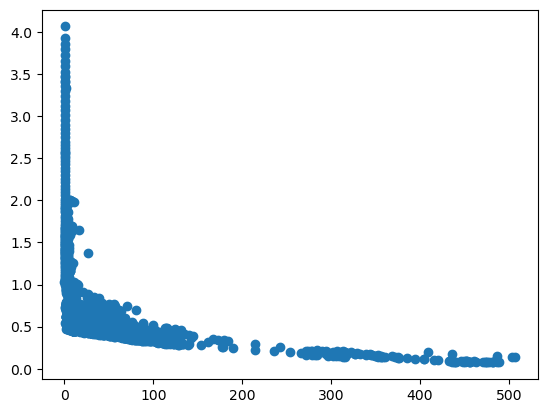

In [108]:
plt.scatter('TOC_mg_g', 'DBD_mean', data = result_dict['Linear Regression'])
plt.show

In [109]:
with open('pred_result_df.pkl', 'rb') as f:
    pred_result_df = pickle.load(f)

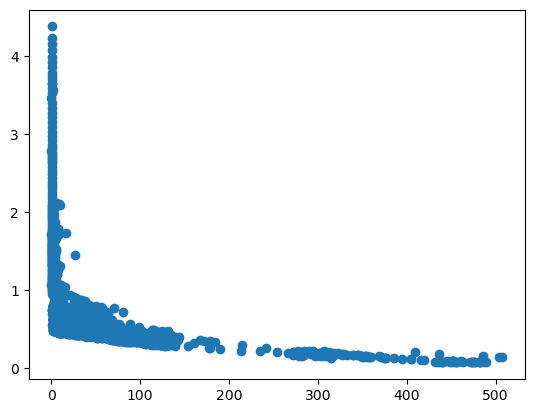

In [110]:
plt.scatter('TOC_mg_g', 'DBD_mean', data = pred_result_df)
#plt.scatter('TOC_mg_g', 'DBD_min', data = pred_result_df)
#plt.scatter('TOC_mg_g', 'DBD_max', data = pred_result_df)
plt.show()

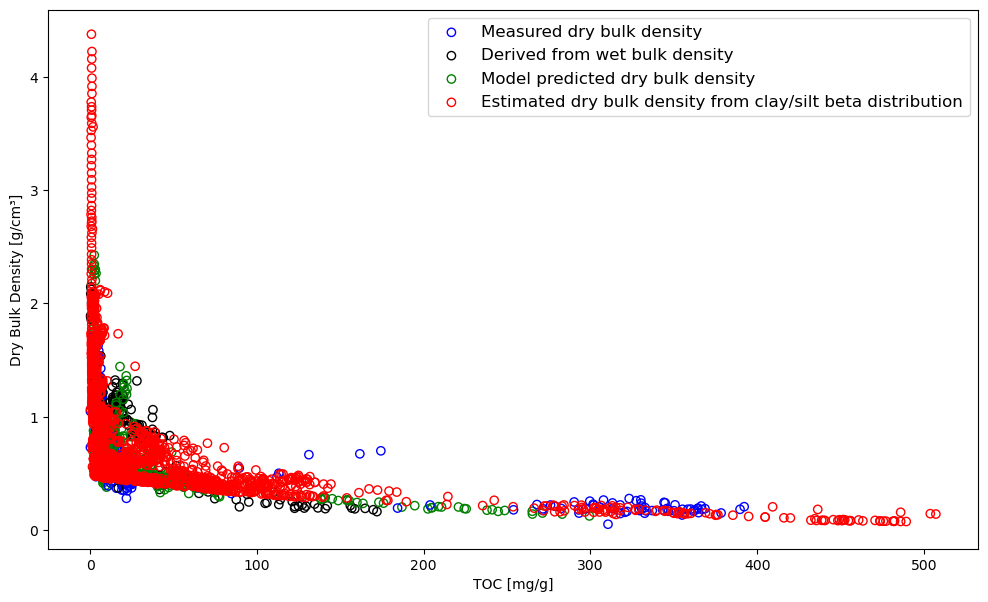

In [111]:
fig = plt.figure(figsize=(12,7))
ax1 = fig.add_subplot(111)

for coreid in df_DBD_multi.coreid.unique():
    if coreid in WBD_cores:
        l1 = ax1.scatter(x = 'TOC_mg_g', y = 'DryBulkDensity', data = df_DBD_multi[df_DBD_multi.coreid.str.contains(coreid)], facecolor = 'none', edgecolor = 'black')
    elif coreid in DBD_cores:
        l2 = ax1.scatter(x = 'TOC_mg_g', y = 'DryBulkDensity', data = df_DBD_multi[df_DBD_multi.coreid.str.contains(coreid)], facecolor = 'none', edgecolor = 'blue')
    elif coreid in predicted_cores:
        l3 = ax1.scatter(x = 'TOC_mg_g', y = 'DryBulkDensity', data = df_DBD_multi[df_DBD_multi.coreid.str.contains(coreid)], facecolor = 'none', edgecolor = 'green')
    else:
        pass

l4 = ax1.scatter('TOC_mg_g', 'DBD_mean', data = pred_result_df, facecolor = 'none', edgecolor = 'red')
#l4 = ax1.scatter('TOC_mg_g', 'DBD_mean', data = result_dict['K-nearest Neighbor'], facecolor = 'none', edgecolor = 'red')
    
ax1.set_ylabel('Dry Bulk Density [g/cm³]')
ax1.set_xlabel('TOC [mg/g]')
ax1.legend((l2
            ,l1
            ,l3
            ,l4
           ), 
           ('Measured dry bulk density'
            ,'Derived from wet bulk density'
            ,'Model predicted dry bulk density'
            ,'Estimated dry bulk density from clay/silt beta distribution'
           ), loc='upper right', fontsize = 'large')
#ax1.set_xscale('log')
#trans = ax1.get_xaxis_transform()
#ax1.axhline(y=2.65, color='purple', linestyle='--')
#plt.text(250, .6, 'Physikalisch-mögliche Trockendichte von 2.65 g/cm³', size = 12, color = 'purple', transform=trans)
date = f"{datetime.datetime.now():%Y-%m-%d_%H-%M-%S}"
#plt.savefig(f'predicted_DBD_{date}.jpg', dpi = 600, bbox_inches = 'tight')
#plt.savefig(f'Explanation2.jpg', dpi = 600, bbox_inches = 'tight')
plt.show()

In [112]:
prediction_dict.keys()

dict_keys(['Linear Regression', 'Random Forest Regression', 'Extreme Gradient Boosting', 'Gradient Boosting', 'K-nearest Neighbor', 'Support Vector Regression', 'AdaBoost Regression'])

In [113]:
prediction_dict['Linear Regression'].CoreID.unique()

array(['Co1309', 'Co1412', 'PG1755', 'PG1756', 'PG1984', 'PG2133',
       'PG2208'], dtype=object)

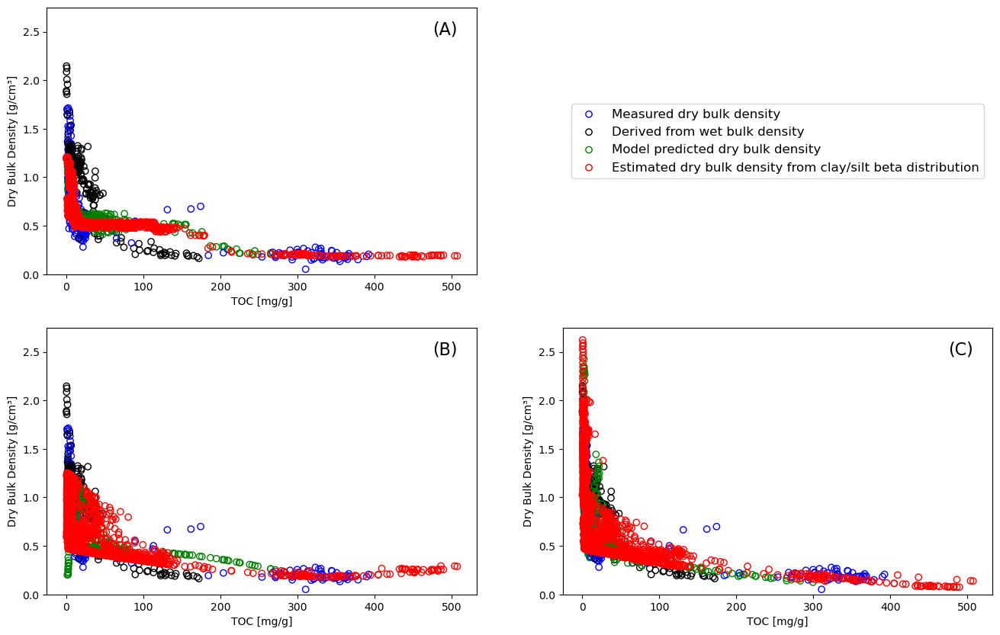

In [114]:
fig = plt.figure(figsize=(16,10))
ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(223)
ax3 = fig.add_subplot(224)
ax4 = fig.add_subplot(222)

axes = [('(A)', 'Random Forest Regression', ax1), ('(B)', 'Support Vector Regression', ax2), ('(C)', 'Linear Regression', ax3), (None, 'Legend', ax4)]

for letter, name, axis in axes:
    if name == 'Legend':
        axis.legend((l2
            ,l1
            ,l3
            ,l4
           ), 
           ('Measured dry bulk density'
            ,'Derived from wet bulk density'
            ,'Model predicted dry bulk density'
            ,'Estimated dry bulk density from clay/silt beta distribution'
           ), loc='center', fontsize = 'large')
        axis.set_axis_off()
    else:
        current_df = prediction_dict[name].copy()
        method_dbd_df = pd.concat([current_df[['CoreID', 'CompositeDepth', 'TOC_mg_g', 'DryBulkDensity', 'WaterContent']], 
                                 df_DBD_minus_predict])
        method_dbd_df = method_dbd_df.sort_values(by = ['CoreID','CompositeDepth'], ignore_index = True)
        for coreid in method_dbd_df.CoreID.unique():
            if coreid in WBD_cores:
                l1 = axis.scatter(x = 'TOC_mg_g', y = 'DryBulkDensity', data = method_dbd_df[method_dbd_df.CoreID.str.contains(coreid)], facecolor = 'none', edgecolor = 'black')
            elif coreid in DBD_cores:
                l2 = axis.scatter(x = 'TOC_mg_g', y = 'DryBulkDensity', data = method_dbd_df[method_dbd_df.CoreID.str.contains(coreid)], facecolor = 'none', edgecolor = 'blue')
            elif coreid in predicted_cores:
                l3 = axis.scatter(x = 'TOC_mg_g', y = 'DryBulkDensity', data = method_dbd_df[method_dbd_df.CoreID.str.contains(coreid)], facecolor = 'none', edgecolor = 'green')
            else:
                pass
        if name == 'Linear Regression':
            l4 = axis.scatter('TOC_mg_g', 'DBD_mean', data = result_dict[name][result_dict[name].DBD_mean < 2.65], facecolor = 'none', edgecolor = 'red')
        else:
            l4 = axis.scatter('TOC_mg_g', 'DBD_mean', data = result_dict[name], facecolor = 'none', edgecolor = 'red')
        
        axis.set_ylim(0,2.75)
        axis.set_ylabel('Dry Bulk Density [g/cm³]')
        axis.set_xlabel('TOC [mg/g]')
        trans = axis.get_xaxis_transform()
        plt.text(475, 0.9, letter, size = 16, color = 'black', transform=trans)
    
date = f"{datetime.datetime.now():%Y-%m-%d_%H-%M-%S}"
#plt.savefig(f'model_predicted_DBD_{date}.jpg', dpi = 600, bbox_inches = 'tight')
plt.show()

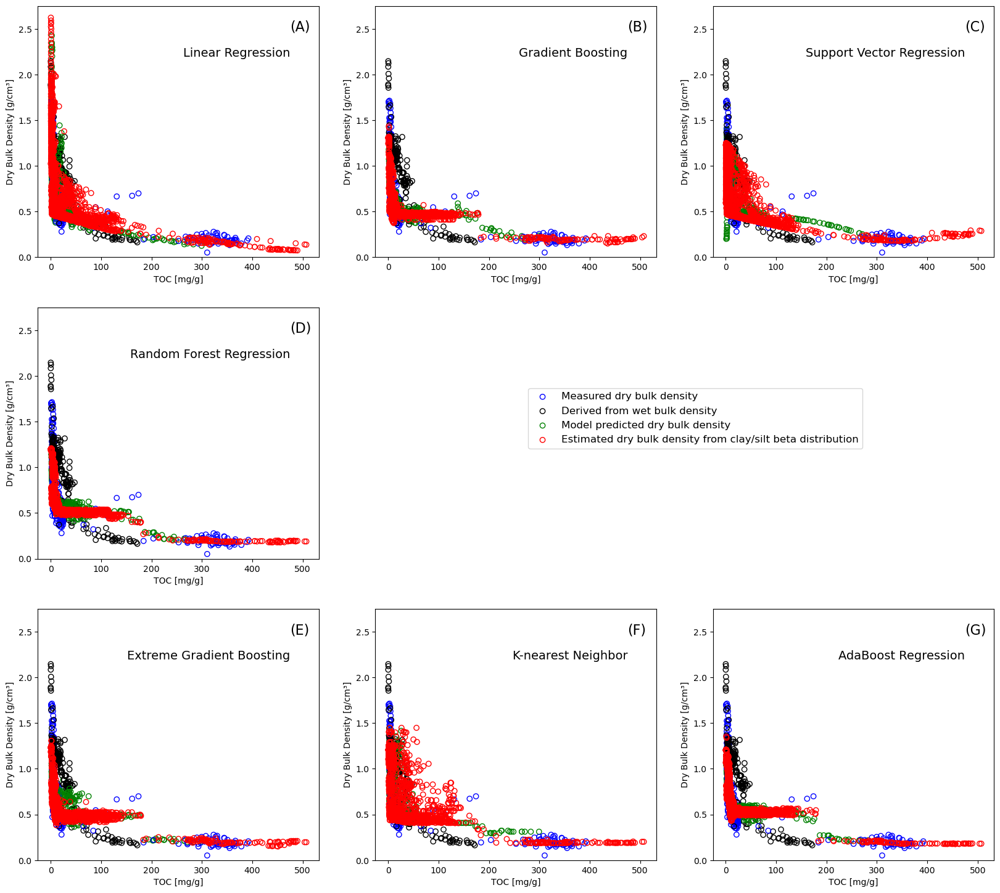

In [115]:
fig, axes = plt.subplots(nrows = 3, ncols = 3, figsize=(20,18))
fig_elements = [('Linear Regression', '(A)'), ('Random Forest Regression', '(D)'), ('Extreme Gradient Boosting', '(E)'), 
                ('Gradient Boosting', '(B)'), (None, None), ('K-nearest Neighbor', '(F)'), 
                ('Support Vector Regression', '(C)'), (None, None), ('AdaBoost Regression', '(G)')]
for i, ax in enumerate(axes.T.flatten()):
    if i == 4:
        ax.legend((l2
            ,l1
            ,l3
            ,l4
           ), 
           ('Measured dry bulk density'
            ,'Derived from wet bulk density'
            ,'Model predicted dry bulk density'
            ,'Estimated dry bulk density from clay/silt beta distribution'
           ), loc='best', bbox_to_anchor=(1.75, 0.7, 0, 0), fontsize = 'large')
        ax.set_axis_off()
    elif i == 7:
        ax.set_axis_off()
    else:
        name = fig_elements[i][0]
        current_df = prediction_dict[name].copy()
        method_dbd_df = pd.concat([current_df[['CoreID', 'CompositeDepth', 'TOC_mg_g', 'DryBulkDensity', 'WaterContent']], 
                                 df_DBD_minus_predict])
        method_dbd_df = method_dbd_df.sort_values(by = ['CoreID','CompositeDepth'], ignore_index = True)
        for coreid in method_dbd_df.CoreID.unique():
            if coreid in WBD_cores:
                l1 = ax.scatter(x = 'TOC_mg_g', y = 'DryBulkDensity', data = method_dbd_df[method_dbd_df.CoreID.str.contains(coreid)], facecolor = 'none', edgecolor = 'black')
            elif coreid in DBD_cores:
                l2 = ax.scatter(x = 'TOC_mg_g', y = 'DryBulkDensity', data = method_dbd_df[method_dbd_df.CoreID.str.contains(coreid)], facecolor = 'none', edgecolor = 'blue')
            elif coreid in predicted_cores:
                l3 = ax.scatter(x = 'TOC_mg_g', y = 'DryBulkDensity', data = method_dbd_df[method_dbd_df.CoreID.str.contains(coreid)], facecolor = 'none', edgecolor = 'green')
            else:
                pass
        if name == 'Linear Regression':
            l4 = ax.scatter('TOC_mg_g', 'DBD_mean', data = result_dict[name][result_dict[name].DBD_mean < 2.65], facecolor = 'none', edgecolor = 'red')
        else:
            l4 = ax.scatter('TOC_mg_g', 'DBD_mean', data = result_dict[name], facecolor = 'none', edgecolor = 'red')
        
        ax.set_ylim(0,2.75)
        ax.set_ylabel('Dry Bulk Density [g/cm³]')
        ax.set_xlabel('TOC [mg/g]')
        trans = ax.get_xaxis_transform()
        plt.text(475, 0.9, fig_elements[i][1], size = 16, color = 'black', transform=trans)
        plt.text(475, 0.8, name, size = 14, color = 'black', transform=trans, ha= 'right')
date = f"{datetime.datetime.now():%Y-%m-%d_%H-%M-%S}"
#plt.savefig(f'all_model_predicted_DBD_{date}.jpg', dpi = 600, bbox_inches = 'tight')
plt.show()

## Plot

In [116]:
#pred_result_df = pd.read_csv(f'predicted_DBD_TOC.csv')

In [117]:
linear_pred_result = pd.concat([result_dict['Linear Regression'], toc_cores['CoreID']], axis = 1)

In [118]:
linear_pred_result['measurementid'] = linear_pred_result['CoreID'] + " " + linear_pred_result['CompositeDepth'].astype(str)

In [119]:
linear_pred_result = linear_pred_result.rename(columns = {'CompositeDepth' : 'compositedepth',
                                'CoreID' : 'coreid'})

In [120]:
linear_pred_result['compositedepth'] = linear_pred_result['compositedepth'].astype(float)

In [121]:
combine_age_df_toc = pd.read_csv(f'combine_age_df_toc.csv')

In [122]:
combine_SR_df_toc = pd.read_csv(f'combine_SR_df_toc.csv')

In [123]:
age_model_toc = pd.merge(combine_age_df_toc, combine_SR_df_toc, on = ['measurementid', 'coreid', 'compositedepth'])

In [124]:
interpol_age_model_toc = pd.DataFrame(columns = ['coreid', 'compositedepth', 'Weighted_mean_SR', 'Min_SR', 'Max_SR', 'Weighted_mean_age'])

In [125]:
for coreid in age_model_toc.coreid.unique():
    result_df = pd.DataFrame()
    core_df = age_model_toc[age_model_toc.coreid.str.contains(coreid)][['compositedepth', 'Weighted_mean_SR', 'Min_SR', 'Max_SR', 'Weighted_mean_age']].dropna()
    core_df.set_index('compositedepth', inplace = True)
    x = core_df.index.values
    x_new = np.arange(core_df.index.values.min(), core_df.index.values.max(), 0.25)
    for column in core_df.columns:
        y = np.array(core_df[column]).reshape(-1, 1)
        f = interpolate.BPoly.from_derivatives(x, y)
        result_df[column] = f(x_new)
    result_df['coreid'] = coreid
    result_df['compositedepth'] = x_new.astype(float)
    interpol_age_model_toc = pd.concat([interpol_age_model_toc, result_df])

In [126]:
pred_age_df = pd.merge(linear_pred_result, interpol_age_model_toc, on = ['coreid', 'compositedepth'])

In [127]:
pred_age_df['Mean_OCAR'] = ((pred_age_df['DBD_mean'] * (pred_age_df['TOC_mg_g']/1000))*pred_age_df['Weighted_mean_SR'])/0.0001 # g/m2/a
pred_age_df['Min_OCAR'] = ((pred_age_df['DBD_min'] * (pred_age_df['TOC_mg_g']/1000))*pred_age_df['Min_SR'])/0.0001 # g/m2/a
pred_age_df['Max_OCAR'] = ((pred_age_df['DBD_max'] * (pred_age_df['TOC_mg_g']/1000))*pred_age_df['Max_SR'])/0.0001 # g/m2/a

In [128]:
pred_age_df = pred_age_df.sort_values(by = ['coreid','compositedepth'])

In [129]:
combined_OCAR = pd.concat([DBD_Age_df, pred_age_df]).dropna(axis = 1).drop(columns = ['measurementid', 'Min_SR', 'Max_SR'])

In [130]:
combined_OCAR = combined_OCAR.sort_values(by = ['coreid','compositedepth'])

In [131]:
### Corrections
combined_OCAR = combined_OCAR[~(combined_OCAR.coreid.str.contains('CON'))].reset_index(drop = True) # removed CON01-603-5 as the data starts at 23000 cal yr BP
combined_OCAR = combined_OCAR[~(combined_OCAR.coreid.str.contains('PG1856'))].reset_index(drop = True) # removed PG1856 as the data starts at 2000 cal yr BP and other core exist for that lake
combined_OCAR = combined_OCAR[~((combined_OCAR.coreid.str.contains('PG1437'))&(combined_OCAR.compositedepth == 683.0))].reset_index(drop = True) #removed data point as it was equal to zero
combined_OCAR = combined_OCAR[~(combined_OCAR.Mean_OCAR == combined_OCAR.Mean_OCAR.max())].reset_index(drop = True) #removed data point as it was unreasonably high

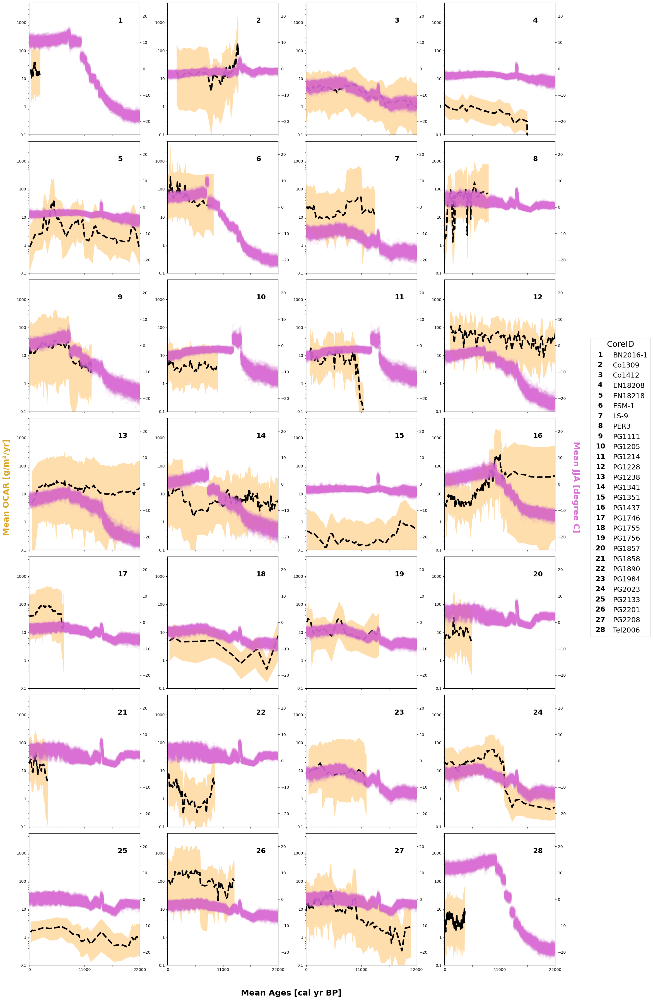

In [472]:
g = sns.relplot(data=combined_OCAR,
                x="Weighted_mean_age", y="Mean_OCAR", 
                col="coreid", color = 'black',
                kind="line", linestyle = '--',  
                linewidth=4, zorder=3,
                col_wrap = 4#7
                )
                
core_legend = {}
core_counter = 1
for coreid, ax in g.axes_dict.items():
    ### Adding trace
    ax2 = ax.twinx()
    coreid_trace = pd.read_csv(f'RE3/output_data/{coreid}_JJA_temp_TraCe_data.csv')
    ax2.scatter(x = 'Summer months (Jule-July-August) of each years [yr BP]', y = 'Average summer mean temperature [degree C]', data = coreid_trace, color = 'orchid', 
                alpha = .05, 
                zorder = -1)
    ###
    ax.fill_between(x = combined_OCAR[(combined_OCAR.coreid.str.contains(coreid))].Weighted_mean_age, 
                    y1 = combined_OCAR[(combined_OCAR.coreid.str.contains(coreid))].Min_OCAR, 
                    y2 = combined_OCAR[(combined_OCAR.coreid.str.contains(coreid))].Max_OCAR, 
                    #alpha = .7,
                    color = 'navajowhite', label = 'Two Sigma Range', zorder = 2)
    #### Create a dictionary that holds the number and coreid, e.g., {1: 'PG1234', 2: 'EN20155'}
    core_legend[core_counter] = coreid
    #### This adds the title as an annotation within the plot
    ax.text(.8, .85, core_counter, transform=ax.transAxes, fontweight="bold", fontsize = 18)
    ax.set_yscale('log')
    ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda y, _: '{:g}'.format(y)))
    ax2.set_ylim(-25, 25)
    core_counter += 1

g.set_titles('')
g.set_axis_labels("","")
#### Set limits
xlim_min = int(1950 - datetime.datetime.now().year)
xlim_max = 22000
ylim_min = 0.1
ylim_max = None
g.set(ylim=(ylim_min, ylim_max))
g.set(xlim=(xlim_min, xlim_max))
g.tight_layout()

value_x_tick = range(0, xlim_max + int(xlim_max/4), int(xlim_max/4))
new_x_tick_labels = ['' if (value != 0) and (value != xlim_max) and (value != int(xlim_max/2)) else value for value in value_x_tick]
for ax in g.axes.flat:
    #value_y_tick = ax.get_yticks()
    #new_y_tick_labels = ['' if (value != ylim_min) and (value != (ylim_min*100)) and (value != (ylim_min*10000)) else value for value in value_y_tick]
    #ax.yaxis.set_major_locator(ticker.FixedLocator(value_y_tick))
    #ax.yaxis.set_major_formatter(ticker.FixedFormatter(new_y_tick_labels))
    ax.set_xticks(ticks=value_x_tick)
    ax.set_xticklabels(labels=new_x_tick_labels)

ids = [*core_legend]
handles_c = [(i, 'black') for i in ids]
labels_c = [core_legend[number] for number in core_legend.keys()]
g.fig.legend(handles=handles_c, labels=labels_c, handler_map={tuple : TextHandler()}, fontsize = fontsize_legend, loc = 'center right', bbox_to_anchor = (1.15, 0.5), title = 'CoreID', title_fontsize = titlesize_legend)
g.fig.text(.5, -0.02, 'Mean Ages [cal yr BP]', transform=g.fig.transFigure, horizontalalignment='center', fontsize = labelsize_axis, fontweight = 'bold')
g.fig.text(-0.01, .5, 'Mean OCAR [g/m²/yr]', transform=g.fig.transFigure, ha='center', va='center', fontsize = labelsize_axis, fontweight = 'bold', rotation = 'vertical', color = 'goldenrod')
g.fig.text(1.01, .5, 'Mean JJA [degree C]', transform=g.fig.transFigure, ha='center', va='center', fontsize = labelsize_axis, fontweight = 'bold', rotation = -90, color = 'orchid')

date = f"{datetime.datetime.now():%Y-%m-%d_%H-%M-%S}"
#plt.savefig(f'All_OCAR_vs_TRACE_{date}.pdf', dpi = 300, bbox_inches = 'tight')
plt.show()

### Plotting data in map

In [133]:
#date = f"{datetime.datetime.now():%Y-%m-%d_%H-%M-%S}"
#combined_OCAR.to_csv(f'combined_OCAR_{date}.csv', index = False)

In [134]:
combined_OCAR = pd.read_csv(f'combined_OCAR_2023-01-17_10-47-56.csv')

In [135]:
within_boundaries = combined_OCAR[combined_OCAR.Weighted_mean_age <= 22000]

In [136]:
mean_frame = pd.DataFrame()
for coreid in within_boundaries.coreid.unique():
    mean_result = pd.DataFrame(np.array([[coreid, float(within_boundaries[within_boundaries.coreid == coreid].Mean_OCAR.mean())]]))
    mean_frame = pd.concat([mean_frame, mean_result])
mean_frame.columns = ['coreid', 'mean_value']

In [139]:
core_metadata = pd.read_csv(f'RE3/coreid_metadata.csv')

In [140]:
overall_mean_OCAR = combined_OCAR.groupby('coreid').mean().reset_index()[['coreid','Mean_OCAR']]

In [141]:
core_metadata = core_metadata.astype(dtype = {'coreid':str,
                                             'latitude': float,
                                             'longitude': float})
overall_mean_OCAR = overall_mean_OCAR.astype(dtype = {'coreid':str})

In [142]:
location_mean_OCAR = pd.merge(overall_mean_OCAR, core_metadata, on = 'coreid', how = 'left')

In [143]:
colormap = plt.cm.get_cmap('plasma')

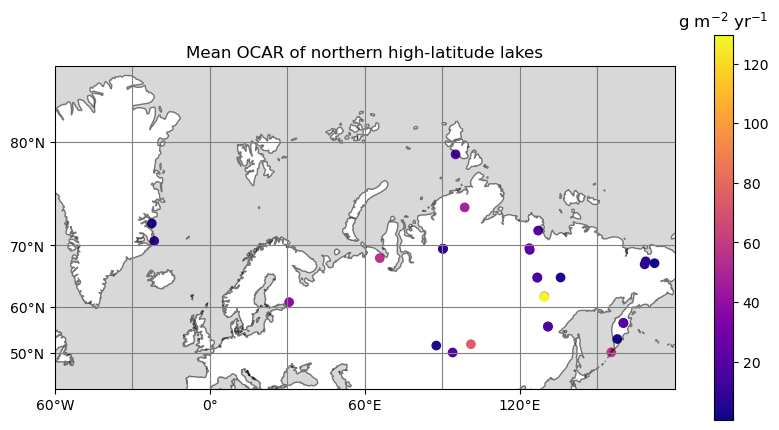

In [144]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(1, 1, 1,
                      projection=ccrs.Mercator())
ax.set_global()
ax.coastlines(alpha = .5)
ax.add_feature(cartopy.feature.OCEAN,facecolor='grey', alpha = .3)
ax.set_xticks([-60, 0, 60, 120, 180], crs=ccrs.PlateCarree())
ax.set_yticks([50, 60, 70, 80], crs=ccrs.PlateCarree())
ax.set_extent([-60, 180, 40, 85], crs=ccrs.PlateCarree())
lon_formatter = LongitudeFormatter(#number_format='.1f',
                                       degree_symbol='°',
                                       dateline_direction_label=True)
lat_formatter = LatitudeFormatter(#number_format='.1f',
                                      degree_symbol='°')
ax.xaxis.set_major_formatter(lon_formatter)
ax.yaxis.set_major_formatter(lat_formatter)
ax.gridlines(draw_labels = False, color = 'grey')
###
sc = ax.scatter(x='longitude',y='latitude',c='Mean_OCAR', data = location_mean_OCAR, cmap = colormap, transform = ccrs.PlateCarree())
cb = plt.colorbar(sc, shrink = 0.5) 
cb.ax.set_title('g m$^{-2}$ yr$^{-1}$')
ax.set_title('Mean OCAR of northern high-latitude lakes')
date = f"{datetime.datetime.now():%Y-%m-%d_%H-%M-%S}"
#plt.savefig(f'Map_mean_OCAR_{date}.pdf', dpi = 300, bbox_inches = 'tight')
plt.show()

In [145]:
# According to the Executive Committee of the International Union of Geological Sciences (IUGS) - Walker et al 2019
# 0 - 4200 Late Holocene
# 4200 - 8200 Mid-Holocene
# 8200 - 11700 Early Holocene
# Kuang et al 2021
# 11700 - 18000 Last Deglaciation
# 11700 - 12700 Younger Dryas
# 12700 - 14300 Bölling Alleröd
# 18000 - 22000 Last Glacial Maximum

In [148]:
boundaries = [-72, 4200, 8200, 11700, 12700, 14300, 18000, 22000]
time_period = {-72: 'Late Holocene',
              4200 : 'Mid-Holocene',
              8200 : 'Early Holocene',
              11700 : 'Younger Dryas',
              12700 : 'Bølling Allerød',
              14300 : 'Last Deglaciation',
              18000 : 'Last Glacial Maximum'}

In [149]:
OCAR_timeslices = {}
for i in range(len(boundaries)):
    if i < (len(boundaries)-1):
        OCAR_timeslices[i, i+1] = combined_OCAR[(combined_OCAR.Weighted_mean_age >= boundaries[i])&(combined_OCAR.Weighted_mean_age <= boundaries [i+1])].groupby('coreid').mean().reset_index()[['coreid','Mean_OCAR']]

In [150]:
for key in OCAR_timeslices.keys():
    OCAR_timeslices[key] = pd.merge(OCAR_timeslices[key], core_metadata, on = 'coreid', how = 'left')

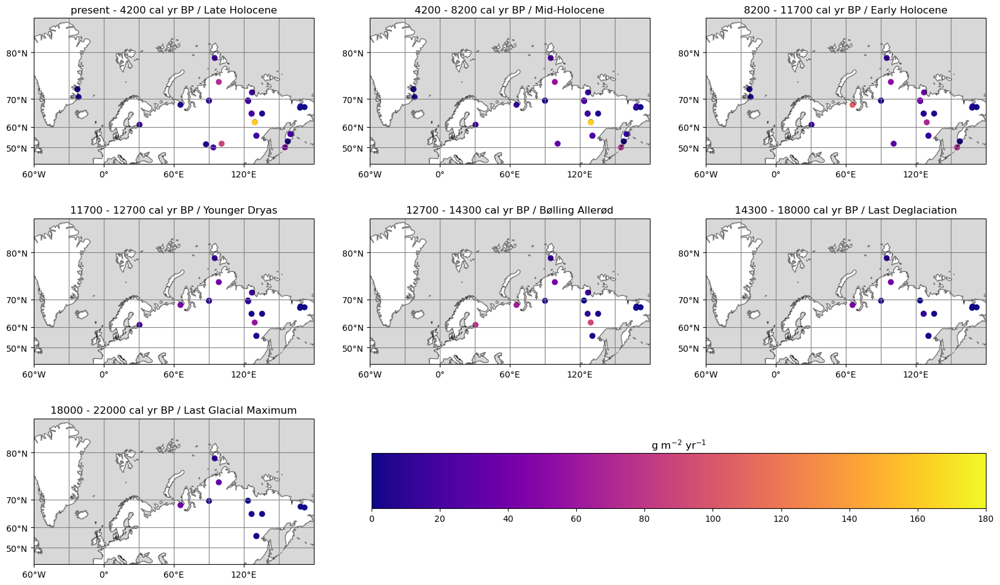

In [151]:
i = 0
fig, axes = plt.subplots(figsize=(20, 12), nrows=3, ncols=3, subplot_kw = {'projection': ccrs.Mercator()})
for ax in axes.flat:
    if i < (len(boundaries)-1):
        ax.set_global()
        ax.coastlines(alpha = .5)
        ax.add_feature(cartopy.feature.OCEAN,facecolor='grey', alpha = .3)
        ax.set_xticks([-60, 0, 60, 120, 180], crs=ccrs.PlateCarree())
        ax.set_yticks([50, 60, 70, 80], crs=ccrs.PlateCarree())
        ax.set_extent([-60, 180, 40, 85], crs=ccrs.PlateCarree())
        lon_formatter = LongitudeFormatter(#number_format='.1f',
                                               degree_symbol='°',
                                               dateline_direction_label=True)
        lat_formatter = LatitudeFormatter(#number_format='.1f',
                                              degree_symbol='°')
        ax.xaxis.set_major_formatter(lon_formatter)
        ax.yaxis.set_major_formatter(lat_formatter)
        ax.gridlines(draw_labels = False, color = 'grey')
        sc = ax.scatter(x='longitude',y='latitude',c='Mean_OCAR', data = OCAR_timeslices[i, i+1], cmap = colormap, transform = ccrs.PlateCarree(), vmin=0, vmax=180)
        if boundaries[i] == -72:
            ax.set_title(f'present - {boundaries[i+1]} cal yr BP / {time_period[boundaries[i]]}')
        else:
            ax.set_title(f'{boundaries[i]} - {boundaries[i+1]} cal yr BP / {time_period[boundaries[i]]}')
        i += 1
    else:
        fig.delaxes(ax)

cbar_ax = fig.add_axes([0.4, 0.2, 0.5, 0.075])
cb = fig.colorbar(sc, ax=axes.ravel().tolist(), cax=cbar_ax, orientation = 'horizontal', shrink = 0.8)
cb.ax.set_title('g m$^{-2}$ yr$^{-1}$')
date = f"{datetime.datetime.now():%Y-%m-%d_%H-%M-%S}"
#plt.savefig(f'Map_mean_OCAR_timeslice_{date}.pdf', dpi = 300, bbox_inches = 'tight')
plt.show()

In [152]:
combined_OCAR = combined_OCAR.astype(dtype = {'Weighted_mean_age' : int})
combined_OCAR = combined_OCAR.rename(columns = {'Weighted_mean_age' : 'age'})

In [153]:
OCAR_potential = []
for coreid in combined_OCAR.coreid.unique():
    coreid_trace = pd.read_csv(f'RE3/output_data/{coreid}_JJA_temp_TraCe_data.csv')
    coreid_trace = coreid_trace.rename(columns = {'Summer months (Jule-July-August) of each years [yr BP]' : 'age',
                                                  'Average summer mean temperature [degree C]' : 'degree_C'})
    coreid_trace['K'] = coreid_trace['degree_C'] + 273.15
    coreid_K = pd.merge(combined_OCAR[combined_OCAR.coreid.str.contains(coreid)], coreid_trace, on = 'age')
    coreid_K['Mean_OCAR_K'] = coreid_K['Mean_OCAR'] / coreid_K['K']
    coreid_K['Min_OCAR_K'] = coreid_K['Min_OCAR'] / coreid_K['K']
    coreid_K['Max_OCAR_K'] = coreid_K['Max_OCAR'] / coreid_K['K']
    OCAR_potential.append(coreid_K)
OCAR_potential = pd.concat(OCAR_potential, axis = 0, ignore_index = True)

In [154]:
markers = {'Glacial lake': 'o',
           'Meteorite lake': '*',
           'Shoreline lake': 'x', 
           'Tectonic lake': 's',
           'Thermokarst lake': 'd'
          }

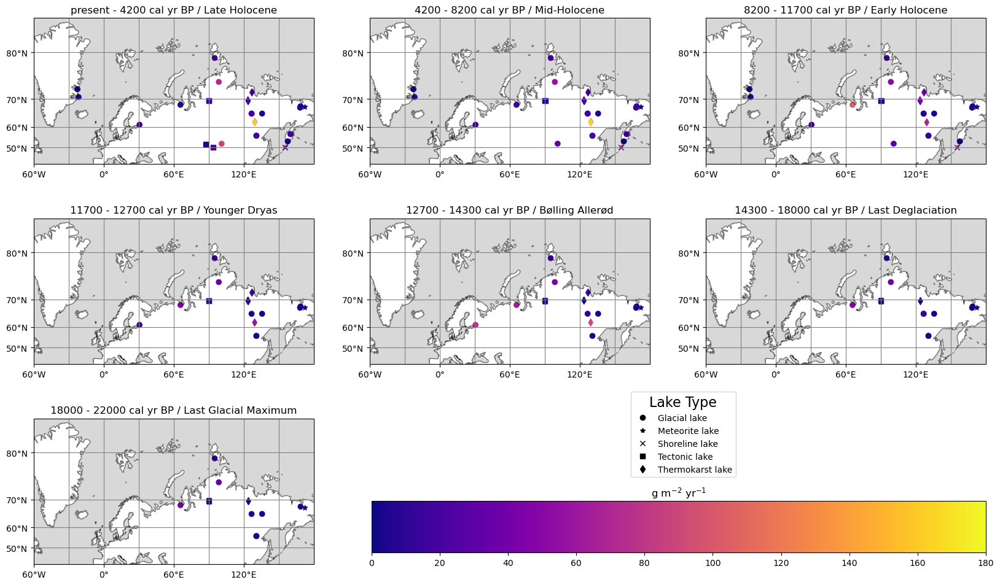

In [155]:
i = 0
fig, axes = plt.subplots(figsize=(20, 12), nrows=3, ncols=3, subplot_kw = {'projection': ccrs.Mercator()})
for ax in axes.flat:
    if i < (len(boundaries)-1):
        ax.set_global()
        ax.coastlines(alpha = .5)
        ax.add_feature(cartopy.feature.OCEAN,facecolor='grey', alpha = .3)
        ax.set_xticks([-60, 0, 60, 120, 180], crs=ccrs.PlateCarree())
        ax.set_yticks([50, 60, 70, 80], crs=ccrs.PlateCarree())
        ax.set_extent([-60, 180, 40, 85], crs=ccrs.PlateCarree())
        lon_formatter = LongitudeFormatter(#number_format='.1f',
                                               degree_symbol='°',
                                               dateline_direction_label=True)
        lat_formatter = LatitudeFormatter(#number_format='.1f',
                                              degree_symbol='°')
        ax.xaxis.set_major_formatter(lon_formatter)
        ax.yaxis.set_major_formatter(lat_formatter)
        ax.gridlines(draw_labels = False, color = 'grey')
        for key in markers.keys():
            df_marker = OCAR_timeslices[i, i+1][OCAR_timeslices[i, i+1].laketype.str.contains(key)]
            if len(df_marker) > 0:
                sc = ax.scatter(x='longitude',y='latitude',c='Mean_OCAR', data = df_marker, marker = markers[key], cmap = colormap, transform = ccrs.PlateCarree(), vmin=0, vmax=180)
        if boundaries[i] == -72:
            ax.set_title(f'present - {boundaries[i+1]} cal yr BP / {time_period[boundaries[i]]}')
        else:
            ax.set_title(f'{boundaries[i]} - {boundaries[i+1]} cal yr BP / {time_period[boundaries[i]]}')
        i += 1
    else:
        fig.delaxes(ax)

cbar_ax = fig.add_axes([0.4, 0.14, 0.5, 0.07])
cb = fig.colorbar(sc, ax=axes.ravel().tolist(), cax=cbar_ax, orientation = 'horizontal', shrink = 0.5)
cb.ax.set_title('g m$^{-2}$ yr$^{-1}$')
handles_m = [(markers[i], 'black') for i in markers.keys()]
labels_m = [i for i in markers.keys()]
plt.legend(handles = handles_m, labels = labels_m, handler_map={tuple : MarkerHandler()}, bbox_to_anchor = (0.6, 3.2), title = 'Lake Type', title_fontsize = 16)
date = f"{datetime.datetime.now():%Y-%m-%d_%H-%M-%S}"
#plt.savefig(f'Map_mean_OCAR_timeslice_{date}.jpg', dpi = 300, bbox_inches = 'tight')
plt.show()

In [156]:
OCAR_summary_timeslice = pd.DataFrame()
for i in range(len(boundaries)):
    if i < (len(boundaries)-1):
        result_list = []
        temp_time_slice = OCAR_potential[(OCAR_potential.age >= boundaries[i])&(OCAR_potential.age <= boundaries [i+1])]
        result_list.append(pd.DataFrame(temp_time_slice.mean(numeric_only = True)[['Mean_OCAR', 'degree_C']]).T)
        result_list.append(pd.DataFrame(temp_time_slice.min()[['Mean_OCAR', 'degree_C']]).T)
        result_list.append(pd.DataFrame(temp_time_slice.max()[['Mean_OCAR', 'degree_C']]).T)
        result_df = pd.concat(result_list, axis = 1, ignore_index = True)
        result_df = result_df.rename(columns = {0:'OCAR', 
                                                1:'Degree_C', 
                                                2:'Min_OCAR', 
                                                3:'Min_Degree_C', 
                                                4:'Max_OCAR', 
                                                5:'Max_Degree_C'})
        result_df['label'] = time_period[boundaries[i]]
        OCAR_summary_timeslice = pd.concat([OCAR_summary_timeslice, result_df], ignore_index = True)
OCAR_summary_timeslice['yerr_min'] = OCAR_summary_timeslice['OCAR'] - OCAR_summary_timeslice['Min_OCAR']
OCAR_summary_timeslice['xerr_min'] = OCAR_summary_timeslice['Degree_C'] - OCAR_summary_timeslice['Min_Degree_C']
OCAR_summary_timeslice['yerr_max'] = OCAR_summary_timeslice['Max_OCAR'] - OCAR_summary_timeslice['OCAR']
OCAR_summary_timeslice['xerr_max'] = OCAR_summary_timeslice['Max_Degree_C'] - OCAR_summary_timeslice['Degree_C']

In [158]:
OCAR_summary_timeslice

,OCAR,Degree_C,Min_OCAR,Min_Degree_C,Max_OCAR,Max_Degree_C,label,yerr_min,xerr_min,yerr_max,xerr_max
0,21.803020,3.368650,0.124806,-12.686743,278.320261,14.761865,Late Holocene,21.678213,16.055393,256.517241,11.393216
1,28.529256,-0.540387,0.162552,-10.279761,275.035791,7.690413,Mid-Holocene,28.366703,9.739374,246.506535,8.2308
2,40.680369,-1.646934,0.1118,-12.018408,243.337857,8.196588,Early Holocene,40.568568,10.371475,202.657489,9.843522
3,17.216421,-5.478174,0.142732,-14.181891,87.993251,0.762984,Younger Dryas,17.073689,8.703717,70.77683,6.241158
4,38.073753,-4.281577,0.16572,-14.509507,180.937983,1.689213,Bølling Allerød,37.908033,10.22793,142.86423,5.97079
5,10.529893,-10.620293,0.0,-20.576819,68.826145,2.124923,Last Deglaciation,10.529893,9.956526,58.296252,12.745216
6,9.471067,-12.746967,0.328318,-24.13674,48.609622,-0.506506,Last Glacial Maximum,9.142749,11.389773,39.138556,12.24046


In [159]:
### Wong color palette for colorblindness
color_time_period = {#'Industrial Era' : '#949494',
                     'Late Holocene' : '#e69f00',
                     'Mid-Holocene' : '#56b3e9',
                     'Early Holocene' : '#009e73',
                     'Younger Dryas' : '#0071b2', 
                     'Bølling Allerød' : '#000000', 
                     'Last Deglaciation': '#d55c00',
                     'Last Glacial Maximum' : '#cc79a7'}

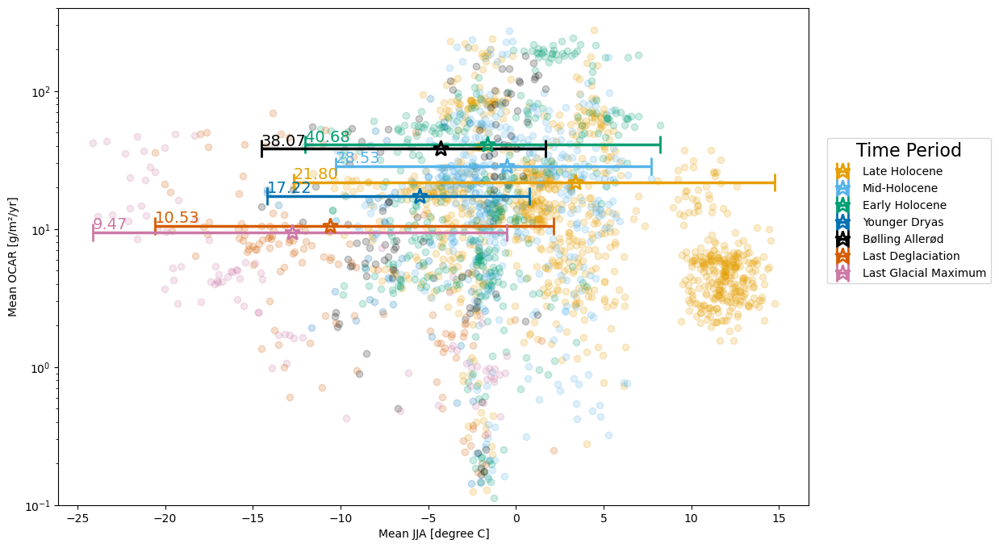

In [ ]:
fig, ax1 = plt.subplots(figsize=(12,8))
for i in range(len(boundaries)):
    if i < (len(boundaries)-1):
        ax1.scatter(x='degree_C', y='Mean_OCAR', 
                    data = OCAR_potential[(OCAR_potential.age >= boundaries[i])&(OCAR_potential.age <= boundaries [i+1])], 
                    color = color_time_period[time_period[boundaries[i]]],
                    label = '',
                   alpha = .2)
ax1.set_ylim(0.1,400)
ax1.set_yscale('log')
ax1.set_ylabel('Mean OCAR [g/m²/yr]')
ax1.set_xlabel('Mean JJA [degree C]')
for i,r in OCAR_summary_timeslice.iterrows():
    ax1.errorbar(x = OCAR_summary_timeslice.at[i,'Degree_C'], y = OCAR_summary_timeslice.at[i,'OCAR'], 
                 xerr = np.asarray(([OCAR_summary_timeslice.at[i, 'xerr_min']], 
                                    [OCAR_summary_timeslice.at[i, 'xerr_max']])), 
                 #yerr = np.asarray(([OCAR_summary_timeslice.at[i, 'yerr_min']], 
                 #                   [OCAR_summary_timeslice.at[i, 'yerr_max']])), 
                 linestyle = 'None', label = OCAR_summary_timeslice.at[i, 'label'], elinewidth = 2.5,
                 color = color_time_period[OCAR_summary_timeslice.at[i, 'label']], 
                marker = '*', markersize = 14, mfc = 'none', mew = 2,
                capsize = 8)
    ax1.annotate((f"{OCAR_summary_timeslice.at[i,'OCAR']:.2f}"), 
                 xy=((OCAR_summary_timeslice.at[i, 'Degree_C'] - OCAR_summary_timeslice.at[i, 'xerr_min']), 
                     OCAR_summary_timeslice.at[i,'OCAR']),
                 color = color_time_period[OCAR_summary_timeslice.at[i, 'label']],
                 fontsize = 14,
                 xytext=(0,3), textcoords='offset points')
plt.legend(bbox_to_anchor = (1.25, 0.75), title = 'Time Period', title_fontsize = 16)
date = f"{datetime.datetime.now():%Y-%m-%d_%H-%M-%S}"
#plt.savefig(f'Temp_vs_OCAR_timeslice_{date}.pdf', dpi = 300, bbox_inches = 'tight')
plt.show()

In [ ]:
boxplot_all_OCAR = OCAR_potential[['age','Mean_OCAR']].copy()

In [162]:
boxplot_all_OCAR['time_period'] = False

In [163]:
for i in range(len(boundaries)):
    if i < (len(boundaries)-1):
        t_slice = boxplot_all_OCAR[(boxplot_all_OCAR.age >= boundaries[i])&(boxplot_all_OCAR.age <= boundaries[i+1])].copy()
        t_slice['time_period'] = time_period[boundaries[i]]
        boxplot_all_OCAR.update(t_slice)
t_slice = boxplot_all_OCAR[boxplot_all_OCAR.age <= 0].copy()
t_slice['time_period'] = time_period[boundaries[0]]
boxplot_all_OCAR.update(t_slice)

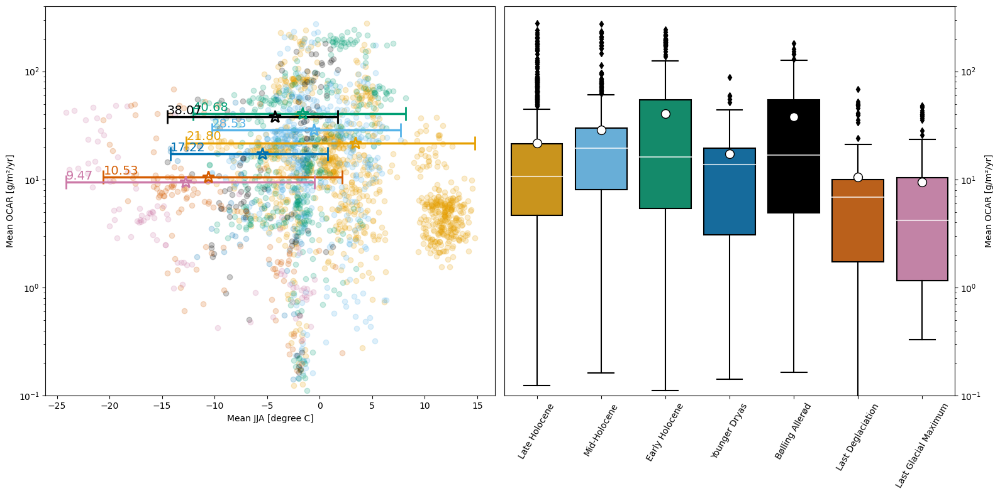

In [164]:
fig = plt.figure(figsize=(16,8))
ax1 = fig.add_subplot(121)
for i in range(len(boundaries)):
    if i < (len(boundaries)-1):
        ax1.scatter(x='degree_C', y='Mean_OCAR', 
                    data = OCAR_potential[(OCAR_potential.age >= boundaries[i])&(OCAR_potential.age <= boundaries [i+1])], 
                    color = color_time_period[time_period[boundaries[i]]],
                    label = '',
                   alpha = .2)
ax1.set_ylim(0.1,400)
ax1.set_yscale('log')
ax1.set_ylabel('Mean OCAR [g/m²/yr]')
ax1.set_xlabel('Mean JJA [degree C]')
for i,r in OCAR_summary_timeslice.iterrows():
    ax1.errorbar(x = OCAR_summary_timeslice.at[i,'Degree_C'], y = OCAR_summary_timeslice.at[i,'OCAR'], 
                 xerr = np.asarray(([OCAR_summary_timeslice.at[i, 'xerr_min']], 
                                    [OCAR_summary_timeslice.at[i, 'xerr_max']])), 
                 linestyle = 'None', label = OCAR_summary_timeslice.at[i, 'label'], elinewidth = 2.5,
                 color = color_time_period[OCAR_summary_timeslice.at[i, 'label']], 
                marker = '*', markersize = 14, mfc = 'none', mew = 2,
                capsize = 8)
    ax1.annotate((f"{OCAR_summary_timeslice.at[i,'OCAR']:.2f}"), 
                 xy=((OCAR_summary_timeslice.at[i, 'Degree_C'] - OCAR_summary_timeslice.at[i, 'xerr_min']), 
                     OCAR_summary_timeslice.at[i,'OCAR']),
                 color = color_time_period[OCAR_summary_timeslice.at[i, 'label']],
                 fontsize = 14,
                 xytext=(0,3), textcoords='offset points')
ax2 = fig.add_subplot(122, sharey = ax1)
sns.boxplot(x="time_period", y="Mean_OCAR", data=boxplot_all_OCAR, palette=color_time_period, 
            order = [*color_time_period.keys()], medianprops=dict(color="white", alpha=0.7), 
            showmeans=True,
            meanprops={"marker":"o",
                       "markerfacecolor":"white", 
                       "markeredgecolor":"black",
                      "markersize":"10"}, ax = ax2)
ax2.set_ylim(0.1,400)
ax2.set_yscale('log')
ax2.set_ylabel('Mean OCAR [g/m²/yr]')
ax2.set_xlabel('')
ax2.yaxis.set_ticks_position('right')
ax2.yaxis.set_label_position('right')
ax2.tick_params(axis='x', labelrotation=60)
plt.tight_layout()
date = f"{datetime.datetime.now():%Y-%m-%d_%H-%M-%S}"
#plt.savefig(f'Temp_vs_OCAR_boxplot_all_{date}.pdf', dpi = 300, bbox_inches = 'tight')
plt.show()

### Without BN2016-1 and Tel2006

In [165]:
OCAR_without_cluster = OCAR_potential[~(OCAR_potential.coreid.str.contains('|'.join(['BN2016-1','Tel2006'])))].reset_index(drop = True)

In [166]:
OCAR_summary_w_o_cluster = pd.DataFrame()
for i in range(len(boundaries)):
    if i < (len(boundaries)-1):
        result_list = []
        temp_time_slice = OCAR_without_cluster[(OCAR_without_cluster.age >= boundaries[i])&(OCAR_without_cluster.age <= boundaries [i+1])]
        result_list.append(pd.DataFrame(temp_time_slice.mean(numeric_only = True)[['Mean_OCAR', 'degree_C']]).T)
        result_list.append(pd.DataFrame(temp_time_slice.min()[['Mean_OCAR', 'degree_C']]).T)
        result_list.append(pd.DataFrame(temp_time_slice.max()[['Mean_OCAR', 'degree_C']]).T)
        result_df = pd.concat(result_list, axis = 1, ignore_index = True)
        result_df = result_df.rename(columns = {0:'OCAR', 
                                                1:'Degree_C', 
                                                2:'Min_OCAR', 
                                                3:'Min_Degree_C', 
                                                4:'Max_OCAR', 
                                                5:'Max_Degree_C'})
        result_df['label'] = time_period[boundaries[i]]
        OCAR_summary_w_o_cluster = pd.concat([OCAR_summary_w_o_cluster, result_df], ignore_index = True)
OCAR_summary_w_o_cluster['yerr_min'] = OCAR_summary_w_o_cluster['OCAR'] - OCAR_summary_w_o_cluster['Min_OCAR']
OCAR_summary_w_o_cluster['xerr_min'] = OCAR_summary_w_o_cluster['Degree_C'] - OCAR_summary_w_o_cluster['Min_Degree_C']
OCAR_summary_w_o_cluster['yerr_max'] = OCAR_summary_w_o_cluster['Max_OCAR'] - OCAR_summary_w_o_cluster['OCAR']
OCAR_summary_w_o_cluster['xerr_max'] = OCAR_summary_w_o_cluster['Max_Degree_C'] - OCAR_summary_w_o_cluster['Degree_C']

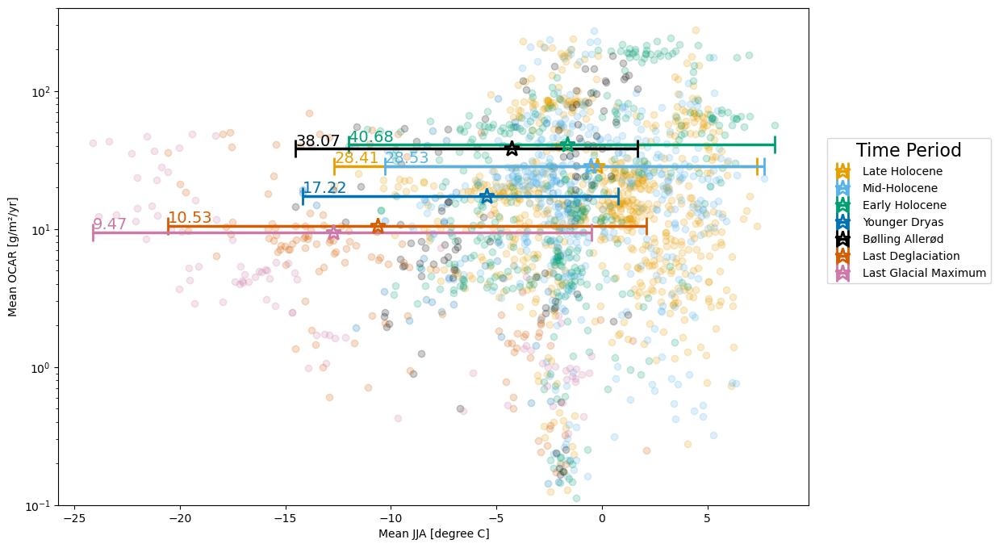

In [167]:
fig, ax1 = plt.subplots(figsize=(12,8))
for i in range(len(boundaries)):
    if i < (len(boundaries)-1):
        ax1.scatter(x='degree_C', y='Mean_OCAR', 
                    data = OCAR_without_cluster[(OCAR_without_cluster.age >= boundaries[i])&(OCAR_without_cluster.age <= boundaries [i+1])], 
                    color = color_time_period[time_period[boundaries[i]]],
                    label = '',
                   alpha = .2)
ax1.set_ylim(0.1,400)
ax1.set_yscale('log')
ax1.set_ylabel('Mean OCAR [g/m²/yr]')
ax1.set_xlabel('Mean JJA [degree C]')
for i,r in OCAR_summary_w_o_cluster.iterrows():
    ax1.errorbar(x = OCAR_summary_w_o_cluster.at[i,'Degree_C'], y = OCAR_summary_w_o_cluster.at[i,'OCAR'], 
                 xerr = np.asarray(([OCAR_summary_w_o_cluster.at[i, 'xerr_min']], 
                                    [OCAR_summary_w_o_cluster.at[i, 'xerr_max']])), 
                 linestyle = 'None', label = OCAR_summary_w_o_cluster.at[i, 'label'], elinewidth = 2.5,
                 color = color_time_period[OCAR_summary_w_o_cluster.at[i, 'label']], 
                marker = '*', markersize = 14, mfc = 'none', mew = 2,
                capsize = 8)
    ax1.annotate((f"{OCAR_summary_w_o_cluster.at[i,'OCAR']:.2f}"), 
                 xy=((OCAR_summary_w_o_cluster.at[i, 'Degree_C'] - OCAR_summary_w_o_cluster.at[i, 'xerr_min']), 
                     OCAR_summary_w_o_cluster.at[i,'OCAR']),
                 color = color_time_period[OCAR_summary_w_o_cluster.at[i, 'label']],
                 fontsize = 14,
                 xytext=(0,3), textcoords='offset points')
plt.legend(bbox_to_anchor = (1.25, 0.75), title = 'Time Period', title_fontsize = 16)
date = f"{datetime.datetime.now():%Y-%m-%d_%H-%M-%S}"
#plt.savefig(f'Temp_vs_OCAR_timeslice_{date}.pdf', dpi = 300, bbox_inches = 'tight')
plt.show()

In [168]:
boxplot_OCAR = OCAR_without_cluster[['age','Mean_OCAR']].copy()

In [169]:
boxplot_OCAR['time_period'] = False

In [170]:
for i in range(len(boundaries)):
    if i < (len(boundaries)-1):
        t_slice = boxplot_OCAR[(boxplot_OCAR.age >= boundaries[i])&(boxplot_OCAR.age <= boundaries[i+1])].copy()
        t_slice['time_period'] = time_period[boundaries[i]]
        boxplot_OCAR.update(t_slice)
t_slice = boxplot_OCAR[boxplot_OCAR.age <= 0].copy()
t_slice['time_period'] = time_period[boundaries[0]]
boxplot_OCAR.update(t_slice)

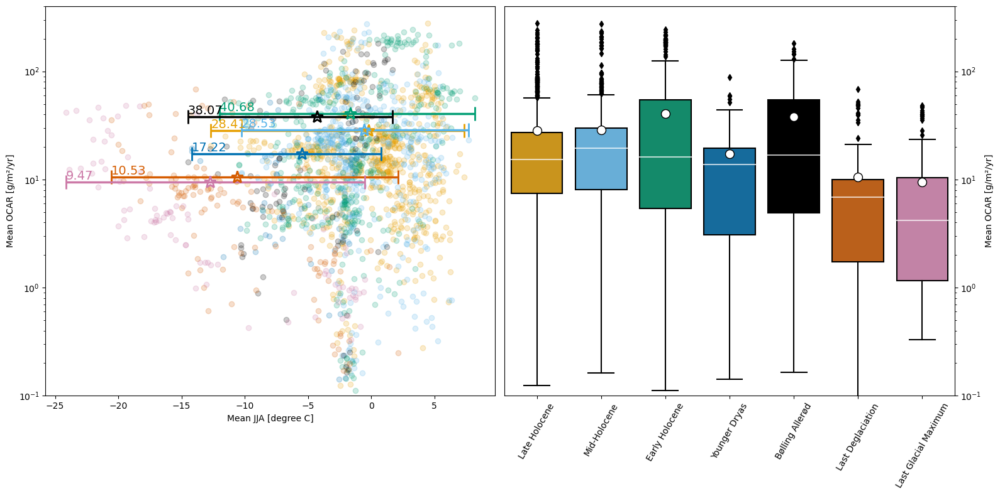

In [171]:
fig = plt.figure(figsize=(16,8))
ax1 = fig.add_subplot(121)
for i in range(len(boundaries)):
    if i < (len(boundaries)-1):
        ax1.scatter(x='degree_C', y='Mean_OCAR', 
                    data = OCAR_without_cluster[(OCAR_without_cluster.age >= boundaries[i])&(OCAR_without_cluster.age <= boundaries [i+1])], 
                    color = color_time_period[time_period[boundaries[i]]],
                    label = '',
                   alpha = .2)
ax1.set_ylim(0.1,400)
ax1.set_yscale('log')
ax1.set_ylabel('Mean OCAR [g/m²/yr]')
ax1.set_xlabel('Mean JJA [degree C]')
for i,r in OCAR_summary_w_o_cluster.iterrows():
    ax1.errorbar(x = OCAR_summary_w_o_cluster.at[i,'Degree_C'], y = OCAR_summary_w_o_cluster.at[i,'OCAR'], 
                 xerr = np.asarray(([OCAR_summary_w_o_cluster.at[i, 'xerr_min']], 
                                    [OCAR_summary_w_o_cluster.at[i, 'xerr_max']])), 
                 linestyle = 'None', label = OCAR_summary_w_o_cluster.at[i, 'label'], elinewidth = 2.5,
                 color = color_time_period[OCAR_summary_w_o_cluster.at[i, 'label']], 
                marker = '*', markersize = 14, mfc = 'none', mew = 2,
                capsize = 8)
    ax1.annotate((f"{OCAR_summary_w_o_cluster.at[i,'OCAR']:.2f}"), 
                 xy=((OCAR_summary_w_o_cluster.at[i, 'Degree_C'] - OCAR_summary_w_o_cluster.at[i, 'xerr_min']), 
                     OCAR_summary_w_o_cluster.at[i,'OCAR']),
                 color = color_time_period[OCAR_summary_w_o_cluster.at[i, 'label']],
                 fontsize = 14,
                 xytext=(0,3), textcoords='offset points')

ax2 = fig.add_subplot(122, sharey = ax1)
sns.boxplot(x="time_period", y="Mean_OCAR", data=boxplot_OCAR, palette=color_time_period, 
            order = [*color_time_period.keys()], medianprops=dict(color="white", alpha=0.7), 
            showmeans=True,
            meanprops={"marker":"o",
                       "markerfacecolor":"white", 
                       "markeredgecolor":"black",
                      "markersize":"10"}, ax = ax2)
ax2.set_ylim(0.1,400)
ax2.set_yscale('log')
ax2.set_ylabel('Mean OCAR [g/m²/yr]')
ax2.set_xlabel('')
ax2.yaxis.set_ticks_position('right')
ax2.yaxis.set_label_position('right')
ax2.tick_params(axis='x', labelrotation=60)
plt.tight_layout()
date = f"{datetime.datetime.now():%Y-%m-%d_%H-%M-%S}"
#plt.savefig(f'Temp_vs_OCAR_boxplot_reduced_{date}.pdf', dpi = 300, bbox_inches = 'tight')
plt.show()

## Creating z-scores

In [172]:
z_score_frame = pd.DataFrame()
for ids in OCAR_potential.coreid.unique():
    z_slice = OCAR_potential[OCAR_potential.coreid.str.contains(ids)]
    z_trans = pd.DataFrame(np.array((z_slice['Mean_OCAR'] - z_slice['Mean_OCAR'].mean())/z_slice['Mean_OCAR'].std()), columns = ['z-score'])
    z_score_frame = pd.concat([z_score_frame, z_trans], ignore_index = True)
OCAR_potential = pd.concat([OCAR_potential, z_score_frame], axis = 1)

## Binned 250 years

In [173]:
binned_summary_250 = pd.DataFrame()
for i in range(-250, 22000, 250):
    number_coreids = len(OCAR_potential[(OCAR_potential.age > i)&(OCAR_potential.age <= (i+250))].coreid.unique())
    number_OCAR = len(OCAR_potential[(OCAR_potential.age > i)&(OCAR_potential.age <= (i+250))])
    average_z = OCAR_potential[(OCAR_potential.age > i)&(OCAR_potential.age <= (i+250))]['z-score'].mean()
    bin_frame = pd.DataFrame(np.array([[number_coreids, number_OCAR, average_z, i, (i+250), (i+125)]]), columns = ['No_CoreIDs', 'No_OCAR', 'Average_z_score', 'Lower_bound', 'Upper_bound', 'Mid-point'])
    binned_summary_250 = pd.concat([binned_summary_250, bin_frame], ignore_index = True)

In [174]:
binned_CI_250 = pd.DataFrame()
binned_median_250 = []
for i in range(-250, 22000, 250):
    bin_frame = pd.DataFrame(np.array([[(i+125)]]), columns = ['Mid-point'])
    mean_per_bin = []
    for core in OCAR_potential.coreid.unique():
        c_bin_mean = OCAR_potential[(OCAR_potential.age > i)&(OCAR_potential.age <= (i+250))&(OCAR_potential.coreid.str.contains(core))]['z-score'].mean()
        mean_per_bin.append(c_bin_mean)
    binned_median_250.append(np.nanmean(mean_per_bin))
    df_mean_per_bin = pd.DataFrame(np.asarray(mean_per_bin).reshape(1,-1), columns = OCAR_potential.coreid.unique())
    bin_frame = pd.concat([bin_frame, df_mean_per_bin], axis = 1)
    binned_CI_250 = pd.concat([binned_CI_250, bin_frame], ignore_index = True)
binned_CI_250 = binned_CI_250.set_index(['Mid-point'])

In [175]:
boot_250 = pd.DataFrame()
for i in range(len(binned_CI_250)):
    boot_means = []
    for _ in range(10000):
        boot_sample = np.random.choice(binned_CI_250.iloc[i,], replace = True, size = 1000) # take a random sample each iteration
        boot_mean = np.nanmean(boot_sample)# calculate the mean for each iteration
        boot_means.append(boot_mean) # append the mean to boot_means
    boot_means_np = pd.DataFrame(np.array(boot_means).reshape(1,-1)) # transform it into a DataFrame for calculation
    boot_250 = pd.concat([boot_250, boot_means_np], ignore_index = True)
boot_250 = boot_250.set_index(binned_CI_250.index)

In [176]:
boot_CI_250 = pd.DataFrame()
for i in range(len(boot_250)):
    bin_CI = pd.DataFrame(np.percentile(boot_250.iloc[i,], [2.5,97.5]).reshape(1,-1), columns = ['ymin', 'ymax'])
    boot_CI_250 = pd.concat([boot_CI_250, bin_CI], ignore_index = True)
boot_CI_250 = boot_CI_250.set_index(boot_250.index)
boot_CI_250 = boot_CI_250.reset_index()
boot_CI_250['Median_z_score'] = binned_median_250

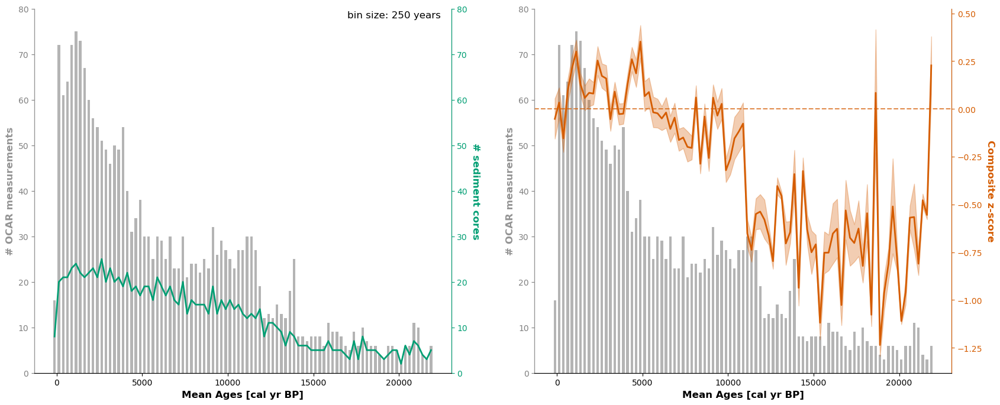

In [177]:
fig = plt.figure(figsize=(20,8))
ax1 = fig.add_subplot(121)
ax1.bar(x='Mid-point', height='No_OCAR', width = 150, data = binned_summary_250, color = '#949494', alpha = .7)
ax1.set_ylim(0,80)
ax1.set_ylabel('# OCAR measurements', fontsize = 12, fontweight = 'bold', color = '#949494')
ax1.set_xlabel('Mean Ages [cal yr BP]', fontsize = 12, fontweight = 'bold')
ax2 = ax1.twinx()
ax2.plot('Mid-point', 'No_CoreIDs', data = binned_summary_250, color = '#009e73', lw = 2)
ax2.set_ylim(0,80)
ax2.set_ylabel('# sediment cores', fontsize = 12, fontweight = 'bold', color = '#009e73', rotation = 270, va = 'bottom')
### Change style
ax2.spines['left'].set_color('#949494')
ax2.spines['right'].set_color('#009e73')
ax1.spines['top'].set_visible(False)
ax2.spines['top'].set_visible(False)
ax1.tick_params(axis='y', colors= 'grey')
ax2.tick_params(axis='y', colors='#009e73')
ax2.annotate((f"bin size: 250 years"), 
                 xy=(17000,78),
                 color = 'black',
                 fontsize = 12)
###
ax3 = fig.add_subplot(122)
ax3.bar(x='Mid-point', height='No_OCAR', width = 150, data = binned_summary_250, color = '#949494', alpha = .7)
ax3.set_ylim(0,80)
ax3.set_ylabel('# OCAR measurements', fontsize = 12, fontweight = 'bold', color = '#949494')
ax3.set_xlabel('Mean Ages [cal yr BP]', fontsize = 12, fontweight = 'bold')
ax4 = ax3.twinx()
ax4.plot('Mid-point', 'Median_z_score', data = boot_CI_250, color = '#d55c00', lw = 2)
ax4.fill_between(x = boot_CI_250['Mid-point'], 
                 y1 = boot_CI_250['ymin'], 
                 y2 = boot_CI_250['ymax'], 
                 color = '#d55c00',
                alpha = .3)
ax4.axhline(y=0, color='#d55c00', linestyle='--', alpha = .7)
ax4.set_ylabel('Composite z-score', fontsize = 12, fontweight = 'bold', color = '#d55c00', rotation = 270, va = 'bottom')
### Change style
ax4.spines['left'].set_color('#949494')
ax4.spines['right'].set_color('#d55c00')
ax3.spines['top'].set_visible(False)
ax4.spines['top'].set_visible(False)
ax3.tick_params(axis='y', colors= 'grey')
ax4.tick_params(axis='y', colors='#d55c00')
date = f"{datetime.datetime.now():%Y-%m-%d_%H-%M-%S}"
#plt.savefig(f'z-score_binned_250_{date}.pdf', dpi = 300, bbox_inches = 'tight')
plt.show()

## Binned 500 years

In [178]:
binned_summary_500 = pd.DataFrame()
for i in range(-500, 22000, 500):
    number_coreids = len(OCAR_potential[(OCAR_potential.age > i)&(OCAR_potential.age <= (i+500))].coreid.unique())
    number_OCAR = len(OCAR_potential[(OCAR_potential.age > i)&(OCAR_potential.age <= (i+500))])
    average_z = OCAR_potential[(OCAR_potential.age > i)&(OCAR_potential.age <= (i+500))]['z-score'].mean()
    bin_frame = pd.DataFrame(np.array([[number_coreids, number_OCAR, average_z, i, (i+500), (i+250)]]), columns = ['No_CoreIDs', 'No_OCAR', 'Average_z_score', 'Lower_bound', 'Upper_bound', 'Mid-point'])
    binned_summary_500 = pd.concat([binned_summary_500, bin_frame], ignore_index = True)

In [179]:
binned_CI_500 = pd.DataFrame()
binned_median_500 = []
for i in range(-500, 22000, 500):
    bin_frame = pd.DataFrame(np.array([[(i+250)]]), columns = ['Mid-point'])
    mean_per_bin = []
    for core in OCAR_potential.coreid.unique():
        c_bin_mean = OCAR_potential[(OCAR_potential.age > i)&(OCAR_potential.age <= (i+500))&(OCAR_potential.coreid.str.contains(core))]['z-score'].mean()
        mean_per_bin.append(c_bin_mean)
    binned_median_500.append(np.nanmean(mean_per_bin))
    df_mean_per_bin = pd.DataFrame(np.asarray(mean_per_bin).reshape(1,-1), columns = OCAR_potential.coreid.unique())
    bin_frame = pd.concat([bin_frame, df_mean_per_bin], axis = 1)
    binned_CI_500 = pd.concat([binned_CI_500, bin_frame], ignore_index = True)
binned_CI_500 = binned_CI_500.set_index(['Mid-point'])

In [180]:
boot_500 = pd.DataFrame()
for i in range(len(binned_CI_500)):
    boot_means = []
    for _ in range(10000):
        boot_sample = np.random.choice(binned_CI_500.iloc[i,], replace = True, size = 1000) # take a random sample each iteration
        boot_mean = np.nanmean(boot_sample)# calculate the mean for each iteration
        boot_means.append(boot_mean) # append the mean to boot_means
    boot_means_np = pd.DataFrame(np.array(boot_means).reshape(1,-1)) # transform it into a DataFrame for calculation
    boot_500 = pd.concat([boot_500, boot_means_np], ignore_index = True)
boot_500 = boot_500.set_index(binned_CI_500.index)

In [181]:
boot_CI_500 = pd.DataFrame()
for i in range(len(boot_500)):
    bin_CI = pd.DataFrame(np.percentile(boot_500.iloc[i,], [2.5,97.5]).reshape(1,-1), columns = ['ymin', 'ymax'])
    boot_CI_500 = pd.concat([boot_CI_500, bin_CI], ignore_index = True)
boot_CI_500 = boot_CI_500.set_index(boot_500.index)
boot_CI_500 = boot_CI_500.reset_index()
boot_CI_500['Median_z_score'] = binned_median_500

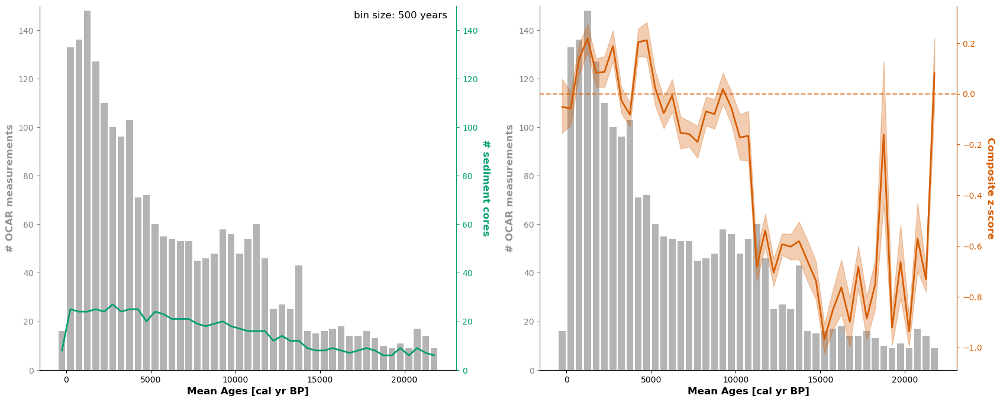

In [182]:
fig = plt.figure(figsize=(20,8))
ax1 = fig.add_subplot(121)
ax1.bar(x='Mid-point', height='No_OCAR', width = 400, data = binned_summary_500, color = '#949494', alpha = .7)
ax1.set_ylim(0,150)
ax1.set_ylabel('# OCAR measurements', fontsize = 12, fontweight = 'bold', color = '#949494')
ax1.set_xlabel('Mean Ages [cal yr BP]', fontsize = 12, fontweight = 'bold')
ax2 = ax1.twinx()
ax2.plot('Mid-point', 'No_CoreIDs', data = binned_summary_500, color = '#009e73', lw = 2)
ax2.set_ylim(0,150)
ax2.set_ylabel('# sediment cores', fontsize = 12, fontweight = 'bold', color = '#009e73', rotation = 270, va = 'bottom')
### Change style
ax2.spines['left'].set_color('#949494')
ax2.spines['right'].set_color('#009e73')
ax1.spines['top'].set_visible(False)
ax2.spines['top'].set_visible(False)
ax1.tick_params(axis='y', colors= 'grey')
ax2.tick_params(axis='y', colors='#009e73')
ax2.annotate((f"bin size: 500 years"), 
                 xy=(17000,145),
                 color = 'black',
                 fontsize = 12)
###
ax3 = fig.add_subplot(122)
ax3.bar(x='Mid-point', height='No_OCAR', width = 400, data = binned_summary_500, color = '#949494', alpha = .7)
ax3.set_ylim(0,150)
ax3.set_ylabel('# OCAR measurements', fontsize = 12, fontweight = 'bold', color = '#949494')
ax3.set_xlabel('Mean Ages [cal yr BP]', fontsize = 12, fontweight = 'bold')
ax4 = ax3.twinx()
ax4.plot('Mid-point', 'Median_z_score', data = boot_CI_500, color = '#d55c00', lw = 2)
ax4.fill_between(x = boot_CI_500['Mid-point'], 
                 y1 = boot_CI_500['ymin'], 
                 y2 = boot_CI_500['ymax'], 
                 color = '#d55c00',
                alpha = .3)
ax4.axhline(y=0, color='#d55c00', linestyle='--', alpha = .7)
ax4.set_ylabel('Composite z-score', fontsize = 12, fontweight = 'bold', color = '#d55c00', rotation = 270, va = 'bottom')
### Change style
ax4.spines['left'].set_color('#949494')
ax4.spines['right'].set_color('#d55c00')
ax3.spines['top'].set_visible(False)
ax4.spines['top'].set_visible(False)
ax3.tick_params(axis='y', colors= 'grey')
ax4.tick_params(axis='y', colors='#d55c00')
date = f"{datetime.datetime.now():%Y-%m-%d_%H-%M-%S}"
#plt.savefig(f'z-score_binned_500_{date}.pdf', dpi = 300, bbox_inches = 'tight')
plt.show()

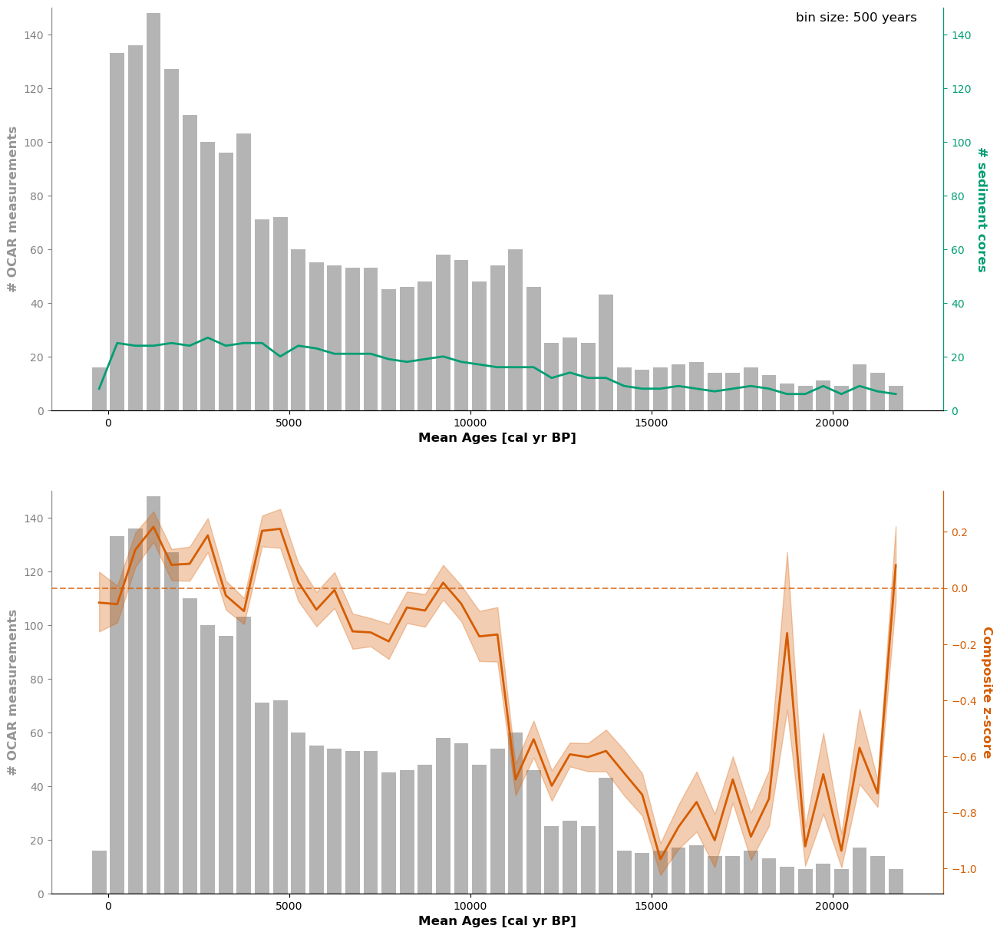

In [183]:
fig = plt.figure(figsize=(15,15))
ax1 = fig.add_subplot(211)
ax1.bar(x='Mid-point', height='No_OCAR', width = 400, data = binned_summary_500, color = '#949494', alpha = .7)
ax1.set_ylim(0,150)
ax1.set_ylabel('# OCAR measurements', fontsize = 12, fontweight = 'bold', color = '#949494')
ax1.set_xlabel('Mean Ages [cal yr BP]', fontsize = 12, fontweight = 'bold')
ax2 = ax1.twinx()
ax2.plot('Mid-point', 'No_CoreIDs', data = binned_summary_500, color = '#009e73', lw = 2)
ax2.set_ylim(0,150)
ax2.set_ylabel('# sediment cores', fontsize = 12, fontweight = 'bold', color = '#009e73', rotation = 270, va = 'bottom')
ax2.annotate((f"bin size: 500 years"), 
                 xy=(19000,145),
                 color = 'black',
                 fontsize = 12)
### Change style
ax2.spines['left'].set_color('#949494')
ax2.spines['right'].set_color('#009e73')
ax1.spines['top'].set_visible(False)
ax2.spines['top'].set_visible(False)
ax1.tick_params(axis='y', colors= 'grey')
ax2.tick_params(axis='y', colors='#009e73')
###
ax3 = fig.add_subplot(212)
ax3.bar(x='Mid-point', height='No_OCAR', width = 400, data = binned_summary_500, color = '#949494', alpha = .7)
ax3.set_ylim(0,150)
ax3.set_ylabel('# OCAR measurements', fontsize = 12, fontweight = 'bold', color = '#949494')
ax3.set_xlabel('Mean Ages [cal yr BP]', fontsize = 12, fontweight = 'bold')
ax4 = ax3.twinx()
ax4.plot('Mid-point', 'Median_z_score', data = boot_CI_500, color = '#d55c00', lw = 2)
ax4.fill_between(x = boot_CI_500['Mid-point'], 
                 y1 = boot_CI_500['ymin'], 
                 y2 = boot_CI_500['ymax'], 
                 color = '#d55c00',
                alpha = .3)
ax4.axhline(y=0, color='#d55c00', linestyle='--', alpha = .7)
ax4.set_ylabel('Composite z-score', fontsize = 12, fontweight = 'bold', color = '#d55c00', rotation = 270, va = 'bottom')
### Change style
ax4.spines['left'].set_color('#949494')
ax4.spines['right'].set_color('#d55c00')
ax3.spines['top'].set_visible(False)
ax4.spines['top'].set_visible(False)
ax3.tick_params(axis='y', colors= 'grey')
ax4.tick_params(axis='y', colors='#d55c00')
date = f"{datetime.datetime.now():%Y-%m-%d_%H-%M-%S}"
#plt.savefig(f'z-score_binned_500_{date}.jpg', dpi = 300, bbox_inches = 'tight')
plt.show()

## Binned per epoch

In [184]:
binned_summary_epoch = pd.DataFrame()
for i in range(len(boundaries)):
    if i == 0:
        number_coreids = len(OCAR_potential[(OCAR_potential.age <= boundaries[i+1])].coreid.unique())
        number_OCAR = len(OCAR_potential[(OCAR_potential.age <= boundaries[i+1])])
        bin_frame = pd.DataFrame(np.array([[number_coreids, number_OCAR, boundaries[i], boundaries[i+1], ((boundaries[i]+boundaries[i+1])/2), time_period[boundaries[i]]]]), 
                                 columns = ['No_CoreIDs', 'No_OCAR', 'Lower_bound', 'Upper_bound', 'Mid-point', 'Time_period'])
        binned_summary_epoch = pd.concat([binned_summary_epoch, bin_frame], ignore_index = True)
    elif i < (len(boundaries)-1):
        number_coreids = len(OCAR_potential[(OCAR_potential.age >= boundaries[i])&(OCAR_potential.age <= boundaries[i+1])].coreid.unique())
        number_OCAR = len(OCAR_potential[(OCAR_potential.age >= boundaries[i])&(OCAR_potential.age <= boundaries[i+1])])
        bin_frame = pd.DataFrame(np.array([[number_coreids, number_OCAR, boundaries[i], boundaries[i+1], ((boundaries[i]+boundaries[i+1])/2), time_period[boundaries[i]]]]), 
                                 columns = ['No_CoreIDs', 'No_OCAR', 'Lower_bound', 'Upper_bound', 'Mid-point', 'Time_period'])
        binned_summary_epoch = pd.concat([binned_summary_epoch, bin_frame], ignore_index = True)

In [185]:
binned_CI_epoch = pd.DataFrame()
binned_median_epoch = []
for i in range(len(boundaries)):
    if i == 0:
        bin_frame = pd.DataFrame(np.array([[((boundaries[i]+boundaries[i+1])/2)]]), columns = ['Mid-point'])
        mean_per_bin = []
        for core in OCAR_potential.coreid.unique():
            c_bin_mean = OCAR_potential[(OCAR_potential.age <= boundaries[i+1])&(OCAR_potential.coreid.str.contains(core))]['z-score'].mean()
            mean_per_bin.append(c_bin_mean)
        binned_median_epoch.append(np.nanmean(mean_per_bin))
        df_mean_per_bin = pd.DataFrame(np.asarray(mean_per_bin).reshape(1,-1), columns = OCAR_potential.coreid.unique())
        bin_frame = pd.concat([bin_frame, df_mean_per_bin], axis = 1)
        binned_CI_epoch = pd.concat([binned_CI_epoch, bin_frame], ignore_index = True)
    elif i < (len(boundaries)-1):
        bin_frame = pd.DataFrame(np.array([[((boundaries[i]+boundaries[i+1])/2)]]), columns = ['Mid-point'])
        mean_per_bin = []
        for core in OCAR_potential.coreid.unique():
            c_bin_mean = OCAR_potential[(OCAR_potential.age >= boundaries[i] )&(OCAR_potential.age <= boundaries[i+1])&(OCAR_potential.coreid.str.contains(core))]['z-score'].mean()
            mean_per_bin.append(c_bin_mean)
        binned_median_epoch.append(np.nanmean(mean_per_bin))
        df_mean_per_bin = pd.DataFrame(np.asarray(mean_per_bin).reshape(1,-1), columns = OCAR_potential.coreid.unique())
        bin_frame = pd.concat([bin_frame, df_mean_per_bin], axis = 1)
        binned_CI_epoch = pd.concat([binned_CI_epoch, bin_frame], ignore_index = True)
binned_CI_epoch = binned_CI_epoch.set_index(['Mid-point'])

In [186]:
boot_epoch = pd.DataFrame()
for i in range(len(binned_CI_epoch)):
    boot_means = []
    for _ in range(10000):
        boot_sample = np.random.choice(binned_CI_epoch.iloc[i,], replace = True, size = 1000) # take a random sample each iteration
        boot_mean = np.nanmean(boot_sample)# calculate the mean for each iteration
        boot_means.append(boot_mean) # append the mean to boot_means
    boot_means_np = pd.DataFrame(np.array(boot_means).reshape(1,-1)) # transform it into a DataFrame for calculation
    boot_epoch = pd.concat([boot_epoch, boot_means_np], ignore_index = True)
boot_epoch = boot_epoch.set_index(binned_CI_epoch.index)

In [187]:
boot_CI_epoch = pd.DataFrame()
for i in range(len(boot_epoch)):
    bin_CI = pd.DataFrame(np.percentile(boot_epoch.iloc[i,], [2.5,97.5]).reshape(1,-1), columns = ['ymin', 'ymax'])
    boot_CI_epoch = pd.concat([boot_CI_epoch, bin_CI], ignore_index = True)
boot_CI_epoch = boot_CI_epoch.set_index(boot_epoch.index)
boot_CI_epoch = boot_CI_epoch.reset_index()
boot_CI_epoch['Median_z_score'] = binned_median_epoch

In [188]:
binned_summary_epoch = binned_summary_epoch.astype(dtype = {'No_CoreIDs': int,
                                                            'No_OCAR': int,
                                                            'Lower_bound': int,
                                                            'Upper_bound': int,
                                                            'Mid-point': float,
                                                            'Time_period': str})

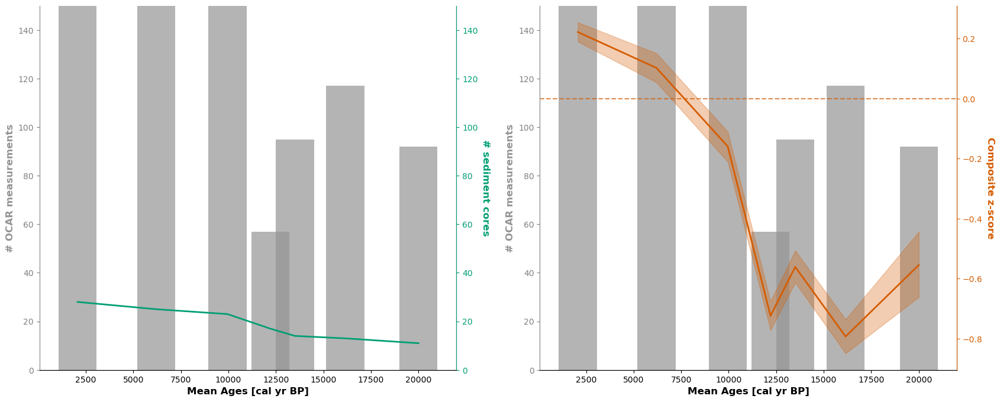

In [189]:
fig = plt.figure(figsize=(20,8))
ax1 = fig.add_subplot(121)
ax1.bar(x='Mid-point', height='No_OCAR', width = 2000, data = binned_summary_epoch, color = '#949494', alpha = .7)
ax1.set_ylim(0,150)
ax1.set_ylabel('# OCAR measurements', fontsize = 12, fontweight = 'bold', color = '#949494')
ax1.set_xlabel('Mean Ages [cal yr BP]', fontsize = 12, fontweight = 'bold')
ax2 = ax1.twinx()
ax2.plot('Mid-point', 'No_CoreIDs', data = binned_summary_epoch, color = '#009e73', lw = 2)
ax2.set_ylim(0,150)
ax2.set_ylabel('# sediment cores', fontsize = 12, fontweight = 'bold', color = '#009e73', rotation = 270, va = 'bottom')
### Change style
ax2.spines['left'].set_color('#949494')
ax2.spines['right'].set_color('#009e73')
ax1.spines['top'].set_visible(False)
ax2.spines['top'].set_visible(False)
ax1.tick_params(axis='y', colors= 'grey')
ax2.tick_params(axis='y', colors='#009e73')
###
ax3 = fig.add_subplot(122)
ax3.bar(x='Mid-point', height='No_OCAR', width = 2000, data = binned_summary_epoch, color = '#949494', alpha = .7)
ax3.set_ylim(0,150)
ax3.set_ylabel('# OCAR measurements', fontsize = 12, fontweight = 'bold', color = '#949494')
ax3.set_xlabel('Mean Ages [cal yr BP]', fontsize = 12, fontweight = 'bold')
ax4 = ax3.twinx()
ax4.plot('Mid-point', 'Median_z_score', data = boot_CI_epoch, color = '#d55c00', lw = 2)
ax4.fill_between(x = boot_CI_epoch['Mid-point'], 
                 y1 = boot_CI_epoch['ymin'], 
                 y2 = boot_CI_epoch['ymax'], 
                 color = '#d55c00',
                alpha = .3)
ax4.axhline(y=0, color='#d55c00', linestyle='--', alpha = .7)
ax4.set_ylabel('Composite z-score', fontsize = 12, fontweight = 'bold', color = '#d55c00', rotation = 270, va = 'bottom')
### Change style
ax4.spines['left'].set_color('#949494')
ax4.spines['right'].set_color('#d55c00')
ax3.spines['top'].set_visible(False)
ax4.spines['top'].set_visible(False)
ax3.tick_params(axis='y', colors= 'grey')
ax4.tick_params(axis='y', colors='#d55c00')
plt.show()

In [190]:
boxplot_all_z_score = OCAR_potential[['age','Mean_OCAR','z-score']].copy()

In [191]:
boxplot_all_z_score['time_period'] = False

In [192]:
for i in range(len(boundaries)):
    if i < (len(boundaries)-1):
        t_slice = boxplot_all_z_score[(boxplot_all_z_score.age >= boundaries[i])&(boxplot_all_z_score.age <= boundaries[i+1])].copy()
        t_slice['time_period'] = time_period[boundaries[i]]
        boxplot_all_z_score.update(t_slice)
t_slice = boxplot_all_z_score[boxplot_all_z_score.age <= 0].copy()
t_slice['time_period'] = time_period[boundaries[0]]
boxplot_all_z_score.update(t_slice)

In [193]:
boot_CI_epoch['time_period'] = time_period.values()

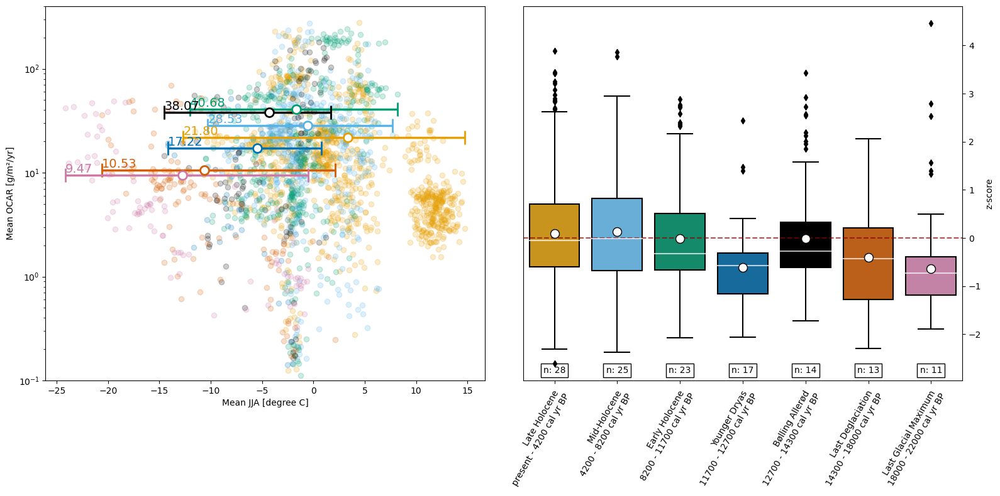

In [194]:
fig = plt.figure(figsize=(16,8))
ax1 = fig.add_subplot(121)
for i in range(len(boundaries)):
    if i < (len(boundaries)-1):
        ax1.scatter(x='degree_C', y='Mean_OCAR', 
                    data = OCAR_potential[(OCAR_potential.age >= boundaries[i])&(OCAR_potential.age <= boundaries [i+1])], 
                    color = color_time_period[time_period[boundaries[i]]],
                    label = '',
                   alpha = .2)
ax1.set_ylim(0.1,400)
ax1.set_yscale('log')
ax1.set_ylabel('Mean OCAR [g/m²/yr]')
ax1.set_xlabel('Mean JJA [degree C]')
for i,r in OCAR_summary_timeslice.iterrows():
    ax1.errorbar(x = OCAR_summary_timeslice.at[i,'Degree_C'], y = OCAR_summary_timeslice.at[i,'OCAR'], 
                 xerr = np.asarray(([OCAR_summary_timeslice.at[i, 'xerr_min']], 
                                    [OCAR_summary_timeslice.at[i, 'xerr_max']])), 
                 #yerr = np.asarray(([OCAR_summary_timeslice.at[i, 'yerr_min']], 
                 #                   [OCAR_summary_timeslice.at[i, 'yerr_max']])), 
                 linestyle = 'None', label = OCAR_summary_timeslice.at[i, 'label'], elinewidth = 2.5,
                 color = color_time_period[OCAR_summary_timeslice.at[i, 'label']], 
                marker = 'o', markersize = 10, mfc = 'white', mew = 2,
                capsize = 8)
    ax1.annotate((f"{OCAR_summary_timeslice.at[i,'OCAR']:.2f}"), 
                 xy=((OCAR_summary_timeslice.at[i, 'Degree_C'] - OCAR_summary_timeslice.at[i, 'xerr_min']), 
                     OCAR_summary_timeslice.at[i,'OCAR']),
                 color = color_time_period[OCAR_summary_timeslice.at[i, 'label']],
                 fontsize = 14,
                 xytext=(0,3), textcoords='offset points')

ax2 = fig.add_subplot(122)
sns.boxplot(x="time_period", y="z-score", data=boxplot_all_z_score, palette=color_time_period, 
            order = [*color_time_period.keys()], medianprops=dict(color="white", alpha=0.7), 
            showmeans=True,
            meanprops={"marker":"o",
                       "markerfacecolor":"white", 
                       "markeredgecolor":"black",
                      "markersize":"10"}, ax = ax2)
ax2.plot('time_period', 'Median_z_score', data = boot_CI_epoch, color = '#8b0000', lw = 0)

ax2.axhline(y=0, color='#8b0000', linestyle='--', alpha = .7)
for period in binned_summary_epoch.Time_period.unique():
    ax2.annotate(f"n: {binned_summary_epoch[binned_summary_epoch.Time_period == period]['No_CoreIDs'].values[0]}",
                 xy=(period, -2.8), ha='center',
                bbox=dict(boxstyle="square,pad=0.3", fc="none", lw=1))
#
####
ax2.set_ylabel('z-score')
ax2.set_xlabel('')
ax2.yaxis.set_ticks_position('right')
ax2.yaxis.set_label_position('right')
labels = ax2.get_xticklabels()
for i in range(len(labels)):
    if i < (len(boundaries)-1):
        if boundaries[i] == -72:
            labels[i] = f"{time_period[boundaries[i]]} \n present - {boundaries[i+1]} cal yr BP"
        else:
            labels[i] = f"{time_period[boundaries[i]]} \n {boundaries[i]} - {boundaries[i+1]} cal yr BP"
ax2.set_xticklabels(labels, rotation=60, ha='right', rotation_mode='anchor')

plt.tight_layout()
date = f"{datetime.datetime.now():%Y-%m-%d_%H-%M-%S}"
#plt.savefig(f'Temp_vs_OCAR_boxplot_z-score_{date}.jpg', dpi = 300, bbox_inches = 'tight')
plt.show()

In [195]:
for epoch in boxplot_all_z_score.time_period.unique():
    print(epoch, 'Mean', boxplot_all_z_score[boxplot_all_z_score.time_period == epoch]['z-score'].mean())
    print(epoch, 'Median', boxplot_all_z_score[boxplot_all_z_score.time_period == epoch]['z-score'].median())

Late Holocene Mean 0.0893787648540193
Late Holocene Median -0.05493586411762131
Mid-Holocene Mean 0.12613976054568632
Mid-Holocene Median -0.015395072729765908
Early Holocene Mean -0.011143878447695514
Early Holocene Median -0.32922400968086896
Younger Dryas Mean -0.6159755933201257
Younger Dryas Median -0.5769920076684804
Bølling Allerød Mean -0.01013954395544096
Bølling Allerød Median -0.27332801908870763
Last Deglaciation Mean -0.40165682008055004
Last Deglaciation Median -0.4291144296688523
Last Glacial Maximum Mean -0.6428538680795896
Last Glacial Maximum Median -0.7350015489216077


## Test for normality

In [196]:
corr_OCAR = OCAR_potential['Mean_OCAR']
corr_temp = OCAR_potential['degree_C']

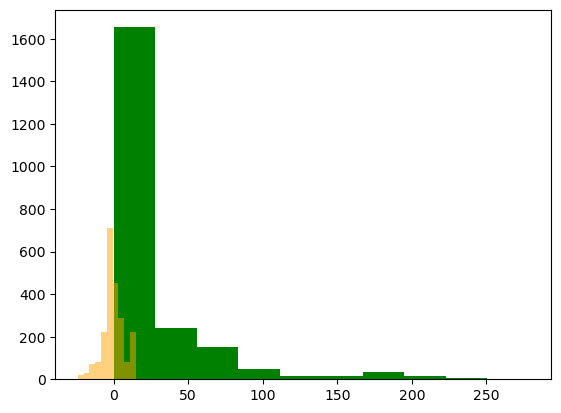

In [197]:
plt.hist(corr_OCAR, color = 'green')
plt.hist(corr_temp, color = 'orange', alpha = .5)
plt.show()

### Shapiro-Wilk test

In [198]:
shapiro_stat_OCAR, shapiro_p_OCAR = stats.shapiro(corr_OCAR)
shapiro_stat_temp, shapiro_p_temp = stats.shapiro(corr_temp)

In [199]:
alpha = .05
check_list_shapiro = [('temp', shapiro_p_temp), ('OCAR', shapiro_p_OCAR)]
for x in check_list_shapiro:
    if x[1] > alpha:
        print(f'{x[0]}: Normal distributed (fail to reject H0)')
    else:
        print(f'{x[0]}: Non-normal distributed (reject H0)')

temp: Non-normal distributed (reject H0)
OCAR: Non-normal distributed (reject H0)


### Quantile-Quantile plot / Q-Q plot

In [200]:
from statsmodels.graphics.gofplots import qqplot 

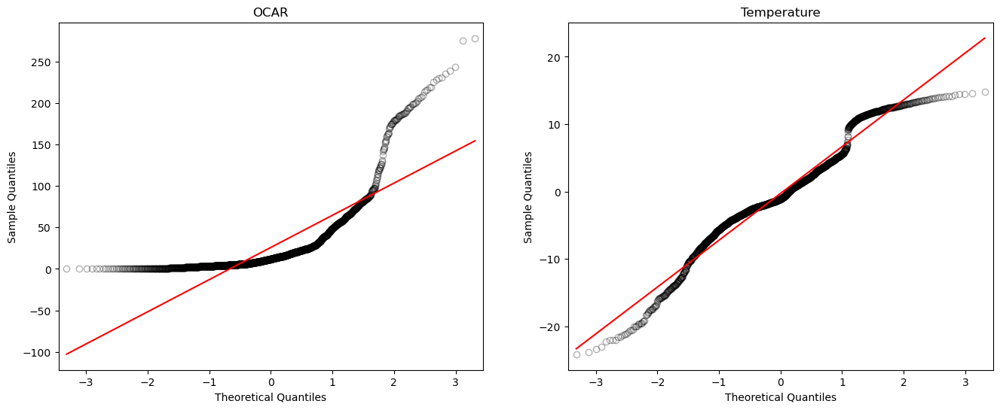

In [201]:
fig = plt.figure(figsize=(16,6))
ax1 = fig.add_subplot(121)
qqplot(corr_OCAR, line='s', markerfacecolor='none', markeredgecolor='black', alpha = .3, ax = ax1)
ax1.set_title('OCAR')
ax2 = fig.add_subplot(122)
qqplot(corr_temp, line='s', markerfacecolor='none', markeredgecolor='black', alpha = .3, ax = ax2)
ax2.set_title('Temperature')
plt.show()

### D’Agostino and Pearson’s test / D’Agostino’s K2 test

In [202]:
from scipy.stats import normaltest 

In [203]:
nstat_OCAR, nstat_p_OCAR = normaltest(corr_OCAR)
nstat_temp, nstat_p_temp = normaltest(corr_temp)

In [204]:
alpha = .05
check_list_nstat = [('temp', nstat_p_temp), ('OCAR', nstat_p_OCAR)]
for x in check_list_nstat:
    if x[1] > alpha:
        print(f'{x[0]}: Normal distributed (fail to reject H0)')
    else:
        print(f'{x[0]}: Non-normal distributed (reject H0)')

temp: Non-normal distributed (reject H0)
OCAR: Non-normal distributed (reject H0)


### Correlation test

In [205]:
pearson_corr, pearson_p_value = stats.pearsonr(corr_OCAR, corr_temp)
spearman_corr, spearman_p_value = stats.spearmanr(corr_OCAR, corr_temp)
kendall_tau, kendall_p_value = stats.kendalltau(corr_OCAR, corr_temp)

CC_list = [('Pearson', pearson_corr, pearson_p_value, 'r'),
           ('Spearman', spearman_corr, spearman_p_value, 'rho'),
           ('Kendall-Tau', kendall_tau, kendall_p_value, 'tau')]

In [206]:
alpha = .05
for x in CC_list:
    if x[2] > alpha:
        print(f'{x[0]}: The correlation is not statistically significant \n')
    else:
        print(f'{x[0]}: The correlation is statistically significant \np-value: {x[2]:.4}  \n{x[3]} value: {x[1]:.4} \n')

Pearson: The correlation is not statistically significant 

Spearman: The correlation is statistically significant 
p-value: 0.002899  
rho value: -0.06367 

Kendall-Tau: The correlation is statistically significant 
p-value: 0.006566  
tau value: -0.03879 



## Test with z-transformed data

In [207]:
z_score_frame = pd.DataFrame()
for ids in OCAR_potential.coreid.unique():
    z_slice = OCAR_potential[OCAR_potential.coreid.str.contains(ids)]
    z_trans = pd.DataFrame(np.array((z_slice['degree_C'] - z_slice['degree_C'].mean())/z_slice['degree_C'].std()), columns = ['z-score-temp'])
    z_score_frame = pd.concat([z_score_frame, z_trans], ignore_index = True)
OCAR_potential = pd.concat([OCAR_potential, z_score_frame], axis = 1)

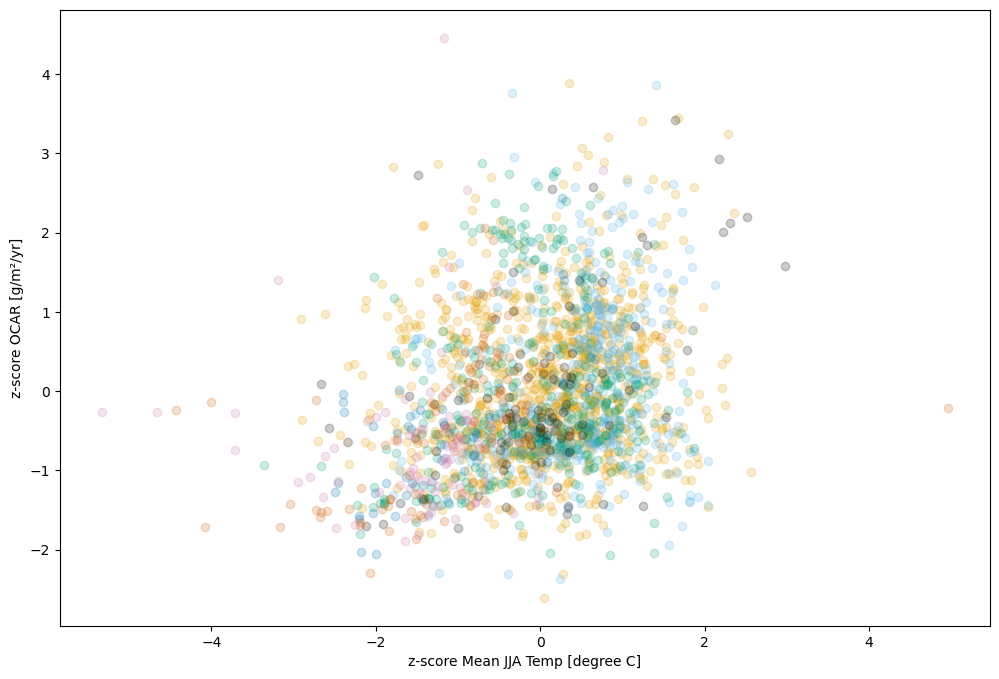

In [208]:
fig, ax1 = plt.subplots(figsize=(12,8))
for i in range(len(boundaries)):
    if i < (len(boundaries)-1):
        ax1.scatter(x='z-score-temp', y='z-score', 
                    data = OCAR_potential[(OCAR_potential.age >= boundaries[i])&(OCAR_potential.age <= boundaries [i+1])], 
                    color = color_time_period[time_period[boundaries[i]]],
                    label = '',
                   alpha = .2)
ax1.set_ylabel('z-score OCAR [g/m²/yr]')
ax1.set_xlabel('z-score Mean JJA Temp [degree C]')
plt.show()

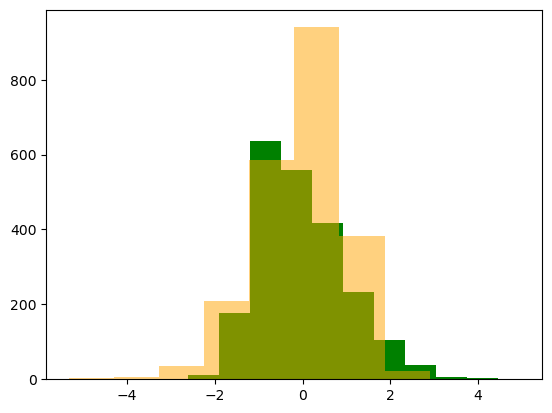

In [209]:
plt.hist(OCAR_potential['z-score'], color = 'green')
plt.hist(OCAR_potential['z-score-temp'], color = 'orange', alpha = .5)
plt.show()

In [210]:
corr_z_OCAR = OCAR_potential['z-score']
corr_z_temp = OCAR_potential['z-score-temp']

### Shapiro-Wilk test

In [211]:
shapiro_z_stat_OCAR, shapiro_z_p_OCAR = stats.shapiro(corr_z_OCAR)
shapiro_z_stat_temp, shapiro_z_p_temp = stats.shapiro(corr_z_temp)

In [212]:
alpha = .05
check_list_z_shapiro = [('temp', shapiro_z_p_temp), ('OCAR', shapiro_z_p_OCAR)]
for x in check_list_z_shapiro:
    if x[1] > alpha:
        print(f'{x[0]}: Normal distributed (fail to reject H0)')
    else:
        print(f'{x[0]}: Non-normal distributed (reject H0)')

temp: Non-normal distributed (reject H0)
OCAR: Non-normal distributed (reject H0)


### Quantile-Quantile plot / Q-Q plot

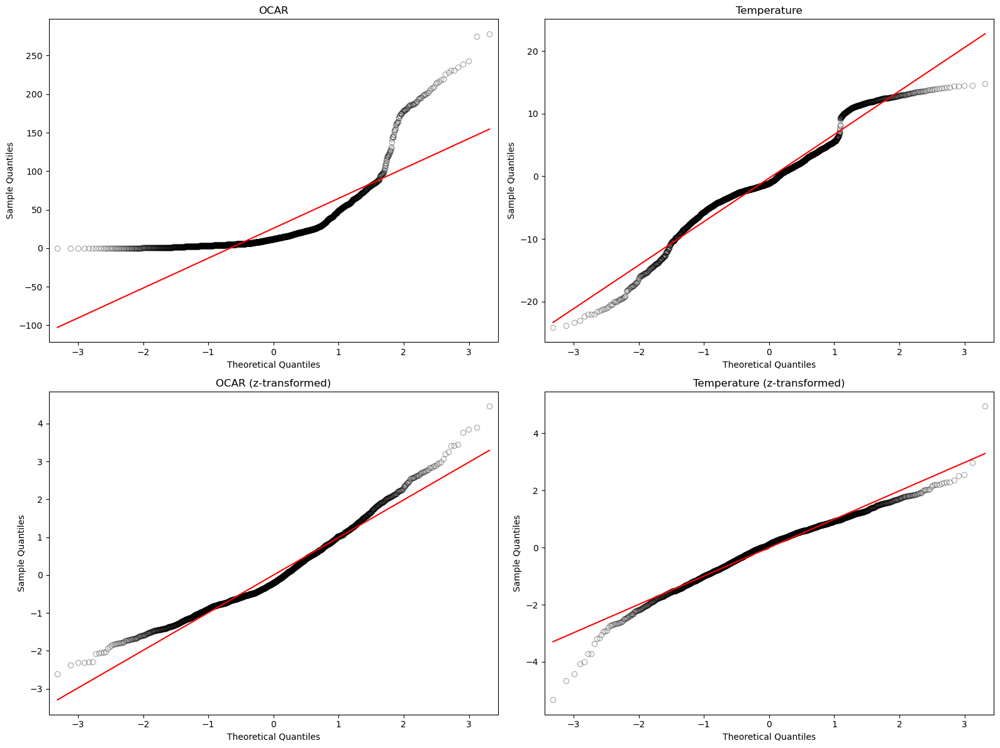

In [213]:
fig = plt.figure(figsize=(16,12))
ax1 = fig.add_subplot(221)
qqplot(corr_OCAR, line='s', markerfacecolor='none', markeredgecolor='black', alpha = .3, ax = ax1)
ax1.set_title('OCAR')
ax2 = fig.add_subplot(222)
qqplot(corr_temp, line='s', markerfacecolor='none', markeredgecolor='black', alpha = .3, ax = ax2)
ax2.set_title('Temperature')
ax3 = fig.add_subplot(223)
qqplot(corr_z_OCAR, line='s', markerfacecolor='none', markeredgecolor='black', alpha = .3, ax = ax3)
ax3.set_title('OCAR (z-transformed)')
ax4 = fig.add_subplot(224)
qqplot(corr_z_temp, line='s', markerfacecolor='none', markeredgecolor='black', alpha = .3, ax = ax4)
ax4.set_title('Temperature (z-transformed)')
plt.tight_layout()
date = f"{datetime.datetime.now():%Y-%m-%d_%H-%M-%S}"
#plt.savefig(f'QQ_plots_{date}.pdf', dpi = 300, bbox_inches = 'tight')
plt.show()

### D’Agostino and Pearson’s test / D’Agostino’s K2 test

In [214]:
nstat_z_OCAR, nstat_z_p_OCAR = normaltest(corr_z_OCAR)
nstat_z_temp, nstat_z_p_temp = normaltest(corr_z_temp)

In [215]:
nstat_z_p_OCAR

1.7358150529589286e-36

In [216]:
alpha = .05
check_list_z_nstat = [('temp', nstat_z_p_temp), ('OCAR', nstat_z_p_OCAR)]
for x in check_list_nstat:
    if x[1] > alpha:
        print(f'{x[0]}: Normal distributed (fail to reject H0)')
    else:
        print(f'{x[0]}: Non-normal distributed (reject H0)')

temp: Non-normal distributed (reject H0)
OCAR: Non-normal distributed (reject H0)


### Correlation test

In [217]:
pearson_z_corr, pearson_z_p_value = stats.pearsonr(corr_z_OCAR, corr_z_temp)
spearman_z_corr, spearman_z_p_value = stats.spearmanr(corr_z_OCAR, corr_z_temp)
kendall_z_tau, kendall_z_p_value = stats.kendalltau(corr_z_OCAR, corr_z_temp)

CC_z_list = [('Pearson', pearson_z_corr, pearson_z_p_value, 'r'),
           ('Spearman', spearman_z_corr, spearman_z_p_value, 'rho'),
           ('Kendall-Tau', kendall_z_tau, kendall_z_p_value, 'tau')]

In [218]:
alpha = .05
for x in CC_z_list:
    if x[2] > alpha:
        print(f'{x[0]}: The correlation is not statistically significant \n')
    else:
        print(f'{x[0]}: The correlation is statistically significant \np-value: {x[2]:.4}  \n{x[3]} value: {x[1]:.4} \n')

Pearson: The correlation is statistically significant 
p-value: 6.025e-29  
r value: 0.2356 

Spearman: The correlation is statistically significant 
p-value: 7.084e-30  
rho value: 0.2394 

Kendall-Tau: The correlation is statistically significant 
p-value: 8.687e-31  
tau value: 0.1646 



In [219]:
pearson_OzTu_corr, pearson_OzTu_p_value = stats.pearsonr(corr_z_OCAR, corr_temp)
spearman_OzTu_corr, spearman_OzTu_p_value = stats.spearmanr(corr_z_OCAR, corr_temp)
kendall_OzTu_tau, kendall_OzTu_p_value = stats.kendalltau(corr_z_OCAR, corr_temp)

CC_OzTu_list = [('Pearson', pearson_OzTu_corr, pearson_OzTu_p_value, 'r'),
           ('Spearman', spearman_OzTu_corr, spearman_OzTu_p_value, 'rho'),
           ('Kendall-Tau', kendall_OzTu_tau, kendall_OzTu_p_value, 'tau')]

In [220]:
alpha = .05
for x in CC_OzTu_list:
    if x[2] > alpha:
        print(f'{x[0]}: The correlation is not statistically significant \n')
    else:
        print(f'{x[0]}: The correlation is statistically significant \np-value: {x[2]:.4}  \n{x[3]} value: {x[1]:.4} \n')

Pearson: The correlation is statistically significant 
p-value: 4.733e-07  
r value: 0.1075 

Spearman: The correlation is statistically significant 
p-value: 5.374e-05  
rho value: 0.08627 

Kendall-Tau: The correlation is statistically significant 
p-value: 5.266e-05  
tau value: 0.0577 



## Correlation per CoreID

In [254]:
cc_coreid = pd.DataFrame(columns = ['coreid', 
                                   'r_value',
                                   'Pearson_p_value',
                                   'rho_value',
                                   'Spearman_p_value',
                                   'tau_value',
                                   'Kendall-Tau_p_value'])
alpha = .05
for core in OCAR_potential.coreid.unique():
    core_slice = OCAR_potential[OCAR_potential.coreid.str.contains(core)]
    OCAR_slice = core_slice['z-score']
    temp_slice = core_slice['z-score-temp']
    slice_pearson_corr, slice_pearson_p_value = stats.pearsonr(OCAR_slice, temp_slice)
    slice_spearman_corr, slice_spearman_p_value = stats.spearmanr(OCAR_slice, temp_slice)
    slice_kendall_tau, slice_kendall_p_value = stats.kendalltau(OCAR_slice, temp_slice)
    check_list_slice = [('Pearson', slice_pearson_p_value), 
                        ('Spearman', slice_spearman_p_value),
                       ('Kendall', slice_kendall_p_value)]
    for x in check_list_slice: ## To see if it is statistically significant - if not, then NaN
        if x[1] >= alpha:
            if x[0] == 'Pearson':
                slice_pearson_corr = slice_pearson_p_value = np.nan
            elif x[0] == 'Spearman':
                slice_spearman_corr = slice_spearman_p_value = np.nan
            else:
                slice_kendall_tau = slice_kendall_p_value = np.nan
    core_values = pd.DataFrame(np.array([[core,
                                         ['{0:.4}'.format(slice_pearson_corr) if slice_pearson_corr != np.nan else np.nan][0], 
                                         ['{0:.4}'.format(slice_pearson_p_value) if slice_pearson_p_value != np.nan else np.nan][0],
                                         ['{0:.4}'.format(slice_spearman_corr) if slice_spearman_corr != np.nan else np.nan][0], 
                                         ['{0:.4}'.format(slice_spearman_p_value) if slice_spearman_p_value != np.nan else np.nan][0],
                                         ['{0:.4}'.format(slice_kendall_tau) if slice_kendall_tau != np.nan else np.nan][0],
                                         ['{0:.4}'.format(slice_kendall_p_value) if slice_kendall_p_value != np.nan else np.nan][0]]]), columns = ['coreid', 
                                                                             'r_value',
                                                                             'Pearson_p_value',
                                                                             'rho_value',
                                                                             'Spearman_p_value',
                                                                             'tau_value',
                                                                             'Kendall-Tau_p_value'])
    cc_coreid = pd.concat([cc_coreid, core_values], ignore_index = True)
cc_coreid = cc_coreid.astype(dtype = {'coreid': str, 
                                      'r_value': float,
                                      'Pearson_p_value': float,
                                      'rho_value': float,
                                      'Spearman_p_value': float,
                                      'tau_value': float,
                                      'Kendall-Tau_p_value': float})#.dropna().reset_index(drop = True)

In [255]:
metadata_selection = core_metadata[['coreid', 'latitude', 'longitude', 'catchmentarea', 'laketype']]

In [256]:
cc_metadata = pd.merge(cc_coreid, metadata_selection, on = 'coreid', how = 'left')

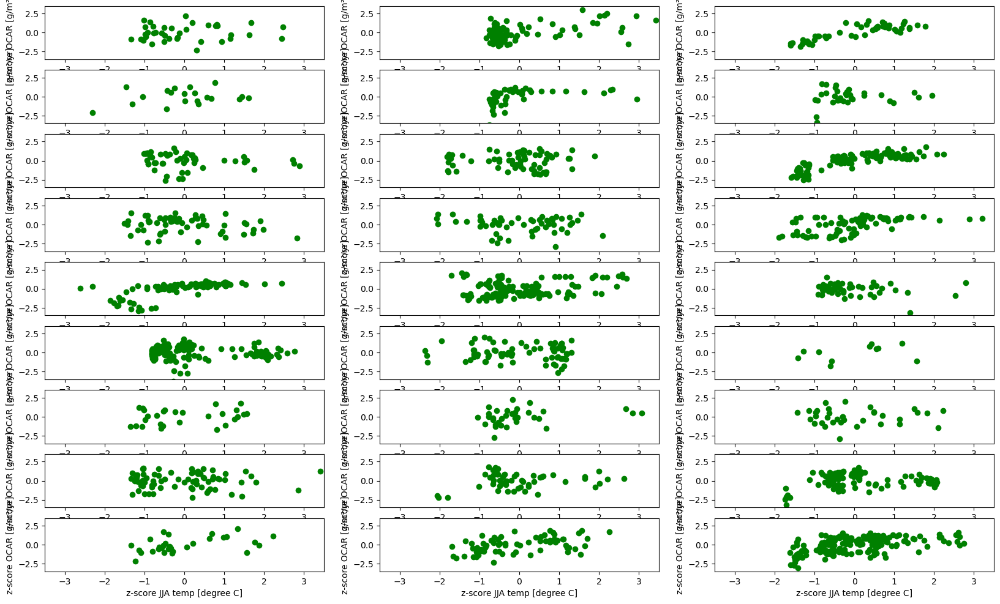

In [257]:
i = 0
fig, axes = plt.subplots(figsize=(20, 12), nrows=int(len(cc_metadata.coreid.unique())/3), ncols=3)
for ax in axes.flat:
    ax.scatter(x='z-score',y='z-score-temp', data = OCAR_potential[OCAR_potential.coreid.str.contains(cc_metadata.coreid.unique()[i])], color = 'green')
    ax.set_xlim(-3.5,3.5)
    ax.set_ylim(-3.5,3.5)
    ax.set_ylabel('z-score OCAR [g/m²/yr]')
    ax.set_xlabel('z-score JJA temp [degree C]')
    i += 1

date = f"{datetime.datetime.now():%Y-%m-%d_%H-%M-%S}"
#plt.savefig(f'Map_mean_OCAR_timeslice_{date}.pdf', dpi = 300, bbox_inches = 'tight')
plt.show()

In [258]:
cc_coreid

,coreid,r_value,Pearson_p_value,rho_value,Spearman_p_value,tau_value,Kendall-Tau_p_value
0,BN2016-1,NaN,NaN,NaN,NaN,NaN,NaN
1,Co1309,0.5026,2.104000e-07,0.3591,3.516000e-04,0.2533,2.766000e-04
2,Co1412,0.8503,5.533000e-15,0.7816,2.098000e-11,0.5837,2.219000e-09
3,EN18208,NaN,NaN,NaN,NaN,NaN,NaN
4,EN18218,0.2953,2.864000e-02,0.6165,5.398000e-07,0.4114,9.183000e-06
5,ESM-1,NaN,NaN,NaN,NaN,NaN,NaN
6,LS-9,NaN,NaN,-0.3183,2.146000e-02,-0.2216,2.075000e-02
7,PER3,NaN,NaN,NaN,NaN,NaN,NaN
8,PG1111,0.8065,2.586000e-30,0.7755,9.981000e-27,0.5737,1.137000e-21
9,PG1205,NaN,NaN,NaN,NaN,NaN,NaN


# Chatterjee test

In [ ]:
R_OCAR = np.array(corr_OCAR)
R_temp = np.array(corr_temp)
R_z_OCAR = np.array(corr_z_OCAR)
R_z_temp = np.array(corr_z_temp)

In [ ]:
%get R_OCAR R_temp R_z_OCAR R_z_temp

In [ ]:
# The following function computes the new correlation coefficient, and returns the P-value for testing independence unless otherwise specified. Removes NAs and converts factor variables to integers automatically, unless otherwise specified. In general, it is safe to just supply x and y, and leave the other parameters to their default values.

xi = function(x, y, pvalue = T, ties = T, method = "asymptotic", nperm = 1000, factor = T) {
    
    # x and y are the data vectors
    # The P-value for the test of independence is returned if pvalue = T. Otherwise, only the coefficient is returned. 
    # If ties = T, the algorithm assumes that the data has ties and employs the more elaborated theory for calculating the P-value. Otherwise, it uses the simpler theory. There is no harm in putting ties = T even if there are no ties.
    # method = "asymptotic" returns P-values computed by the asymptotic theory. If method = "permutation", a permutation test with nperm permutations is employed to estimate the P-value. Usually, there is no need for the permutation test. The asymptotic theory is good enough.
    # nperm is the number of permutations for the permutation test, if needed.
    # factor = T results in the algorithm checking whether x and y are factor variables and converting them to integers if they are. If it is known that the variables are numeric, a little bit of time can be saved by setting factor = F.
    
    
    # NAs are removed here:
    ok = complete.cases(x,y)
    x = x[ok]
    y = y[ok]
    
    # Factor variables are converted to integers here:
    if (factor == T) {
        if (!is.numeric(x)) x = as.numeric(factor(x))
        if (!is.numeric(y)) y = as.numeric(factor(y))
    }
    
    
    n = length(x) # n is the sample size.
    
    PI = rank(x, ties.method = "random") # PI is the rank vector for x, with ties broken at random 
    
    f = rank(y, ties.method = "max")/n # f[i] is number of j s.t. y[j] <= y[i], divided by n.
    
    g = rank(-y, ties.method = "max")/n # g[i] is number of j s.t. y[j] >= y[i], divided by n.
    
    ord = order(PI) # order of the x's, ties broken at random.
    
    f = f[ord] # Rearrange f according to ord.
    
    # xi is calculated in the next three lines:
    A1 = mean(abs(f[1:(n-1)] - f[2:n]))*(n-1)/(2*n)
    C = mean(g*(1-g))
    xi = 1 - A1/C
    
    
    # If P-value needs to be computed:
    if (pvalue == T) {
        
        # If there are no ties, return xi and theoretical P-value:
        if (ties == F) return(list(xi = xi, pval = 1 - pnorm(sqrt(n)*xi/sqrt(2/5))))
        
        # If there are ties, and the theoretical method is to be used for calculation P-values:
        if (method == "asymptotic") {
            
            # The following steps calculate the theoretical variance in the presence of ties:
            q = sort(f)
            ind = c(1:n)
            ind2 = 2*n - 2*ind + 1
            a = mean(ind2*q*q)/n
            c = mean(ind2*q)/n
            cq = cumsum(q)
            m = (cq + (n - ind)*q)/n
            b = mean(m^2)
            v = (a - 2*b + c^2)/(C^2)
            
            # Return xi and P-value:
            return(list(xi = xi, pval = 1 - pnorm(sqrt(n)*xi/sqrt(v))))
        }
        
        # If permutation test is to be used for calculating P-value:
        if (method == "permutation") {
            r = rep(0, nperm)
            for (i in 1:nperm) {
                x1 = runif(n, 0, 1)
                r[i] = xi(x1,y)$xi
            }
        
            # Return xi and P-value based on permutation test:
            return(list(xi = xi, pval = mean(r > xi)))
        }
        cat("Invalid method. Use either asymptotic or permutation.")
    }
    
    # If only xi is desired, return xi:
    else return(xi)
}


In [ ]:
xi(R_OCAR, R_temp, ties = T, factor = F)

In [ ]:
xi(R_z_OCAR, R_z_temp, ties = T, factor = F)

In [ ]:
xi(R_z_OCAR, R_temp, ties = T, factor = F)

## Overall map

In [3]:
#combined_OCAR = pd.read_csv(f'combined_OCAR_2022-04-26_12-31-40.csv')
combined_OCAR = pd.read_csv(f'combined_OCAR_2023-01-17_10-47-56.csv')

In [4]:
combined_OCAR[(combined_OCAR.coreid.str.contains('PG1437'))& (combined_OCAR.Mean_OCAR > 220)]

,coreid,compositedepth,TOC_mg_g,Weighted_mean_SR,Weighted_mean_age,Mean_OCAR,Min_OCAR,Max_OCAR
1649,PG1437,623.0,36.2005,0.769242,10966.333333,230.658623,13.467935,1946.790819
1653,PG1437,639.0,38.6155,0.753306,11054.333333,243.337857,13.452779,2069.274576
1689,PG1437,1031.0,26.8130,0.695762,27860.333333,257.185736,1.079419,3086.848001


In [5]:
our_results = combined_OCAR.groupby('coreid').mean()[['Mean_OCAR']].reset_index()
our_results = our_results.rename(columns = {'coreid':'name'})
our_results['Source'] = 'This publication \n(n=28)'

In [6]:
mendonca_OCAR = pd.read_excel(f'All_Lakes_OCAR_Mendonca.xlsx')
mendonca_results = mendonca_OCAR[['System_name', 'OCb_whole-system']]
mendonca_results = mendonca_results.rename(columns = {'System_name':'name',
                                                     'OCb_whole-system':'Mean_OCAR'})
mendonca_results['Source'] = 'Mendonca et al. (2017) \n(n=336)'

In [7]:
box_compare = pd.concat([our_results, mendonca_results], axis = 0)

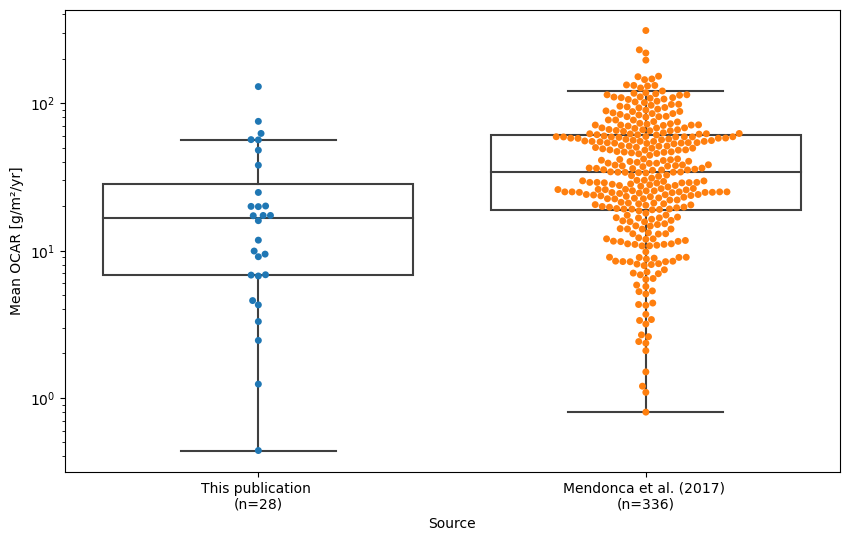

In [8]:
fig = plt.figure(figsize=(10,6))
ax1 = fig.add_subplot(111)
sns.boxplot(x='Source', y='Mean_OCAR', data=box_compare, boxprops={'facecolor':'None'}, fliersize = 0, ax=ax1)
sns.swarmplot(x='Source', y='Mean_OCAR', data=box_compare, hue = 'Source', legend=False, ax=ax1)
ax1.set_yscale('log')
ax1.set_ylabel('Mean OCAR [g/m²/yr]')
#plt.savefig(f'Mean_OCAR_comparison_Mendonca.jpg', dpi = 300, bbox_inches = 'tight')
plt.show()

In [9]:
def Avni(x):
    return 1.776 - (0.363 * np.log(x))

def Meno(x):
    return 1.881 - (0.385 * np.log(x))

def DeanGor(x):
    return (1.665*((x/10)**-0.887)) ### divided by 10 to factor in conversion from % to mg/g

def Campbell(x):
    ## Cannot use Campbell as this is based on LOI, rather than elemnental TOC measurement
    ## assuming sample depth at 100 cm // plus divided by 10 to factor conversion in
    return -0.10787 + (0.10845*100**0.12499) + (73.441*(x/10)**-2.2796)

x = np.array([i for i in range(1, 501, 5)])
x_1 = np.array([i for i in range(1, 150, 1)])

In [10]:
pred_result_df = pd.read_csv(f'predicted_DBD_TOC.csv')
#pred_result_df = pred_result_df[pred_result_df.DBD_mean < 2.65]

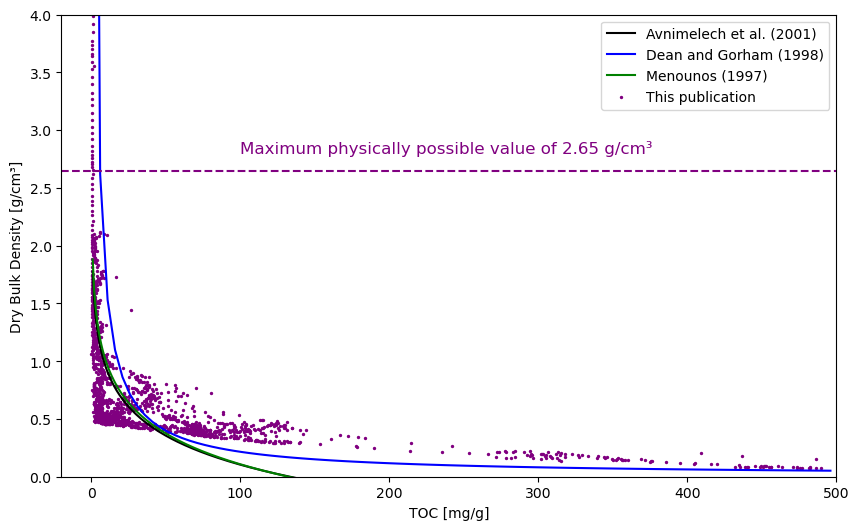

In [11]:
fig = plt.figure(figsize=(10,6))
ax1 = fig.add_subplot(111)

ax1.plot(x_1, Avni(x_1), color='black', label = 'Avnimelech et al. (2001)')
ax1.plot(x, DeanGor(x), color='blue', label = 'Dean and Gorham (1998)')
ax1.plot(x_1, Meno(x_1), color='green', label = 'Menounos (1997)')
#ax1.plot(x, Campbell(x), color='black')
ax1.scatter(x='TOC_mg_g', y='DBD_mean', data=pred_result_df, s = 2, color='purple', label = 'This publication')


ax1.set_ylim(0, 4)
ax1.set_xlim(-20, 500)
trans = ax1.get_xaxis_transform()
ax1.axhline(y=2.65, color='purple', linestyle='--')
plt.text(100, .7, 'Maximum physically possible value of 2.65 g/cm³', size = 12, color = 'purple', transform=trans)

ax1.set_ylabel('Dry Bulk Density [g/cm³]')
ax1.set_xlabel('TOC [mg/g]')
ax1.legend(loc='upper right', fontsize = 'medium')
#plt.savefig(f'TOC_DBD_Comparison_Literature.pdf', dpi = 300, bbox_inches = 'tight')
plt.show()

In [38]:
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

In [39]:
from netCDF4 import Dataset

In [40]:
core_metadata = pd.read_csv(f'RE3/coreid_metadata.csv')

In [41]:
core_metadata = core_metadata.astype(dtype = {'coreid':str,
                                             'latitude': float,
                                             'longitude': float})

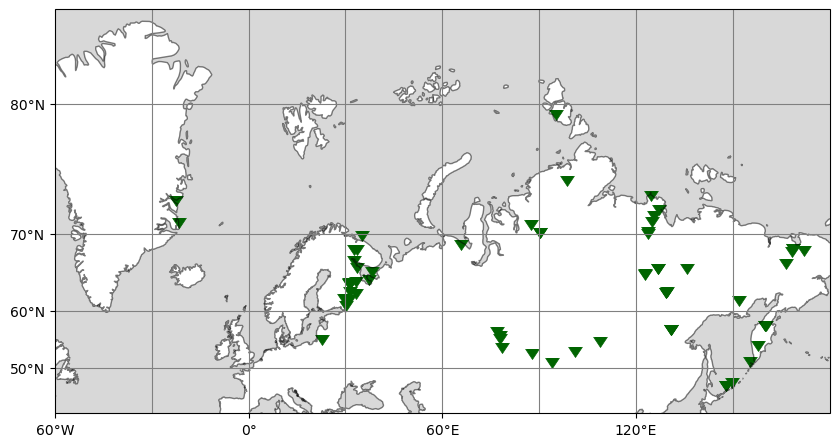

In [42]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(1, 1, 1,
                      projection=ccrs.Mercator())
ax.set_global()
#ax.stock_img()
ax.coastlines(alpha = .5)
ax.add_feature(cartopy.feature.OCEAN,facecolor='grey', alpha = .3)
ax.set_xticks([-60, 0, 60, 120, 180], crs=ccrs.PlateCarree())
ax.set_yticks([50, 60, 70, 80], crs=ccrs.PlateCarree())
ax.set_extent([-60, 180, 40, 85], crs=ccrs.PlateCarree())
lon_formatter = LongitudeFormatter(#number_format='.1f',
                                       degree_symbol='°',
                                       dateline_direction_label=True)
lat_formatter = LatitudeFormatter(#number_format='.1f',
                                      degree_symbol='°')
ax.xaxis.set_major_formatter(lon_formatter)
ax.yaxis.set_major_formatter(lat_formatter)
ax.gridlines(draw_labels = False, color = 'grey')
###
sc = ax.scatter(x='longitude',y='latitude', 
                marker = 7, linewidth = 0.5, s = 100, 
                facecolor = 'darkgreen', #edgecolor = 'black', 
                data = core_metadata, transform = ccrs.PlateCarree())
#plt.savefig(f'Location_CoreID_Paper3_green.jpg', dpi = 300, bbox_inches = 'tight')
plt.show()

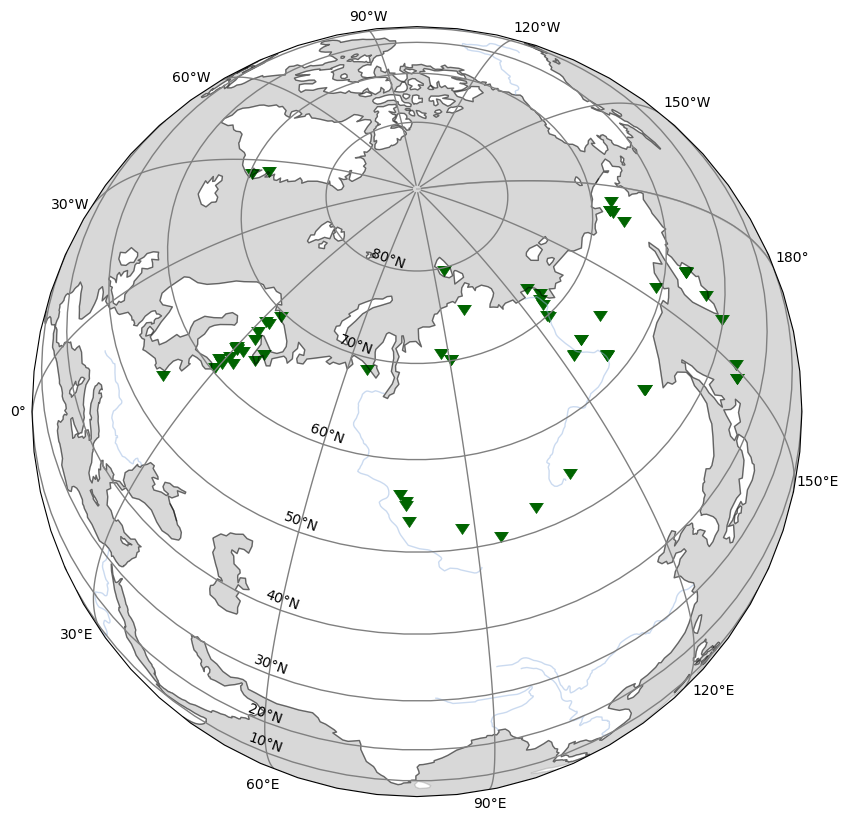

In [43]:
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(1, 1, 1,
                      projection=ccrs.NearsidePerspective(central_longitude=80.0, central_latitude=65.0, satellite_height=12000000))
ax.set_global()
#ax.stock_img()
ax.coastlines(alpha = .5)
ax.add_feature(cartopy.feature.OCEAN,
               color='grey', 
               alpha = .3)
ax.add_feature(cartopy.feature.RIVERS, 
               alpha = .5)
gls = ax.gridlines(draw_labels = True, crs=ccrs.PlateCarree(), color = 'grey', lw = 1, 
            y_inline = True, x_inline= False, xlocs = range(-180,180,30), ylocs = range(10,90,10))
gls.rotate_labels = False
gls.ylabel_style = {'rotation': -20}
###
sc = ax.scatter(x='longitude',y='latitude', 
                marker = 7, linewidth = 0.5, s = 100, 
                facecolor = 'darkgreen', #edgecolor = 'black', 
                data = core_metadata, transform = ccrs.PlateCarree())
###
plt.draw()

grid_ylocation = {
    '0°' : [-100000,500000],
    '30°W': [100000,150000],
    '60°W': [100000,100000],
    '90°W': [0,0],
    '120°W': [-150000,100000],
    '150°W': [-150000,200000],
    '180°': [0,500000],
    '30°E': [-400000,400000],
    '60°E': [-200000,0],
    '90°E': [0,0],
    '120°E': [500000,400000],
    '150°E': [300000,600000] 
}
grid_xlocation = {
    '10°N': [4],
    '20°N': [2],
    '30°N': [1.75],
    '40°N': [1.5],
    '50°N': [1.25],
    '60°N': [1.25],
    '70°N': [1],
    '80°N': [1]
}

text_list = []
for ea in gls.label_artists:
    ea.set_visible(True)
    pos = ea.get_position()
    txt = ea.get_text()
    if txt in text_list:
        ea.set_text('')
    else:
        if (pos[0] == 90):
            ea.set_position([60, pos[1]+grid_xlocation[txt][0]])
        elif (pos[0] == -90):
            #ea.set_text('')
            ea.set_position([60, pos[1]+grid_xlocation[txt][0]])
        else:
            ea.set_position([pos[0]+grid_ylocation[txt][0], pos[1]+grid_ylocation[txt][1]])
        text_list.append(txt)

#gls.label_artists.append(plt.text(-4700000, 0,'0°'))
#gls.label_artists.append(plt.text(-4100000, -2600000,'30°E'))
#gls.label_artists.append(plt.text(3100000, -3300000,'120°E'))
#gls.label_artists.append(plt.text(4400000, -1000000,'150°E'))
#gls.label_artists.append(plt.text(4200000, 1700000,'180°'))

plt.draw()
#plt.savefig(f'Location_CoreID_Paper3_green_before.jpg', dpi = 300)#, bbox_inches = 'tight')
plt.show()

In [44]:
nc = Dataset('JSBACH_pmt_moc_25k_biomePFT_0ka.nc','r')

lon = nc.variables['lon'][:]
lat = nc.variables['lat'][:]
time = nc.variables['time'][:]
time_bnds = nc.variables['time_bnds'][:]
cover_fract = nc.variables['cover_fract'][:,:]

nc.close()

In [45]:
biome = pd.read_csv(f'Pollen-Based-Biome-Reconstruction_anne.csv', sep = '\t')

In [46]:
look_up_table = pd.DataFrame()
for x in range(0,250):
    start = (25000-100*x)
    end = start-99
    time_slice = pd.DataFrame(np.array([[(1001+x), start, end]]))
    look_up_table = pd.concat([look_up_table, time_slice], axis = 0)
look_up_table.reset_index(drop = True, inplace = True)
look_up_table.columns = ['Model_Index', 'Start_Date', 'End_Date']

In [47]:
def get_data_for_mpl(X, Y, Z):
    result_x = np.unique(X)
    result_y = np.unique(Y)
    result_z = np.zeros((len(result_x), len(result_y)))
    # result_z[:] = np.nan

    for x, y, z in zip(X, Y, Z):
        i = np.searchsorted(result_x, x)
        j = np.searchsorted(result_y, y)
        result_z[i, j] = z

    return result_x, result_y, result_z

In [48]:
start_biome = biome[biome.KaBP == 0]
biome_lon = start_biome.Longitude
biome_lat = start_biome.Latitude
biome_z = start_biome.Mega_biome
cont_x, cont_y, cont_z = get_data_for_mpl(biome_lon, biome_lat, biome_z)

In [49]:
grid_ylocation = {
    '0°' : [-100000,500000],
    '30°W': [100000,150000],
    '60°W': [100000,100000],
    '90°W': [0,0],
    '120°W': [-150000,100000],
    '150°W': [-150000,200000],
    '180°': [0,500000],
    '30°E': [-400000,400000],
    '60°E': [-200000,0],
    '90°E': [0,0],
    '120°E': [500000,400000],
    '150°E': [400000,600000] 
}
grid_xlocation = {
    '10°N': [4],
    '20°N': [2],
    '30°N': [1.75],
    '40°N': [1.5],
    '50°N': [1.25],
    '60°N': [1.25],
    '70°N': [1],
    '80°N': [1]
}


In [50]:
color_model = {
    'ocean': 'white',
    'tropical forest': '#083a25',
    'warm-temperate forest': '#0f418f',
    'temperate forest': '#017730',
    'boreal forest': '#2a9db2',
    'savanna & dry woodland': '#850b00', 
    'grassland & dry shrubland': '#a3e209',
    'desert': '#fef251',
    'tundra': '#625489',
    'ice & polar desert': '#7da9e7'
}

In [51]:
from  matplotlib.colors import ListedColormap
import matplotlib.transforms
import matplotlib.patches as mpatches
from cartopy.io.shapereader import Reader
from cartopy.feature import ShapelyFeature
import geopandas as gpd

In [52]:
color_list = []
key_list = []
for keys, values in color_model.items():
    color_list.append(values)
    key_list.append(keys)

In [53]:
cmap_model = ListedColormap(color_list)

In [54]:
levels = [x for x in range(0,10)]

In [55]:
markers = {'Glacial lake': 'o',
           'Meteorite lake': '*',
           'Shoreline lake': 'x', 
           'Tectonic lake': 's',
           'Thermokarst lake': 'd'
          }

In [56]:
boundaries = [-72, 4200, 8200, 11700, 12700, 14300, 18000, 22000]

In [57]:
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return array[idx]

C:\Anaconda3\envs\LANDO\lib\site-packages\shapely\predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
C:\Anaconda3\envs\LANDO\lib\site-packages\shapely\predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
C:\Anaconda3\envs\LANDO\lib\site-packages\shapely\predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
C:\Anaconda3\envs\LANDO\lib\site-packages\shapely\predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)


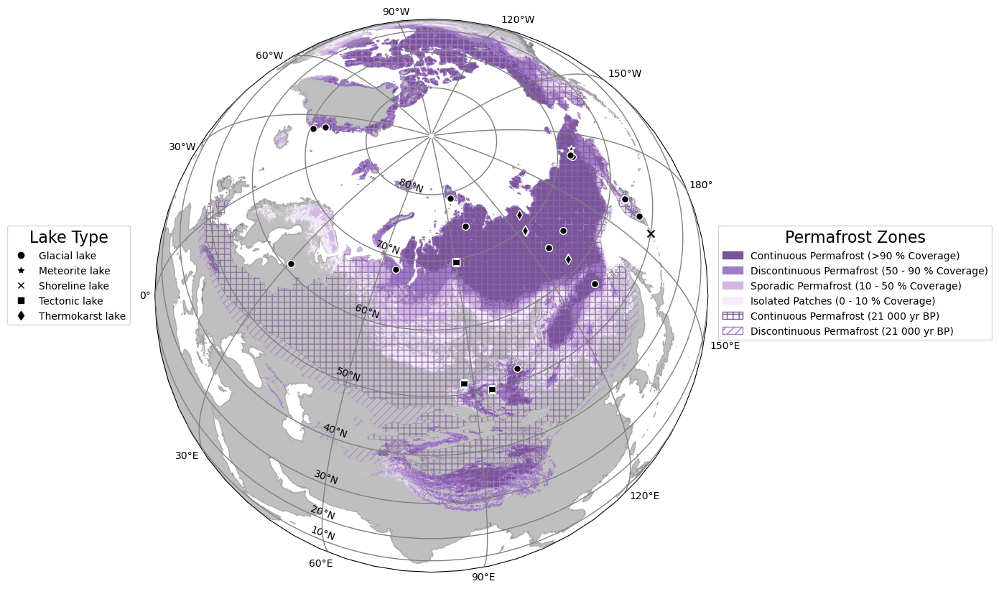

In [58]:
AGEOFINTEREST = [0]
i = 0
if AGEOFINTEREST[i] <= 100:
    LOOKUPINDEX = look_up_table.iloc[-1,:].name
else:
    LOOKUPINDEX = look_up_table[look_up_table.Start_Date == AGEOFINTEREST[i]].index[0]
###
crs = ccrs.NorthPolarStereo(true_scale_latitude=70)
crs_new = ccrs.NearsidePerspective(central_longitude=80.0, central_latitude=65.0, satellite_height=12000000)
###    
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(111, projection=crs_new)
ax.set_global()
LAND_50m = cartopy.feature.NaturalEarthFeature('physical', 'land', '50m', edgecolor = 'grey', facecolor='grey')
ax.add_feature(LAND_50m, alpha = .5)

fname = r'./PermafrostMap/ppp1851-sup-zonation.shp'
shdf = gpd.read_file(fname)
##
cont_geometries = [crs_new.project_geometry(ii, src_crs=crs) for ii in shdf[shdf.COMMENT == 'Continuous'].geometry.values]
discon_geometries = [crs_new.project_geometry(ii, src_crs=crs) for ii in shdf[shdf.COMMENT == 'Discontinuous'].geometry.values]
ax.add_geometries(cont_geometries, crs=crs_new, linewidth = .2, facecolor = 'none', edgecolor = '#795497', alpha = .7, zorder = 3, hatch = '++')
ax.add_geometries(discon_geometries, crs=crs_new, linewidth = .2, facecolor = 'none', edgecolor = '#A17BC8', alpha = .7, zorder = 3, hatch = '///')
###
fname = r'./PermafrostMap/UiO_PEX_PERZONES_5.0_20181128_2000_2016_NH.shp'
shdf = gpd.read_file(fname)
#
cont_geometries = [crs_new.project_geometry(ii, src_crs=crs) for ii in shdf[shdf.EXTENT == 'Cont'].geometry.values]
discon_geometries = [crs_new.project_geometry(ii, src_crs=crs) for ii in shdf[shdf.EXTENT == 'Discon'].geometry.values]
spora_geometries = [crs_new.project_geometry(ii, src_crs=crs) for ii in shdf[shdf.EXTENT == 'Spora'].geometry.values]
isol_geometries = [crs_new.project_geometry(ii, src_crs=crs) for ii in shdf[shdf.EXTENT == 'Isol'].geometry.values]
#
ax.add_geometries(cont_geometries, crs=crs_new, linewidth = .4, facecolor = '#795497', edgecolor = '#A17BC8', zorder = 2, hatch = '++')
ax.add_geometries(discon_geometries, crs=crs_new, linewidth = .4, facecolor = '#A17BC8', zorder = 2)
ax.add_geometries(spora_geometries, crs=crs_new, linewidth = .4, facecolor = '#D5B5E6', zorder = 2)
ax.add_geometries(isol_geometries, crs=crs_new, linewidth = .4, facecolor = '#F6EBFC', zorder = 2)
###
gls = ax.gridlines(draw_labels = True, crs=ccrs.PlateCarree(), color = 'grey', lw = 1, 
            y_inline = True, x_inline=False, xlocs = range(-180,180,30), ylocs = range(10,90,10), zorder=20)
gls.rotate_labels = False
gls.ylabel_style = {'rotation': -20}
###
if AGEOFINTEREST[i] in boundaries:
    upper_boundary = boundaries.index(AGEOFINTEREST[i])
    lower_boundary = upper_boundary - 1
else:
    closest = find_nearest(boundaries, AGEOFINTEREST[i])
    if (closest >= AGEOFINTEREST[i]):
        upper_boundary = boundaries.index(closest)
        lower_boundary = upper_boundary - 1
    else:
        lower_boundary = boundaries.index(closest)
        upper_boundary = lower_boundary + 1
for key in markers.keys():
    df_marker = OCAR_timeslices[lower_boundary, upper_boundary][OCAR_timeslices[lower_boundary, upper_boundary].laketype.str.contains(key)]
    if len(df_marker) > 0:
        if markers[key] == 'x':
            ax.scatter(x='longitude',y='latitude', c = 'black', data = df_marker, marker = markers[key], s = 50, transform = ccrs.PlateCarree(), zorder = 30)
        else:
            ax.scatter(x='longitude',y='latitude', c = 'black', data = df_marker, marker = markers[key], s = 50, edgecolor = 'white', transform = ccrs.PlateCarree(), zorder = 30)
###
plt.draw()

text_list = []
for ea in gls.label_artists:
    ea.set_visible(True)
    pos = ea.get_position()
    txt = ea.get_text()
    if txt in text_list:
        ea.set_text('')
    else:
        if (pos[0] == 90):
            ea.set_position([60, pos[1]+grid_xlocation[txt][0]])
        elif (pos[0] == -90):
            #ea.set_text('')
            ea.set_position([60, pos[1]+grid_xlocation[txt][0]])
        else:
            ea.set_position([pos[0]+grid_ylocation[txt][0], pos[1]+grid_ylocation[txt][1]])
        text_list.append(txt)

plt.draw()
####
con_legend = mpatches.Patch(color='#795497', label='Continuous Permafrost (>90 % Coverage)')
dcon_legend = mpatches.Patch(color='#A17BC8', label='Discontinuous Permafrost (50 - 90 % Coverage)')
spo_legend = mpatches.Patch(color='#D5B5E6', label='Sporadic Permafrost (10 - 50 % Coverage)')
iso_legend = mpatches.Patch(color='#F6EBFC', label='Isolated Patches (0 - 10 % Coverage)')
con_21k_legend = mpatches.Patch(facecolor = 'white', edgecolor='#795497', hatch = '++', label='Continuous Permafrost (21 000 yr BP)')
dcon_21k_legend = mpatches.Patch(facecolor = 'white', edgecolor='#A17BC8', hatch = '///', label='Discontinuous Permafrost (21 000 yr BP)')
handles_c = [con_legend, dcon_legend, spo_legend, iso_legend, con_21k_legend, dcon_21k_legend]
legend1 = fig.legend(handles = handles_c, bbox_to_anchor = (1.3, 0.6), title = 'Permafrost Zones', title_fontsize = 16)
handles_m = [(markers[i], 'black') for i in markers.keys()]
labels_m = [i for i in markers.keys()]
legend2 = fig.legend(handles = handles_m, labels = labels_m, handler_map={tuple : MarkerHandler()}, bbox_to_anchor = (0.1, 0.6), title = 'Lake Type', title_fontsize = 16)
#ax.add_artist(legend1)
#ax.add_artist(legend2)
#plt.savefig(f'Location_CoreID_Paper3_with_Permafrost_21k-2.pdf', dpi = 300, bbox_inches = 'tight')
plt.show()

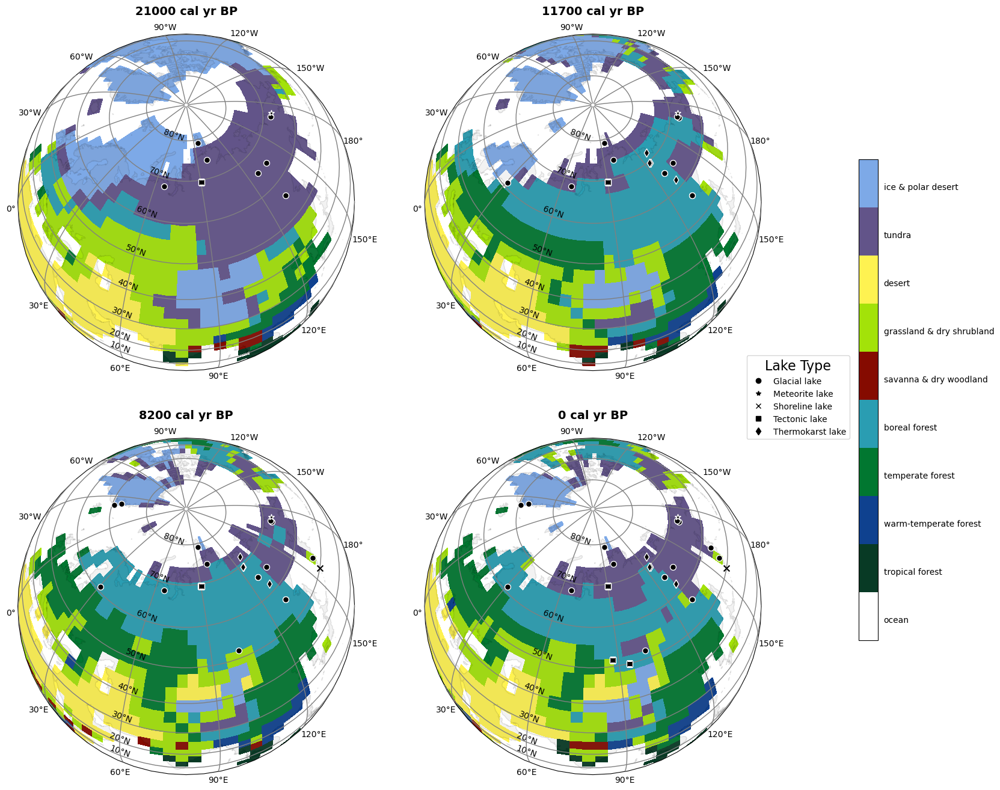

In [60]:
AGEOFINTEREST = [21000, 11700, 8200, 0]
fig, axes = plt.subplots(figsize=(16, 16), nrows=2, ncols=2, 
                         subplot_kw = {'projection': ccrs.NearsidePerspective(central_longitude=80.0, central_latitude=65.0, satellite_height=12000000)})
for i, ax in enumerate(axes.flat):
    if AGEOFINTEREST[i] <= 100:
        LOOKUPINDEX = look_up_table.iloc[-1,:].name
    else:
        LOOKUPINDEX = look_up_table[look_up_table.Start_Date == AGEOFINTEREST[i]].index[0]
    model_plot = ax.pcolormesh(lon, lat, cover_fract[LOOKUPINDEX], transform=ccrs.PlateCarree(), cmap = cmap_model, vmin = 0, vmax = 10, zorder = 1)
    #
    LAND_50m = cartopy.feature.NaturalEarthFeature('physical', 'land', '50m', 
                                                   edgecolor = 'black', 
                                                   facecolor='grey')
    ax.add_feature(LAND_50m, alpha = .1)
    ax.set_global()
    gls = ax.gridlines(draw_labels = True, crs=ccrs.PlateCarree(), color = 'grey', lw = 1, 
            y_inline = True, x_inline=False, xlocs = range(-180,180,30), ylocs = range(10,90,10), zorder=20)
    gls.rotate_labels = False
    gls.ylabel_style = {'rotation': -20}
    plt.draw()
    ###
    text_list = []
    for ea in gls.label_artists:
        ea.set_visible(True)
        pos = ea.get_position()
        txt = ea.get_text()
        if txt in text_list:
            ea.set_text('')
        else:
            if (pos[0] == 90):
                ea.set_position([60, pos[1]+grid_xlocation[txt][0]])
            elif (pos[0] == -90):
                #ea.set_text('')
                ea.set_position([60, pos[1]+grid_xlocation[txt][0]])
            else:
                ea.set_position([pos[0]+grid_ylocation[txt][0], pos[1]+grid_ylocation[txt][1]])
        text_list.append(txt)
    plt.draw()
    ###
    #if AGEOFINTEREST[i] in boundaries:
    #    upper_boundary = boundaries.index(AGEOFINTEREST[i])
    #    lower_boundary = upper_boundary - 1
    #else:
    #    closest = find_nearest(boundaries, AGEOFINTEREST[i])
    #    if (closest >= AGEOFINTEREST[i]):
    #        upper_boundary = boundaries.index(closest)
    #        lower_boundary = upper_boundary - 1
    #    else:
    #        lower_boundary = boundaries.index(closest)
    #        upper_boundary = lower_boundary + 1
    core_index = combined_OCAR[(combined_OCAR.age < 22000)].groupby("coreid").max()[(combined_OCAR[(combined_OCAR.age < 22000)].groupby("coreid").max().age >= AGEOFINTEREST[i])].index
    all_marker = OCAR_timeslices[(0,1)][(OCAR_timeslices[(0,1)].coreid.isin(core_index))] 
    for key in markers.keys():
        df_marker = all_marker[all_marker.laketype.str.contains(key)]
        if len(df_marker) > 0:
            if markers[key] == 'x':
                ax.scatter(x='longitude',y='latitude', c = 'black', data = df_marker, marker = markers[key], s = 50, transform = ccrs.PlateCarree(), zorder = 30)
            else:
                ax.scatter(x='longitude',y='latitude', c = 'black', data = df_marker, marker = markers[key], s = 50, edgecolor = 'white', transform = ccrs.PlateCarree(), zorder = 30)
    ax.set_title(f'{AGEOFINTEREST[i]} cal yr BP', fontweight = 'bold', pad = 10, fontsize = 14)
    plt.draw()
###
position = fig.add_axes([1, 0.25, 0.02, 0.5])  
cb_2 = fig.colorbar(model_plot, cax=position)
cb_2.ax.yaxis.set_ticks_position('none')
cb_2.ax.yaxis.set_ticks(ticks = levels)
cb_2.ax.yaxis.set_ticklabels(key_list)
####
dx = 0/72.; dy = 25/72. 
offset = matplotlib.transforms.ScaledTranslation(dx, dy, fig.dpi_scale_trans)
for label in cb_2.ax.yaxis.get_majorticklabels():
    label.set_transform(label.get_transform() + offset)
##
handles_m = [(markers[i], 'black') for i in markers.keys()]
labels_m = [i for i in markers.keys()]
plt.legend(handles = handles_m, labels = labels_m, handler_map={tuple : MarkerHandler()}, bbox_to_anchor = (-0.25, 0.6), title = 'Lake Type', title_fontsize = 16)
date = f"{datetime.datetime.now():%Y-%m-%d_%H-%M-%S}"
#plt.savefig(f'Vegetation_TimeScale_{date}.jpg', dpi = 300, bbox_inches = 'tight')
plt.show()

## Get the value for sediment cores from vegetation reconstruction

In [61]:
time = 1

In [62]:
AGEOFINTEREST = [21000, 
                 20000,
                 16200,
                 13500,
                 12200,
                 11700,
                 9900,
                 8200, 
                 6200,
                 2100,
                 0]

In [63]:
if AGEOFINTEREST[time] <= 100:
    LOOKUPINDEX = look_up_table.iloc[-1,:].name
else:
    LOOKUPINDEX = look_up_table[look_up_table.Start_Date == AGEOFINTEREST[time]].index[0]

In [64]:
model_plot = ax.pcolormesh(lon, lat, cover_fract[LOOKUPINDEX], transform=ccrs.PlateCarree(), cmap = cmap_model, vmin = 0, vmax = 10, zorder = 1) 

In [65]:
if AGEOFINTEREST[time] in boundaries:
    upper_boundary = boundaries.index(AGEOFINTEREST[time])
    lower_boundary = upper_boundary - 1
else:
    closest = find_nearest(boundaries, AGEOFINTEREST[time])
    if (closest >= AGEOFINTEREST[time]):
        upper_boundary = boundaries.index(closest)
        lower_boundary = upper_boundary - 1
    else:
        lower_boundary = boundaries.index(closest)
        upper_boundary = lower_boundary + 1

In [66]:
core_coordinates = np.array(OCAR_timeslices[(0,1)][OCAR_timeslices[(0,1)].coreid.isin
                                            (combined_OCAR[(combined_OCAR.age < 22000)].groupby("coreid").max()\
                                             [(combined_OCAR[(combined_OCAR.age < 22000)].groupby("coreid").max().age >= AGEOFINTEREST[time])].index)\
                                            ][['latitude', 'longitude']].reset_index(drop=True))

for i in range(core_coordinates.shape[0]):
    for j in range(core_coordinates.shape[1]):
        if core_coordinates[i,j] < 0:
            core_coordinates[i,j] = core_coordinates[i,j] + 360
latitudes = np.linspace(90, -90, 48) ### changed sign to make °S negative to work with the current format
longitudes = np.linspace(0, 360, 96) ### due to format of netcdf file
lat_indices = np.digitize(core_coordinates[:, 0], latitudes) - 1
lon_indices = np.digitize(core_coordinates[:, 1], longitudes) - 1
coordinates = np.stack((lat_indices, lon_indices), axis=1)
indices = np.ravel_multi_index((lat_indices, lon_indices), (48, 96))

In [67]:
end_frame = pd.concat([OCAR_timeslices[(0,1)][OCAR_timeslices[(0,1)].coreid.isin
                                            (combined_OCAR[(combined_OCAR.age < 22000)].groupby("coreid").max()\
                                             [(combined_OCAR[(combined_OCAR.age < 22000)].groupby("coreid").max().age >= AGEOFINTEREST[time])].index)\
                                            ].reset_index(drop=True),
                       pd.DataFrame(model_plot.get_array().data[indices])], axis = 1)

In [68]:
end_frame = end_frame.rename(columns={0: 'veg'})
end_frame = end_frame.astype(dtype = {'veg' : int})

In [69]:
for i,r in end_frame.iterrows():
    if int(end_frame.at[i, 'veg']) < 0:
        end_frame.at[i, 'veg'] = np.nan
    if end_frame.at[i, 'veg'] == 4:
        end_frame.at[i, 'veg'] = 'Boreal Forest'
    elif end_frame.at[i, 'veg'] == 6:
        end_frame.at[i, 'veg'] = 'Grassland & Dry Shrubland'
    elif end_frame.at[i, 'veg'] == 8:
        end_frame.at[i, 'veg'] = 'Tundra'
    elif end_frame.at[i, 'veg'] == 9:
        end_frame.at[i, 'veg'] = 'Ice & Polar Desert'

In [70]:
print(f'This is the vegetation for the time: {AGEOFINTEREST[time]}')
end_frame[['coreid','veg']]

This is the vegetation for the time: 20000


,coreid,veg
0,Co1412,Tundra
1,EN18218,Tundra
2,PG1228,Tundra
3,PG1238,Ice & Polar Desert
4,PG1341,Tundra
5,PG1351,Tundra
6,PG1437,Tundra
7,PG1755,Tundra
8,PG2023,Tundra
9,PG2133,Tundra


## Combine vegetation with OCAR for individual time step

In [71]:
OCAR_age_df = combined_OCAR[combined_OCAR.age <= 22000][['coreid','Mean_OCAR','age']]

In [72]:
OCAR_age_location_df = pd.merge(OCAR_age_df, location_mean_OCAR[['coreid','latitude','longitude']], on = ['coreid'])

In [73]:
for i,r in OCAR_age_location_df.iterrows():
    if OCAR_age_location_df.at[i, 'longitude'] < 0:
        OCAR_age_location_df.at[i, 'longitude'] = OCAR_age_location_df.at[i, 'longitude'] + 360    

In [74]:
latitudes = np.linspace(90, -90, 48) ### changed sign to make °S negative to work with the current format
longitudes = np.linspace(0, 360, 96) ### due to format of netcdf file

In [75]:
lat_indices = np.digitize(OCAR_age_location_df[['latitude']].values, latitudes) - 1
lon_indices = np.digitize(OCAR_age_location_df[['longitude']].values, longitudes) - 1
indices = np.ravel_multi_index((lat_indices, lon_indices), (48, 96))
OCAR_age_location_df['indices'] = indices

In [76]:
OCAR_age_location_df['LOOKUPINDEX'] = np.nan

In [77]:
for i,r in OCAR_age_location_df.iterrows():
    if OCAR_age_location_df.at[i,'age'] <= 1:
        OCAR_age_location_df.at[i, 'LOOKUPINDEX'] = look_up_table.iloc[-1,:].name
    else:
        OCAR_age_location_df.at[i, 'LOOKUPINDEX'] = look_up_table[(look_up_table.End_Date <= OCAR_age_location_df.at[i,'age']) & (look_up_table.Start_Date >= OCAR_age_location_df.at[i,'age'])].index[0]

In [78]:
OCAR_age_location_df['biome'] = np.nan

In [79]:
for i,r in OCAR_age_location_df.iterrows():
    model_plot = ax.pcolormesh(lon, lat, cover_fract[int(OCAR_age_location_df.at[i, 'LOOKUPINDEX'])], transform=ccrs.PlateCarree(), cmap = cmap_model, vmin = 0, vmax = 10, zorder = 1) 
    biome = model_plot.get_array().data[OCAR_age_location_df.at[i, 'indices']]
    OCAR_age_location_df.at[i, 'biome'] = biome

In [80]:
veg_corr = OCAR_age_location_df.drop(['coreid', 'age','latitude','longitude', 'indices','LOOKUPINDEX'], axis = 1)

In [95]:
veg_corr.groupby('biome').mean()

,Mean_OCAR
biome,
-9.000000e+33,21.335874
3.000000e+00,15.723544
4.000000e+00,31.167181
6.000000e+00,50.171878
8.000000e+00,20.794785
9.000000e+00,5.298327


In [81]:
result_veg_corr = veg_corr.corr(numeric_only = True)

In [83]:
veg_range = pd.concat([OCAR_age_location_df.groupby('coreid').min()[['indices', 'LOOKUPINDEX']].rename(columns = {'LOOKUPINDEX':'Min_INDEX'}),
                       OCAR_age_location_df.groupby('coreid').max()[['LOOKUPINDEX']].rename(columns = {'LOOKUPINDEX':'Max_INDEX'})], 
                      axis = 1)

In [84]:
veg_range = veg_range.reset_index()

In [85]:
all_biome = pd.DataFrame()
for i,r in veg_range.iterrows():
    for x in range(int(veg_range.at[i, 'Min_INDEX']), int(veg_range.at[i, 'Max_INDEX'])+1):
        model_plot = ax.pcolormesh(lon, 
                                   lat, 
                                   cover_fract[x], 
                                   transform=ccrs.PlateCarree(), 
                                   cmap = cmap_model, 
                                   vmin = 0, 
                                   vmax = 10, 
                                   zorder = 1) 
        biome = model_plot.get_array().data[veg_range.at[i, 'indices']]
        all_biome = pd.concat([all_biome, 
                               pd.DataFrame(np.array([[veg_range.at[i,'coreid'], 
                                                       biome,
                                                       int(look_up_table.at[x, 'End_Date']),
                                                       int(look_up_table.at[x, 'Start_Date'])
                                                      ]]
                                                    ))], axis = 0)
all_biome = all_biome.reset_index(drop=True)

In [86]:
all_biome = all_biome.rename(columns = {0: 'coreid',
                                       1: 'biome',
                                       2: 'start',
                                       3: 'end'})

In [87]:
all_biome = all_biome.astype(dtype = {'biome': float})

In [88]:
all_biome = all_biome.astype(dtype = {'biome': int,
                                      'start' : int,
                                      'end' : int})

C:\Anaconda3\envs\LANDO\lib\site-packages\pandas\core\dtypes\astype.py:189: RuntimeWarning: invalid value encountered in cast
  return values.astype(dtype, copy=copy)


In [89]:
for i,r in all_biome.iterrows():
    if all_biome.at[i, 'biome'] < 0:
        all_biome.at[i, 'biome'] = 0

In [99]:
color_model_g = {
    'ocean': 'lightgrey',
    'tropical forest': '#083a25',
    'warm-temperate forest': '#0f418f',
    'temperate forest': '#017730',
    'boreal forest': '#2a9db2',
    'savanna & dry woodland': '#850b00', 
    'grassland & dry shrubland': '#a3e209',
    'desert': '#fef251',
    'tundra': '#625489',
    'ice & polar desert': '#7da9e7'
}

color_list_g = []
key_list_g = []
for keys, values in color_model_g.items():
    color_list_g.append(values)
    key_list_g.append(keys)

cmap_model_g = ListedColormap(color_list_g)

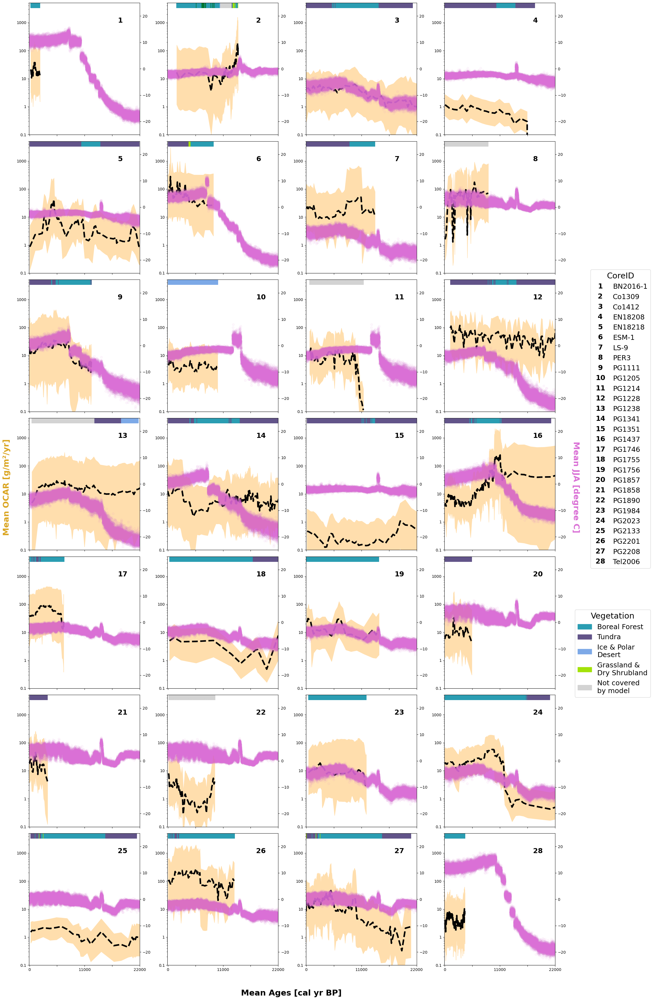

In [115]:
g = sns.relplot(data=combined_OCAR,
                x="age", y="Mean_OCAR", 
                col="coreid", color = 'black',
                kind="line", linestyle = '--',  
                linewidth=4, zorder=3, 
                col_wrap = 4#7
                )
                
core_legend = {}
core_counter = 1
for coreid, ax in g.axes_dict.items():
    ### Adding trace
    ax2 = ax.twinx()
    coreid_trace = pd.read_csv(f'RE3/output_data/{coreid}_JJA_temp_TraCe_data.csv')
    ax2.scatter(x = 'Summer months (Jule-July-August) of each years [yr BP]', y = 'Average summer mean temperature [degree C]', data = coreid_trace, color = 'orchid', 
                alpha = .05, 
                zorder = -1)
    ax2.set_ylim(-25, 25)
    ###
    ax.fill_between(x = combined_OCAR[(combined_OCAR.coreid.str.contains(coreid))].age, 
                    y1 = combined_OCAR[(combined_OCAR.coreid.str.contains(coreid))].Min_OCAR, 
                    y2 = combined_OCAR[(combined_OCAR.coreid.str.contains(coreid))].Max_OCAR, 
                    #alpha = .7,
                    color = 'navajowhite', label = 'Two Sigma Range', zorder = 2)
    #### Create a dictionary that holds the number and coreid, e.g., {1: 'PG1234', 2: 'EN20155'}
    core_legend[core_counter] = coreid
    #### This adds the title as an annotation within the plot
    ax.text(.8, .85, core_counter, transform=ax.transAxes, fontweight="bold", fontsize = 18)
    ax.set_yscale('log')
    ax.yaxis.set_major_formatter(ticker.FuncFormatter(lambda y, _: '{:g}'.format(y)))
    ####
    veg_core = all_biome[all_biome.coreid.str.contains(coreid)]
    x_min = veg_core.start.min()-1
    x_max = veg_core.end.max()
    z = veg_core.biome.values
    colors = [cmap_model_g(n) for n in z]
    colors.reverse()
    col_array = np.array(colors)
    col_arr = np.expand_dims(col_array, axis=0)
    x0,x1=x_min,x_max
    y0,y1=23,25
    ax2.imshow(col_arr, cmap=cmap_model_g, zorder=2, aspect = 'auto',
                    extent=(x0,x1,y0,y1), 
                    interpolation_stage = 'rgba')
    ax2.set_ylim(-25, 25)
    core_counter += 1

g.set_titles('')
g.set_axis_labels("","")
#### Set limits
xlim_min = int(1950 - datetime.datetime.now().year)
xlim_max = 22000
ylim_min = 0.1
ylim_max = None
g.set(ylim=(ylim_min, ylim_max))
g.set(xlim=(xlim_min, xlim_max))
g.tight_layout()

value_x_tick = range(0, xlim_max + int(xlim_max/4), int(xlim_max/4))
new_x_tick_labels = ['' if (value != 0) and (value != xlim_max) and (value != int(xlim_max/2)) else value for value in value_x_tick]
for ax in g.axes.flat:
    #value_y_tick = ax.get_yticks()
    #new_y_tick_labels = ['' if (value != ylim_min) and (value != (ylim_min*100)) and (value != (ylim_min*10000)) else value for value in value_y_tick]
    #ax.yaxis.set_major_locator(ticker.FixedLocator(value_y_tick))
    #ax.yaxis.set_major_formatter(ticker.FixedFormatter(new_y_tick_labels))
    ax.set_xticks(ticks=value_x_tick)
    ax.set_xticklabels(labels=new_x_tick_labels)

ids = [*core_legend]
handles_c = [(i, 'black') for i in ids]
labels_c = [core_legend[number] for number in core_legend.keys()]
g.fig.legend(handles=handles_c, labels=labels_c, handler_map={tuple : TextHandler()}, fontsize = fontsize_legend, loc = 'center right', bbox_to_anchor = (1.15, 0.57), title = 'CoreID', title_fontsize = titlesize_legend)
g.fig.text(.5, -0.02, 'Mean Ages [cal yr BP]', transform=g.fig.transFigure, horizontalalignment='center', fontsize = labelsize_axis, fontweight = 'bold')
g.fig.text(-0.01, .5, 'Mean OCAR [g/m²/yr]', transform=g.fig.transFigure, ha='center', va='center', fontsize = labelsize_axis, fontweight = 'bold', rotation = 'vertical', color = 'goldenrod')
g.fig.text(1.01, .5, 'Mean JJA [degree C]', transform=g.fig.transFigure, ha='center', va='center', fontsize = labelsize_axis, fontweight = 'bold', rotation = -90, color = 'orchid')

not_legend = mpatches.Patch(color='lightgrey', label='Not covered \nby model')
bor_legend = mpatches.Patch(color='#2a9db2', label='Boreal Forest')
tun_legend = mpatches.Patch(color='#625489', label='Tundra')
ice_legend = mpatches.Patch(color='#7da9e7', label='Ice & Polar \nDesert')
gra_legend = mpatches.Patch(color='#a3e209', label='Grassland & \nDry Shrubland')
handles_veg = [bor_legend, tun_legend, ice_legend, gra_legend, not_legend]
g.fig.legend(handles = handles_veg, bbox_to_anchor = (1.15, 0.33), title = 'Vegetation', loc = 'center right', fontsize = fontsize_legend, title_fontsize = titlesize_legend)

date = f"{datetime.datetime.now():%Y-%m-%d_%H-%M-%S}"
#plt.savefig(f'All_OCAR_vs_TRACE_veg_{date}.pdf', dpi = 300, bbox_inches = 'tight')
plt.show()

## Correlation for lake parameter

In [82]:
corr_para = location_mean_OCAR.drop(['sitename','vegetationzone', 'climatezone'], axis = 1)

In [83]:
for i, r in corr_para.iterrows():
    if corr_para.at[i, 'laketype'] == ' Tectonic lake':
        corr_para.at[i, 'laketype'] = 1
    elif corr_para.at[i, 'laketype'] == ' Glacial lake':
        corr_para.at[i, 'laketype'] = 2
    elif corr_para.at[i, 'laketype'] == ' Thermokarst lake':
        corr_para.at[i, 'laketype'] = 3
    elif corr_para.at[i, 'laketype'] == ' Shoreline lake':
        corr_para.at[i, 'laketype'] = 4
    else:
        corr_para.at[i, 'laketype'] = 5

In [84]:
corr_para = corr_para.astype(dtype = {
    'waterdepth': float,
    'corelength': float,
    'catchmentarea': float,
    'lakeextent': float,
    'lakedepth': float,
    'laketype': int
}).rename(columns = {
    'Mean_OCAR': 'Mean OCAR',
    'waterdepth': 'Core Drilling Water Depth',
    'corelength': 'Core Length',
    'catchmentarea': 'Catchment Area',
    'lakeextent': 'Lake Extent',
    'lakedepth': 'Max. Lake Water Depth',
    'laketype': 'Lake Type',
    'latitude': 'Latitude',
    'longitude': 'Longitude'
})

In [85]:
corr = corr_para.corr(numeric_only = True)

In [86]:
df_veg = pd.DataFrame([[result_veg_corr.loc['biome'].values[0], np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan, np.nan]],
                     columns = corr.columns,
                     index = ['Vegetation'])

In [87]:
corr = pd.concat([corr, df_veg])

In [88]:
corr

,Mean OCAR,Latitude,Longitude,Core Drilling Water Depth,Core Length,Catchment Area,Lake Extent,Max. Lake Water Depth,Lake Type
Mean OCAR,1.000000,-0.159006,-0.011462,-0.217895,0.101567,0.073334,0.079840,-0.242598,0.239706
Latitude,-0.159006,1.000000,-0.291267,0.114946,0.478103,-0.079932,-0.061726,-0.001149,0.078600
Longitude,-0.011462,-0.291267,1.000000,-0.187662,-0.269141,-0.325893,-0.319928,-0.251706,0.357914
Core Drilling Water Depth,-0.217895,0.114946,-0.187662,1.000000,0.553582,0.373972,0.362901,0.737763,0.093067
Core Length,0.101567,0.478103,-0.269141,0.553582,1.000000,0.491972,0.504528,0.467015,-0.018510
Catchment Area,0.073334,-0.079932,-0.325893,0.373972,0.491972,1.000000,0.998167,0.404240,-0.080533
Lake Extent,0.079840,-0.061726,-0.319928,0.362901,0.504528,0.998167,1.000000,0.374585,-0.062629
Max. Lake Water Depth,-0.242598,-0.001149,-0.251706,0.737763,0.467015,0.404240,0.374585,1.000000,-0.330220
Lake Type,0.239706,0.078600,0.357914,0.093067,-0.018510,-0.080533,-0.062629,-0.330220,1.000000
Vegetation,0.047409,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [89]:
corr = corr.reindex(index = ['Mean OCAR', 'Vegetation', 'Latitude', 'Longitude', 'Core Drilling Water Depth', 'Core Length',
                     'Catchment Area', 'Lake Extent', 'Max. Lake Water Depth', 'Lake Type'])

In [90]:
matrix = np.triu(corr)
#np.fill_diagonal(matrix, False)

In [91]:
matrix[2][1] = 1
matrix[3][2] = 1
matrix[4][3] = 1
matrix[5][4] = 1
matrix[6][5] = 1
matrix[7][6] = 1
matrix[8][7] = 1
matrix[9][8] = 1

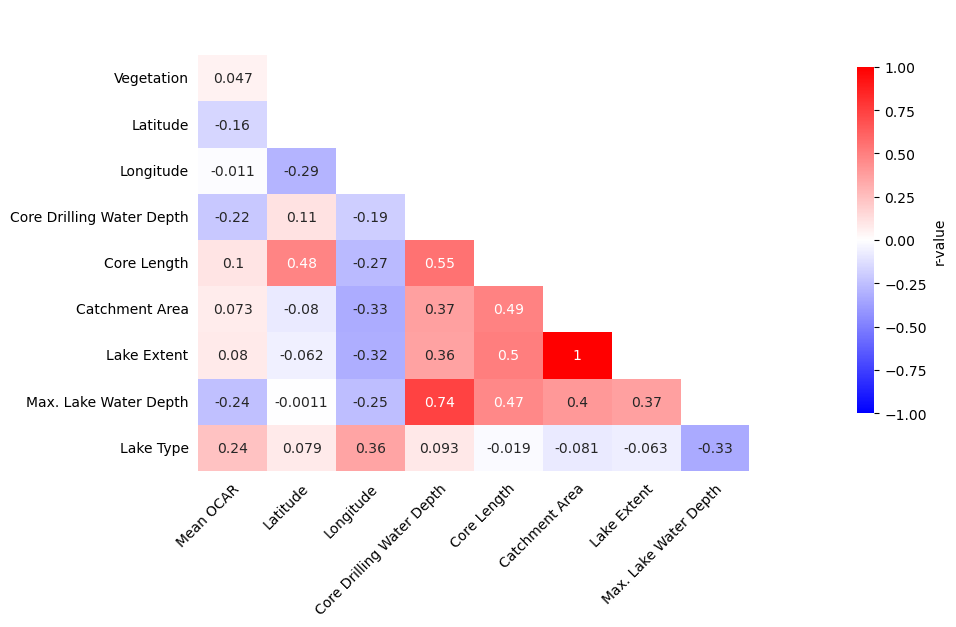

In [92]:
fig = plt.figure(figsize=(10,6))
ax1 = fig.add_subplot(111)
heatmap = sns.heatmap(corr, annot=True, cmap = "bwr", 
                      mask=matrix, 
                      vmin=-1, vmax=1, ax=ax1, cbar_kws={'label': 'r-value', 'shrink': 0.75})
yticks = heatmap.get_yticks()
yticks = yticks[1:]
heatmap.set_yticks(yticks)
xticks = heatmap.get_xticks()
xticks = xticks[:-1]
heatmap.set_xticks(xticks)
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation = 45, ha='right', rotation_mode='anchor')
ax1.tick_params(left=False, bottom=False)
#plt.savefig(f'Correlation_Parameters_OCAR.jpg', dpi = 300, bbox_inches = 'tight')
plt.show()